# Visualization Notebook

# 1. Setup and Utility Functions

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

METRICS = ['precision', 'recall', 'f1', 'fpr', 'accuracy']
DEFAULT_RETRIEVALS = ['random', 'lexical', 'semantic']

def aggregate_performance_data(
    exp_name: str,
    model_name: str,
    results_all_df: pd.DataFrame,
    filtered_shots=None,
    filtered_metrics=METRICS,
    filtered_retrieval_name=DEFAULT_RETRIEVALS,
    aggregate_retrieval_name='random',
):
    if model_name == '':
        filtered_df = pd.DataFrame(
            results_all_df[(results_all_df['exp'] == exp_name)],
            columns=['exp', 'model', 'random_seed', 'n_shots', 'retrieval'] + filtered_metrics,
        )
    else:
        filtered_df = pd.DataFrame(
            results_all_df[
                (results_all_df['exp'] == exp_name)
                & (results_all_df['model'] == model_name)
            ],
            columns=['exp', 'model', 'random_seed', 'n_shots', 'retrieval'] + filtered_metrics,
        )

    aggregation_cols = ['precision', 'recall', 'f1', 'fpr', 'accuracy']
    performance_dfs = []

    if filtered_shots is None:
        filtered_shots = filtered_df['n_shots'].unique()

    for n in filtered_shots:
        for retrieval_method in filtered_retrieval_name:
            method_df = filtered_df[
                (filtered_df['n_shots'] == n)
                & (filtered_df['retrieval'] == retrieval_method)
            ]
            if retrieval_method == aggregate_retrieval_name:
                group_cols = ['n_shots']
                if model_name == '':
                    group_cols.append('model')
                agg_dict_local = {
                    col: ('mean' if col in aggregation_cols else 'first')
                    for col in method_df.columns
                    if col not in group_cols
                }
                if len(agg_dict_local) > 0:
                    method_df = method_df.groupby(group_cols).agg(agg_dict_local).reset_index()
                else:
                    method_df = method_df.copy()
            performance_dfs.append(method_df)

    return pd.concat(performance_dfs, ignore_index=True)


def calc_std_data(
    exp_name,
    model_name,
    results_all_df,
    retrieval_name: str = 'random',
):
    filtered_df = pd.DataFrame(
        results_all_df[
            (results_all_df['exp'] == exp_name)
            & (results_all_df['model'] == model_name)
        ]
    )

    aggregation_dict = {
        col: 'std' if col in METRICS else 'first'
        for col in filtered_df.columns
    }

    std_dfs = []
    for n in filtered_df['n_shots'].unique():
        random_df = filtered_df[
            (filtered_df['n_shots'] == n)
            & (filtered_df['retrieval'] == retrieval_name)
        ]
        if n == 0:
            random_df.loc[:, METRICS] = 0
            std_dfs.append(random_df)
        else:
            random_df = random_df.groupby('n_shots').agg(aggregation_dict).reset_index(drop=True)
            std_dfs.append(random_df)

    std_df = pd.concat(std_dfs, ignore_index=True)
    std_df.rename(
        columns={
            'precision': 'precision_std',
            'recall': 'recall_std',
            'f1': 'f1_std',
            'fpr': 'fpr_std',
            'accuracy': 'accuracy_std',
        },
        inplace=True,
    )
    return std_df


plt.rcParams.update({
    'figure.facecolor': 'white',
    'axes.facecolor': 'white',
    'axes.edgecolor': 'black',
    'axes.linewidth': 1.2,
    'axes.grid': False,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.top': False,
    'ytick.right': False,
    'xtick.major.width': 1.2,
    'ytick.major.width': 1.2,
    'font.family': 'Times New Roman',
    'font.size': 16,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'legend.frameon': True,
    'legend.fancybox': False,
    'legend.framealpha': 1.0,
})


def visualize_performance(
    df,
    std_df,
    model_name,
    task_name='binary',
    metrics=METRICS,
    retrieval_methods=DEFAULT_RETRIEVALS,
    std_retrieval_name='random',
):
    palette = plt.get_cmap('Set1')
    shots = df['n_shots'].unique().astype(np.str_)

    for metric in metrics:
        plt.figure(figsize=(10, 6))
        plt.xticks(np.arange(len(shots)), shots)

        for retrieval in retrieval_methods:
            subset = df[df['retrieval'] == retrieval]
            x_vals = subset['n_shots'].unique().astype(np.str_)
            if retrieval == std_retrieval_name:
                plt.errorbar(
                    x_vals,
                    subset[metric],
                    yerr=std_df[f'{metric}_std'],
                    marker='o',
                    linestyle='-',
                    color=palette(retrieval_methods.index(retrieval)),
                    linewidth=2.5,
                    alpha=0.9,
                    elinewidth=1,
                    capsize=4,
                    capthick=1,
                    label=retrieval,
                )
            else:
                plt.plot(
                    x_vals,
                    subset[metric],
                    marker='o',
                    linestyle='-',
                    color=palette(retrieval_methods.index(retrieval)),
                    linewidth=2.5,
                    alpha=0.9,
                    label=retrieval,
                )

        plt.legend(loc='upper left', title='Retrieval Method')
        plt.title(
            f'{task_name} {model_name}: {metric.capitalize()}',
            loc='center',
            fontsize=18,
            fontweight=0,
            color='orange',
        )
        plt.xlabel('Number of Shots')
        plt.ylabel(metric.capitalize())
        plt.show()

# 2. Binary Task Analysis

In [3]:
import json
pd.set_option('display.max_rows', None)

output_dir = "./Result/task_binary"
# output_dir = "/content/drive/MyDrive/LLM_ICL/Workspace/Result"

results_all = []
with open(f'{output_dir}/results_all.json', 'r') as f:
    for line in f.readlines():
        results_all.append(json.loads(line))


binary_results_all_df = pd.DataFrame(results_all)
# Split the 'metrics' column into separate columns
metrics_df = binary_results_all_df['metrics'].apply(pd.Series)
# Merge the new columns back into the original dataframe
binary_results_all_df = pd.concat([binary_results_all_df.drop('metrics', axis=1), metrics_df], axis=1)
display(binary_results_all_df)

,exp,task,model,random_seed,n_shots,retrieval,precision,recall,f1,fpr,accuracy,pos_label
0,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,0,random,0.688202,0.924528,0.789050,0.378840,0.765233,illicit
1,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,0,lexical,0.688202,0.924528,0.789050,0.378840,0.765233,illicit
2,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,0,semantic,0.688202,0.924528,0.789050,0.378840,0.765233,illicit
3,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,2,random,0.622249,0.956767,0.754074,0.525510,0.703571,illicit
4,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,43,2,random,0.805941,0.765038,0.784957,0.166667,0.800893,illicit
5,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,44,2,random,0.722701,0.945489,0.819218,0.328231,0.801786,illicit
6,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,45,2,random,0.750411,0.859023,0.801052,0.258503,0.797321,illicit
7,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,46,2,random,0.660194,0.894737,0.759777,0.417376,0.731010,illicit
8,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,47,2,random,0.595156,0.969925,0.737670,0.596939,0.672321,illicit
9,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,48,2,random,0.548755,0.994361,0.707219,0.739796,0.608929,illicit


## Exp1

### Figure 1a

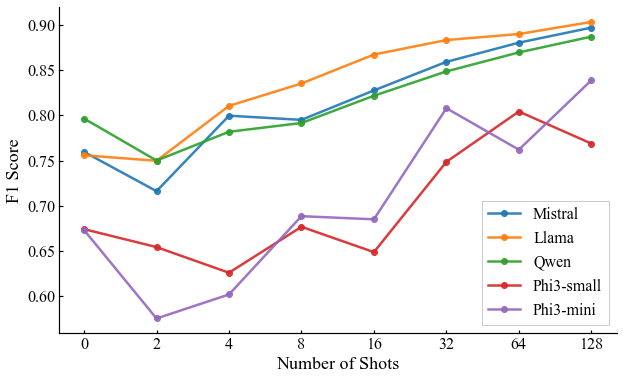

In [6]:
# @ exp1_binary_comparison

exp1_llms_binary_performance_df = aggregate_performance_data('exp1', '', binary_results_all_df, filtered_retrieval_name=['random'], aggregate_retrieval_name='random',)
# display(exp1_llms_binary_performance_df)


for metric in ['f1']:
    plt.figure(figsize=(10, 6))


    plt.xticks(np.arange(len(exp1_llms_binary_performance_df['n_shots'].unique().astype(np.str_))), exp1_llms_binary_performance_df['n_shots'].unique().astype(np.str_))
    models = ['mistralai/Mistral-7B-Instruct-v0.2', 'meta-llama/Meta-Llama-3.1-8B-Instruct', 'Qwen/Qwen2.5-7B-Instruct','microsoft/Phi-3-small-128k-instruct', 'microsoft/Phi-3-mini-128k-instruct']
    for model in models:
        model_data = exp1_llms_binary_performance_df[exp1_llms_binary_performance_df['model'] == model]
        plt.plot(model_data['n_shots'].unique().astype(np.str_), model_data[metric], marker='o', linestyle='-', linewidth=2.5, alpha=0.9, label=model)

    # map full model names to short labels for legend
    label_map = {
        'mistralai/Mistral-7B-Instruct-v0.2': 'Mistral',
        'meta-llama/Meta-Llama-3.1-8B-Instruct': 'Llama',
        'Qwen/Qwen2.5-7B-Instruct': 'Qwen',
        'microsoft/Phi-3-small-128k-instruct': 'Phi3-small',
        'microsoft/Phi-3-mini-128k-instruct': 'Phi3-mini'
    }

    ax = plt.gca()
    for line in ax.get_lines():
        lbl = line.get_label()
        if lbl in label_map:
            line.set_label(label_map[lbl])

    # plt.title(f'Performance Plateau in Binary Classification with Increasing Number of Shots', loc='center', fontsize=18, fontweight=0)
    plt.xlabel('Number of Shots')
    plt.ylabel('F1 Score')

    plt.legend(loc='best')

    # hide top and right spines for all open figures/axes
    for fig_num in plt.get_fignums():
        fig = plt.figure(fig_num)
        for ax in fig.axes:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.tick_params(top=False, right=False)
            fig = plt.gcf()

            filename_base = f"exp1_binary_random_f1"
            fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

            # plt.close(fig)


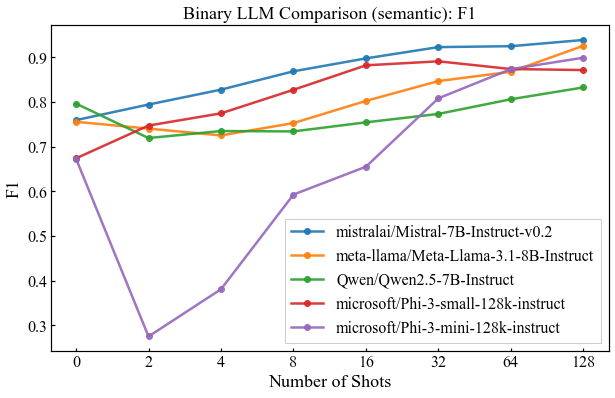

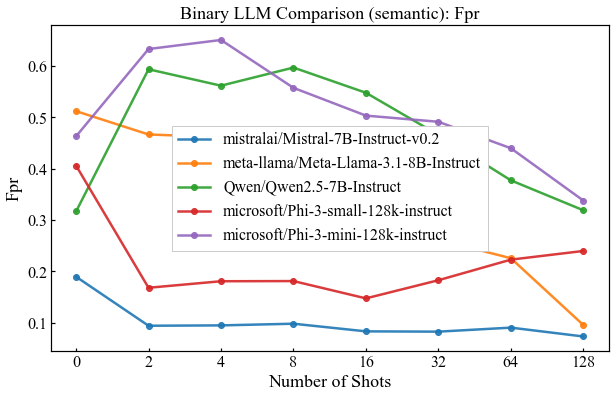

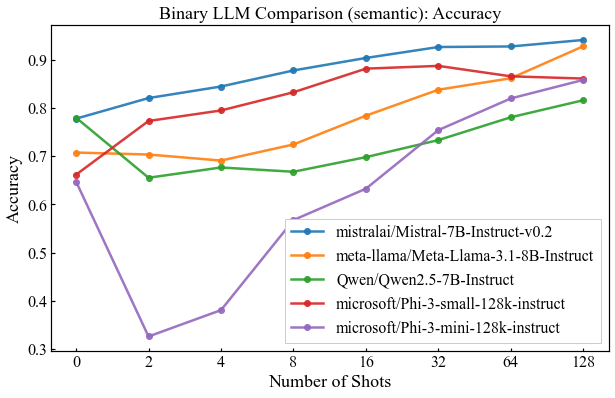

In [7]:
# @ exp1_binary_comparison

exp1_llms_binary_performance_df = aggregate_performance_data('exp1', '', binary_results_all_df, filtered_metrics=['f1', 'fpr', 'accuracy'], filtered_retrieval_name=['semantic'])
# display(exp1_llms_binary_performance_df)


for metric in ['f1', 'fpr', 'accuracy']:
    plt.figure(figsize=(10, 6))
    plt.xticks(np.arange(len(exp1_llms_binary_performance_df['n_shots'].unique().astype(np.str_))), exp1_llms_binary_performance_df['n_shots'].unique().astype(np.str_))
    models = ['mistralai/Mistral-7B-Instruct-v0.2', 'meta-llama/Meta-Llama-3.1-8B-Instruct', 'Qwen/Qwen2.5-7B-Instruct','microsoft/Phi-3-small-128k-instruct', 'microsoft/Phi-3-mini-128k-instruct']
    for model in models:
        model_data = exp1_llms_binary_performance_df[exp1_llms_binary_performance_df['model'] == model]
        plt.plot(model_data['n_shots'].unique().astype(np.str_), model_data[metric], marker='o', linestyle='-', linewidth=2.5, alpha=0.9, label=model)


    plt.title(f'Binary LLM Comparison (semantic): {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    plt.xlabel('Number of Shots')
    plt.ylabel(metric.capitalize())

    plt.legend(loc='best')

    plt.show()


### Llama3

C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,random,0.688202,0.924528,0.789050,0.378840,0.765233
1,0,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,lexical,0.688202,0.924528,0.789050,0.378840,0.765233
2,0,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,semantic,0.688202,0.924528,0.789050,0.378840,0.765233
3,2,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,random,0.671976,0.887970,0.747366,0.443949,0.713726
4,2,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,lexical,0.676568,0.770677,0.720562,0.333333,0.716071
5,2,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,semantic,0.718400,0.843985,0.776145,0.299320,0.768750
6,4,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,random,0.779583,0.848872,0.805344,0.232483,0.806161
7,4,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,lexical,0.706690,0.774436,0.739013,0.290816,0.740179
8,4,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,semantic,0.747387,0.806391,0.775769,0.246599,0.778571
9,8,exp1,meta-llama/Meta-Llama-3-8B-Instruct,42,random,0.851205,0.785526,0.807685,0.135204,0.827143


,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,0,random,0.000000,0.000000,0.000000,0.000000,0.000000,illicit
1,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,2,random,0.111188,0.140648,0.048286,0.236646,0.077243,illicit
2,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,4,random,0.073378,0.096329,0.027435,0.107570,0.027924,illicit
3,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,8,random,0.057012,0.124960,0.047419,0.074262,0.024651,illicit
4,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,16,random,0.034706,0.114284,0.054568,0.044529,0.034962,illicit
5,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,32,random,0.040627,0.086341,0.037009,0.052457,0.027798,illicit
6,exp1,binary,meta-llama/Meta-Llama-3-8B-Instruct,42,64,random,0.022990,0.093429,0.045489,0.028259,0.033000,illicit


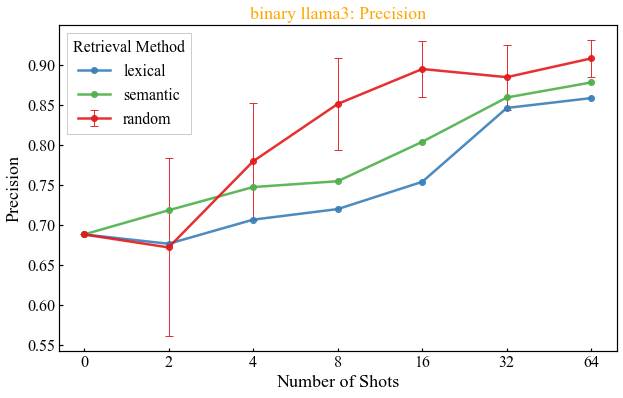

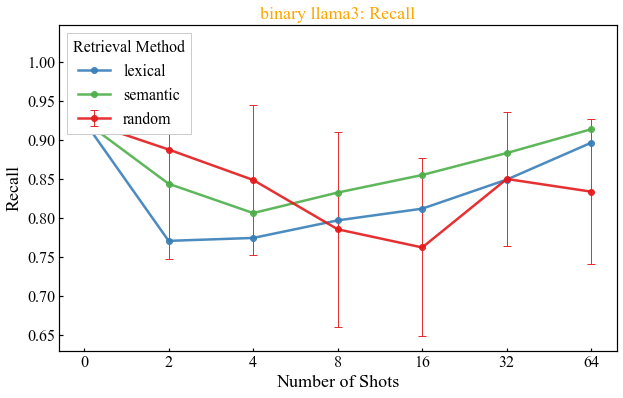

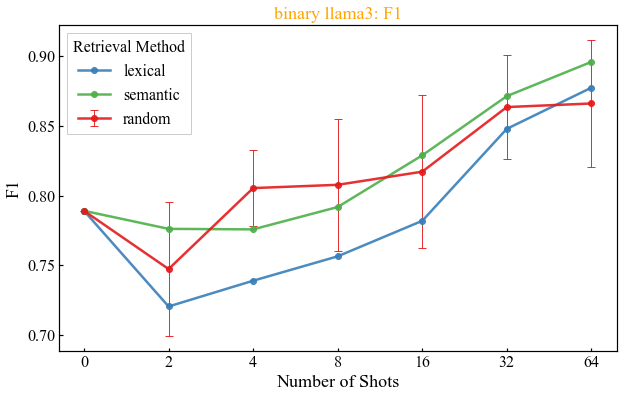

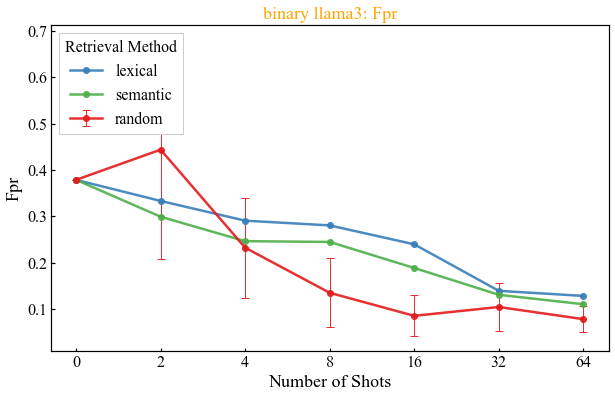

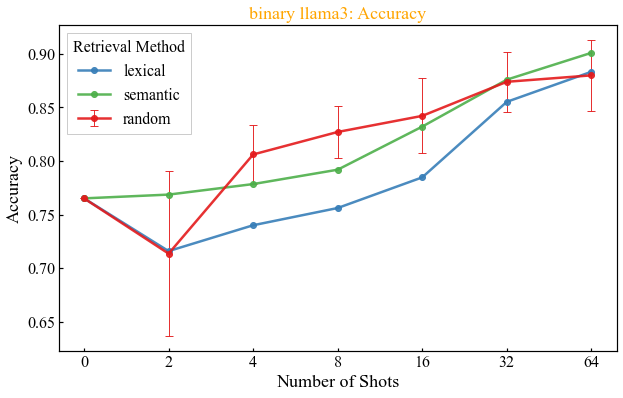

In [8]:
exp1_llama3_performance_df = aggregate_performance_data('exp1', 'meta-llama/Meta-Llama-3-8B-Instruct', binary_results_all_df)
exp1_llama3_random_std_df = calc_std_data('exp1', 'meta-llama/Meta-Llama-3-8B-Instruct', binary_results_all_df)
display(exp1_llama3_performance_df)
display(exp1_llama3_random_std_df)
visualize_performance(exp1_llama3_performance_df, exp1_llama3_random_std_df, 'llama3')


### Llama3.1

C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.629114,0.946667,0.755894,0.512238,0.707384
1,0,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,lexical,0.629114,0.946667,0.755894,0.512238,0.707384
2,0,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,semantic,0.629114,0.946667,0.755894,0.512238,0.707384
3,2,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.649796,0.916611,0.749785,0.498863,0.698930
4,2,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,lexical,0.635135,0.883459,0.738994,0.460751,0.703041
5,2,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,semantic,0.633690,0.890977,0.740625,0.466780,0.703307
6,4,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.732845,0.911413,0.810553,0.309092,0.795926
7,4,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,lexical,0.626207,0.854991,0.722930,0.462457,0.688451
8,4,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,semantic,0.627747,0.859023,0.725397,0.461670,0.690795
9,8,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.792927,0.890414,0.835327,0.221412,0.831818


,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp1,binary,meta-llama/Meta-Llama-3.1-8B-Instruct,42,0,random,0.000000,0.000000,0.000000,0.000000,0.000000,illicit
1,exp1,binary,meta-llama/Meta-Llama-3.1-8B-Instruct,42,2,random,0.106391,0.087996,0.052503,0.264889,0.105640,illicit
2,exp1,binary,meta-llama/Meta-Llama-3.1-8B-Instruct,42,4,random,0.048642,0.039366,0.023133,0.089378,0.034869,illicit
3,exp1,binary,meta-llama/Meta-Llama-3.1-8B-Instruct,42,8,random,0.063006,0.053476,0.019970,0.099797,0.031739,illicit
4,exp1,binary,meta-llama/Meta-Llama-3.1-8B-Instruct,42,16,random,0.032075,0.038279,0.012857,0.039648,0.012315,illicit
5,exp1,binary,meta-llama/Meta-Llama-3.1-8B-Instruct,42,32,random,0.045939,0.036600,0.018435,0.061546,0.022157,illicit
6,exp1,binary,meta-llama/Meta-Llama-3.1-8B-Instruct,42,64,random,0.032555,0.043484,0.019408,0.041757,0.018549,illicit
7,exp1,binary,meta-llama/Meta-Llama-3.1-8B-Instruct,42,128,random,0.019960,0.040249,0.018590,0.021007,0.015492,illicit


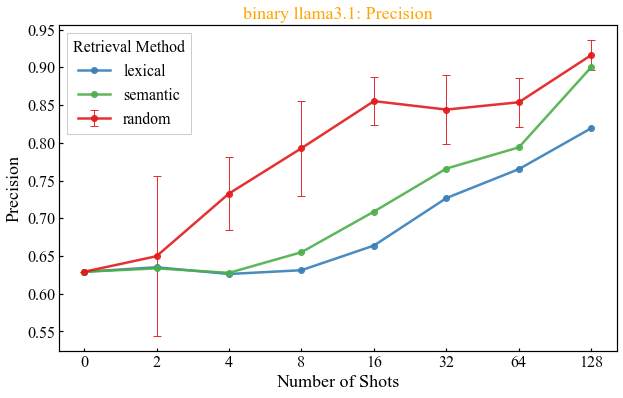

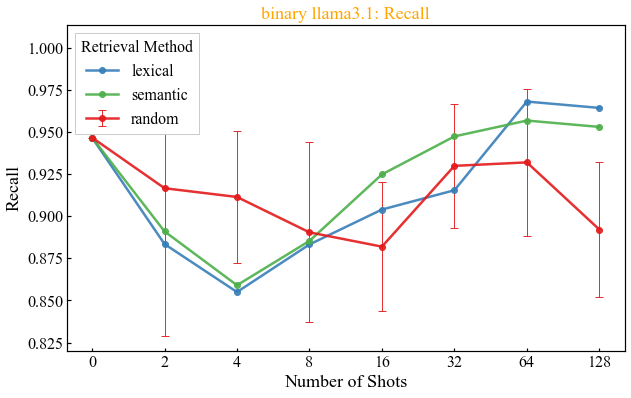

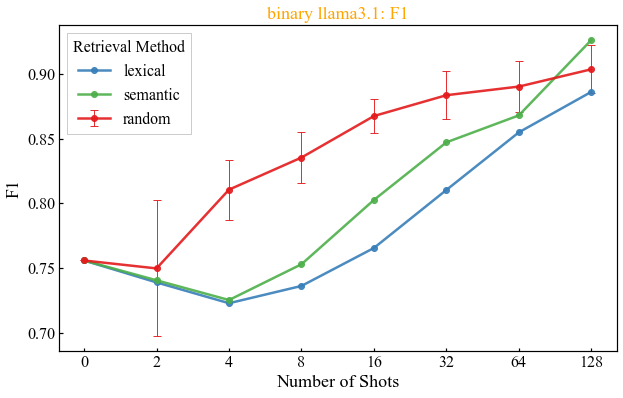

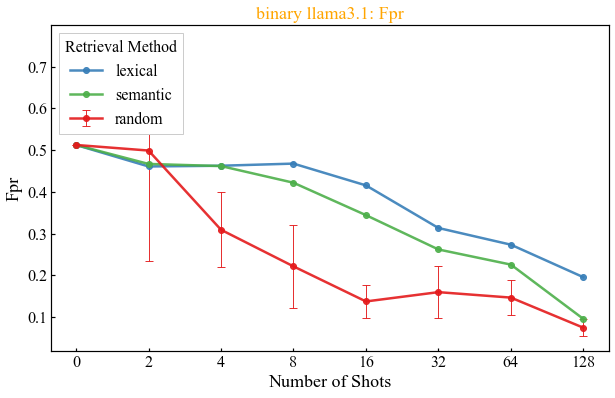

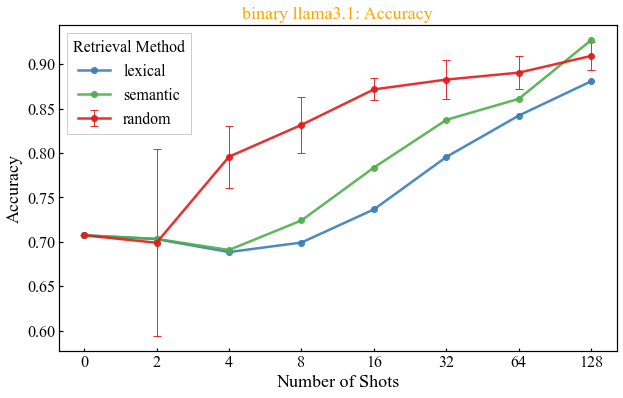

In [9]:
exp1_llama3_1_performance_df = aggregate_performance_data('exp1', 'meta-llama/Meta-Llama-3.1-8B-Instruct', binary_results_all_df)
exp1_llama3_1_random_std_df = calc_std_data('exp1', 'meta-llama/Meta-Llama-3.1-8B-Instruct', binary_results_all_df)
display(exp1_llama3_1_performance_df)
display(exp1_llama3_1_random_std_df)
visualize_performance(exp1_llama3_1_performance_df, exp1_llama3_1_random_std_df, 'llama3.1')


### Mistral

### Figure 2a

C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


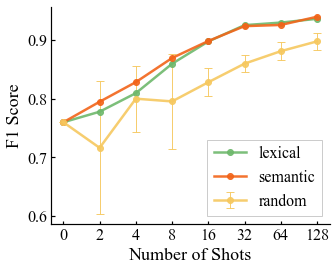

In [10]:

exp1_mistral_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp1_mistral_random_std_df = calc_std_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)

# visualize_performance(exp1_mistral_performance_df, exp1_mistral_random_std_df, 'mistral', task_name='binary', metrics=['f1', 'fpr'])
colors = ['#F6C85F', '#6EB86C', '#F26419']


for metric in ['f1']:
        plt.figure(figsize=(5, 4))
        palette = plt.get_cmap('Set1')
        plt.xticks(np.arange(len(exp1_mistral_performance_df['n_shots'].unique().astype(np.str_))), exp1_mistral_performance_df['n_shots'].unique().astype(np.str_))


        for retrieval in ['random', 'lexical', 'semantic']:
            if retrieval == 'random':
                subset = exp1_mistral_performance_df[exp1_mistral_performance_df['retrieval'] == 'random']
                std_subset = exp1_mistral_random_std_df
                plt.errorbar(subset['n_shots'].unique().astype(np.str_), subset[metric], yerr=std_subset[f'{metric}_std'], marker='o', linestyle='-', color=colors[['random', 'lexical', 'semantic'].index(retrieval)], linewidth=2.5, alpha=0.9, elinewidth=1, capsize=4, capthick=1, label=retrieval)
            else:
                subset = exp1_mistral_performance_df[exp1_mistral_performance_df['retrieval'] == retrieval]
                # Plot as line with markers for all points
                plt.plot(subset['n_shots'].unique().astype(np.str_), subset[metric], marker='o', linestyle='-', color=colors[['random', 'lexical', 'semantic'].index(retrieval)], linewidth=2.5, alpha=0.9, label=retrieval)
        # Add legend
        plt.legend(loc='best')

        # Add titles and labels
        plt.xlabel('Number of Shots')
        plt.ylabel('F1 Score')

        # Show the plot
        # plt.show()

        for fig_num in plt.get_fignums():
            fig = plt.figure(fig_num)
            for ax in fig.axes:
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.tick_params(top=False, right=False)
                fig = plt.gcf()

                filename_base = f"exp1_binary_mistral_f1"
                fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

                # plt.close(fig)


C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.779070,0.741150,0.759637,0.189621,0.777545
1,0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,lexical,0.779070,0.741150,0.759637,0.189621,0.777545
2,0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.779070,0.741150,0.759637,0.189621,0.777545
3,2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.770824,0.690745,0.716139,0.179275,0.767709
4,2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,lexical,0.884521,0.693642,0.777538,0.085766,0.806935
5,2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.876168,0.726744,0.794492,0.094139,0.820204
6,4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.809240,0.803832,0.799692,0.195613,0.804685
7,4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,lexical,0.882353,0.747126,0.809129,0.094718,0.828198
8,4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.884026,0.778420,0.827869,0.094812,0.844156
9,8,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.821704,0.791552,0.795070,0.181599,0.805190


,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp1,binary,mistralai/Mistral-7B-Instruct-v0.2,42,0,random,0.000000,0.000000,0.000000,0.000000,0.000000,illicit
1,exp1,binary,mistralai/Mistral-7B-Instruct-v0.2,42,2,random,0.060722,0.172474,0.113227,0.079610,0.043507,illicit
2,exp1,binary,mistralai/Mistral-7B-Instruct-v0.2,42,4,random,0.039807,0.115534,0.056158,0.064772,0.031507,illicit
3,exp1,binary,mistralai/Mistral-7B-Instruct-v0.2,42,8,random,0.045090,0.151994,0.080160,0.083610,0.048380,illicit
4,exp1,binary,mistralai/Mistral-7B-Instruct-v0.2,42,16,random,0.029448,0.066210,0.023768,0.048466,0.014732,illicit
5,exp1,binary,mistralai/Mistral-7B-Instruct-v0.2,42,32,random,0.026960,0.042313,0.013977,0.041482,0.011153,illicit
6,exp1,binary,mistralai/Mistral-7B-Instruct-v0.2,42,64,random,0.027965,0.038837,0.015309,0.039332,0.014186,illicit
7,exp1,binary,mistralai/Mistral-7B-Instruct-v0.2,42,128,random,0.017734,0.040217,0.014066,0.026153,0.011429,illicit


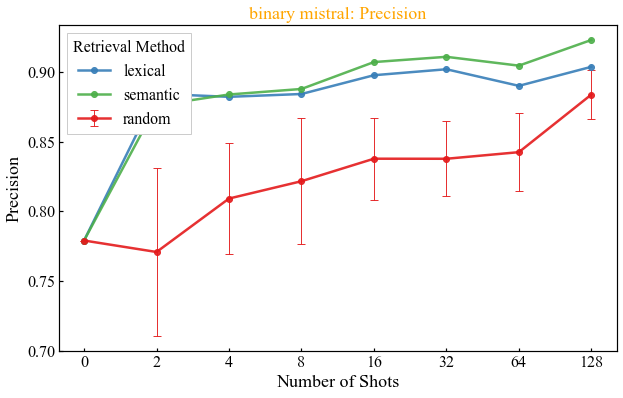

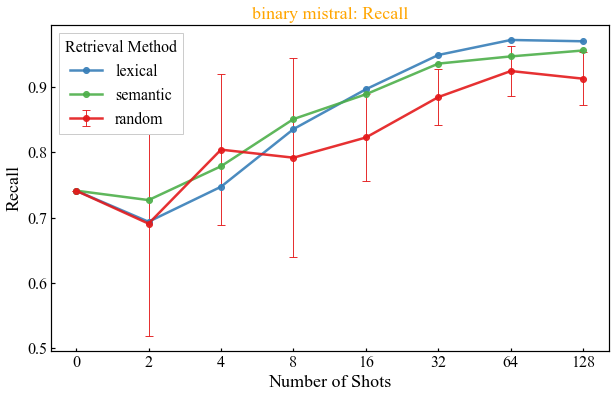

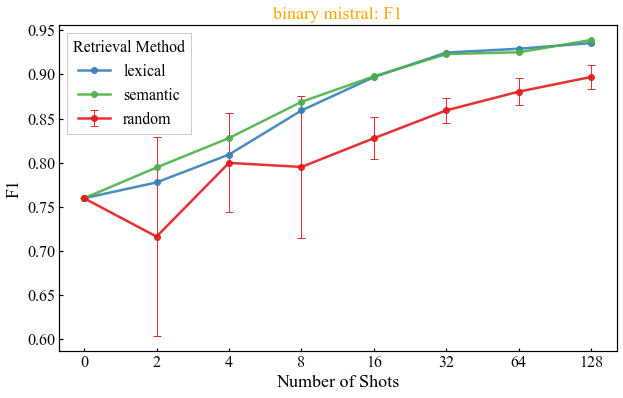

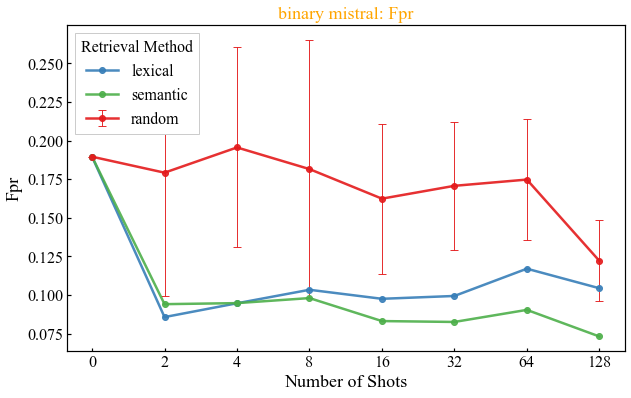

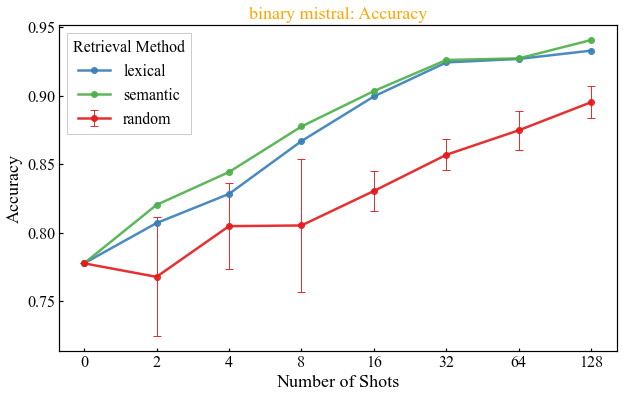

In [11]:
exp1_mistral_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp1_mistral_random_std_df = calc_std_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
display(exp1_mistral_performance_df)
display(exp1_mistral_random_std_df)
visualize_performance(exp1_mistral_performance_df, exp1_mistral_random_std_df, 'mistral')

### Phi3small

C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp1,microsoft/Phi-3-small-128k-instruct,42,random,0.621622,0.736347,0.674138,0.406143,0.661594
1,0,exp1,microsoft/Phi-3-small-128k-instruct,42,lexical,0.621622,0.736347,0.674138,0.406143,0.661594
2,0,exp1,microsoft/Phi-3-small-128k-instruct,42,semantic,0.621622,0.736347,0.674138,0.406143,0.661594
3,2,exp1,microsoft/Phi-3-small-128k-instruct,42,random,0.696734,0.655770,0.654276,0.277931,0.691297
4,2,exp1,microsoft/Phi-3-small-128k-instruct,42,lexical,0.786207,0.718487,0.750823,0.161739,0.784015
5,2,exp1,microsoft/Phi-3-small-128k-instruct,42,semantic,0.792291,0.707457,0.747475,0.168111,0.772727
6,4,exp1,microsoft/Phi-3-small-128k-instruct,42,random,0.659797,0.630012,0.625895,0.264315,0.694063
7,4,exp1,microsoft/Phi-3-small-128k-instruct,42,lexical,0.724359,0.763514,0.743421,0.172345,0.803774
8,4,exp1,microsoft/Phi-3-small-128k-instruct,42,semantic,0.784017,0.765823,0.774813,0.180832,0.794547
9,8,exp1,microsoft/Phi-3-small-128k-instruct,42,random,0.736322,0.648585,0.676734,0.226689,0.715767


,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp1,binary,microsoft/Phi-3-small-128k-instruct,42,0,random,0.000000,0.000000,0.000000,0.000000,0.000000,illicit
1,exp1,binary,microsoft/Phi-3-small-128k-instruct,42,2,random,0.058868,0.184638,0.106371,0.120069,0.035021,illicit
2,exp1,binary,microsoft/Phi-3-small-128k-instruct,42,4,random,0.072696,0.192161,0.105765,0.150970,0.036961,illicit
3,exp1,binary,microsoft/Phi-3-small-128k-instruct,42,8,random,0.044729,0.159165,0.073858,0.115060,0.027820,illicit
4,exp1,binary,microsoft/Phi-3-small-128k-instruct,42,16,random,0.042482,0.107516,0.077717,0.046047,0.037015,illicit
5,exp1,binary,microsoft/Phi-3-small-128k-instruct,42,32,random,0.042481,0.101518,0.056739,0.052156,0.034654,illicit
6,exp1,binary,microsoft/Phi-3-small-128k-instruct,42,64,random,0.034135,0.083522,0.042570,0.044715,0.031219,illicit
7,exp1,binary,microsoft/Phi-3-small-128k-instruct,42,128,random,0.026616,0.152348,0.109624,0.043733,0.043455,illicit


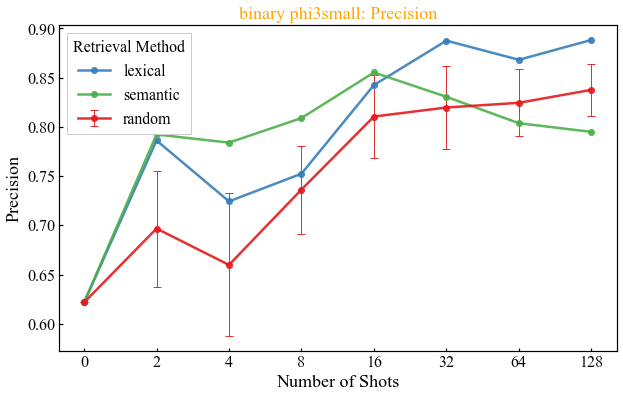

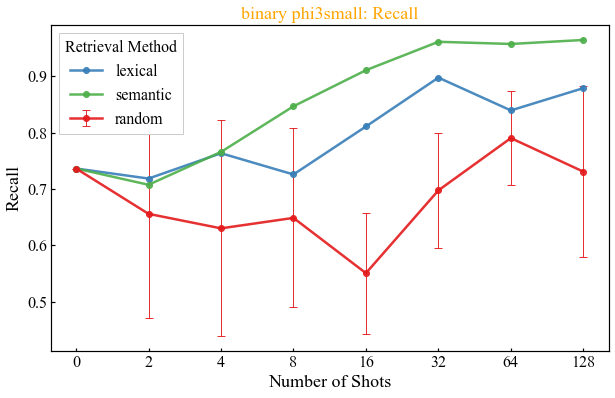

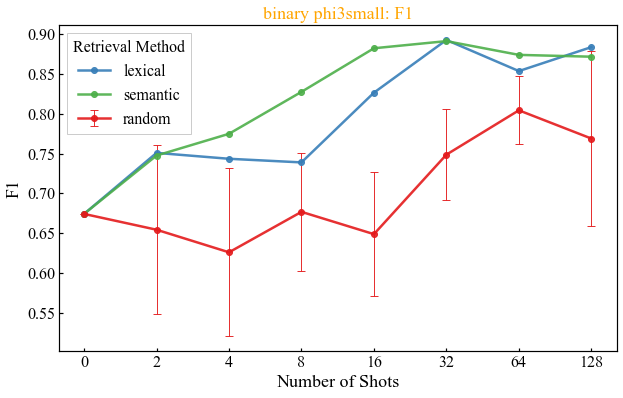

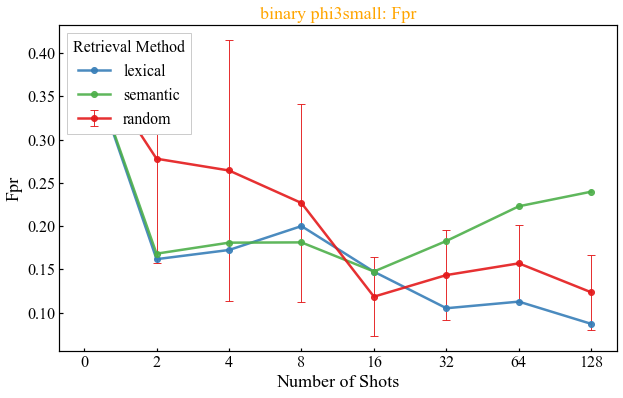

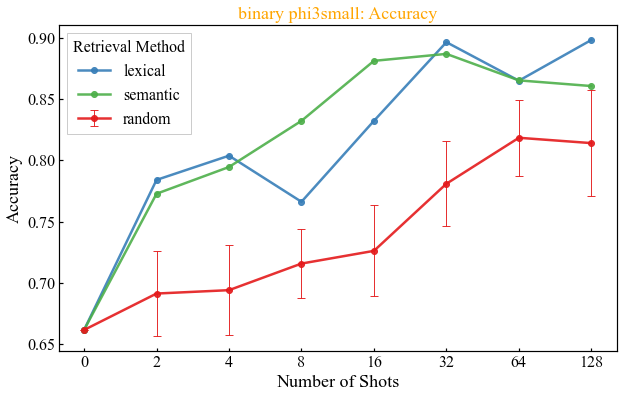

In [12]:
exp1_phi3small_performance_df = aggregate_performance_data('exp1', 'microsoft/Phi-3-small-128k-instruct', binary_results_all_df)
exp1_phi3small_random_std_df = calc_std_data('exp1', 'microsoft/Phi-3-small-128k-instruct', binary_results_all_df)
display(exp1_phi3small_performance_df)
display(exp1_phi3small_random_std_df)
visualize_performance(exp1_phi3small_performance_df, exp1_phi3small_random_std_df, 'phi3small')

### Phi3mini

C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp1,microsoft/Phi-3-mini-128k-instruct,42,random,0.596875,0.771717,0.673128,0.463196,0.647338
1,0,exp1,microsoft/Phi-3-mini-128k-instruct,42,lexical,0.596875,0.771717,0.673128,0.463196,0.647338
2,0,exp1,microsoft/Phi-3-mini-128k-instruct,42,semantic,0.596875,0.771717,0.673128,0.463196,0.647338
3,2,exp1,microsoft/Phi-3-mini-128k-instruct,42,random,0.664666,0.638000,0.575277,0.405256,0.614231
4,2,exp1,microsoft/Phi-3-mini-128k-instruct,42,lexical,0.217822,0.210024,0.213852,0.673774,0.271396
5,2,exp1,microsoft/Phi-3-mini-128k-instruct,42,semantic,0.271739,0.279018,0.275330,0.633270,0.326510
6,4,exp1,microsoft/Phi-3-mini-128k-instruct,42,random,0.711457,0.579359,0.601852,0.334508,0.625365
7,4,exp1,microsoft/Phi-3-mini-128k-instruct,42,lexical,0.272085,0.292776,0.282051,0.675410,0.309859
8,4,exp1,microsoft/Phi-3-mini-128k-instruct,42,semantic,0.349081,0.419558,0.381089,0.650919,0.381089
9,8,exp1,microsoft/Phi-3-mini-128k-instruct,42,random,0.732265,0.669434,0.688473,0.333141,0.673244


,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp1,binary,microsoft/Phi-3-mini-128k-instruct,42,0,random,0.000000,0.000000,0.000000,0.000000,0.000000,illicit
1,exp1,binary,microsoft/Phi-3-mini-128k-instruct,42,2,random,0.100505,0.344759,0.198668,0.328110,0.064590,illicit
2,exp1,binary,microsoft/Phi-3-mini-128k-instruct,42,4,random,0.046349,0.267685,0.157569,0.234069,0.065163,illicit
3,exp1,binary,microsoft/Phi-3-mini-128k-instruct,42,8,random,0.037070,0.152714,0.076535,0.137850,0.041541,illicit
4,exp1,binary,microsoft/Phi-3-mini-128k-instruct,42,16,random,0.069164,0.191771,0.104198,0.184366,0.053494,illicit
5,exp1,binary,microsoft/Phi-3-mini-128k-instruct,42,32,random,0.059071,0.101328,0.021807,0.208954,0.023014,illicit
6,exp1,binary,microsoft/Phi-3-mini-128k-instruct,42,64,random,0.179945,0.110993,0.149526,0.095376,0.086123,illicit
7,exp1,binary,microsoft/Phi-3-mini-128k-instruct,42,128,random,0.140623,0.023943,0.098552,0.192639,0.118656,illicit


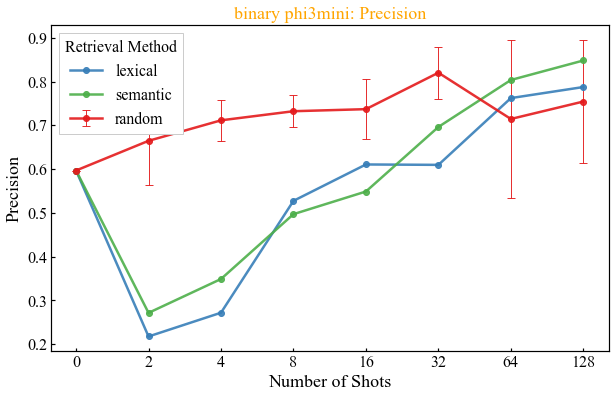

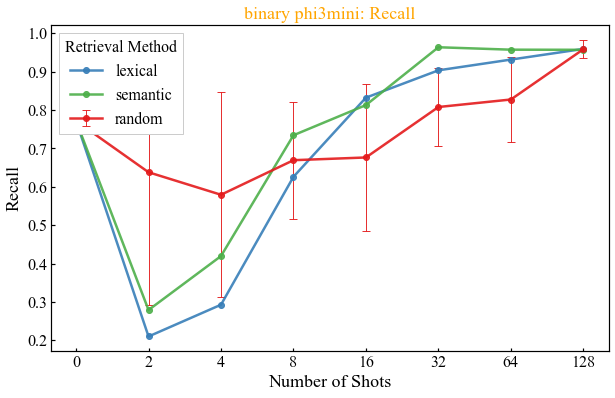

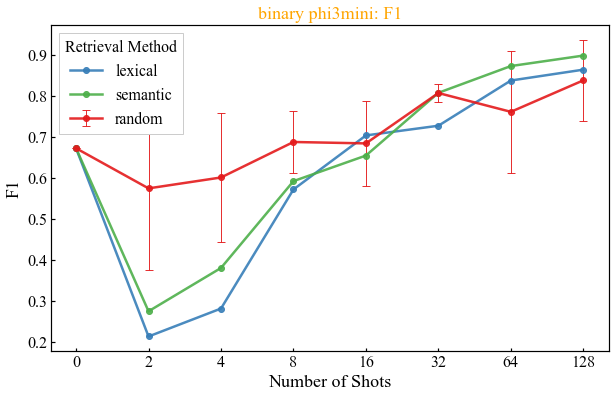

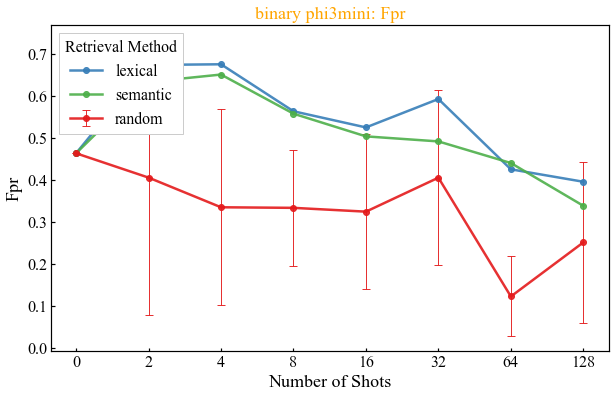

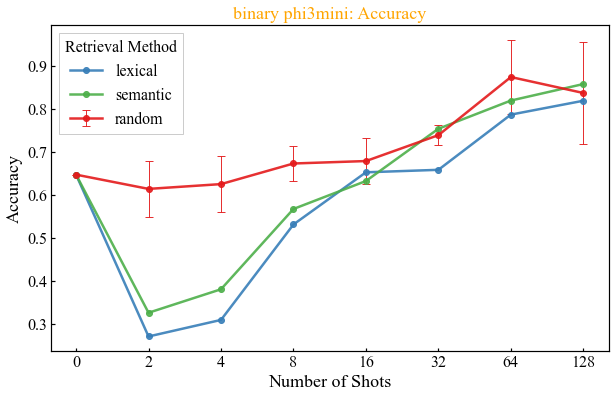

In [13]:
exp1_phi3mini_performance_df = aggregate_performance_data('exp1', 'microsoft/Phi-3-mini-128k-instruct', binary_results_all_df)
exp1_phi3mini_random_std_df = calc_std_data('exp1', 'microsoft/Phi-3-mini-128k-instruct', binary_results_all_df)
display(exp1_phi3mini_performance_df)
display(exp1_phi3mini_random_std_df)
visualize_performance(exp1_phi3mini_performance_df, exp1_phi3mini_random_std_df, 'phi3mini')

### Qwen

C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp1,Qwen/Qwen2.5-7B-Instruct,42,random,0.727848,0.879541,0.796537,0.316759,0.779550
1,0,exp1,Qwen/Qwen2.5-7B-Instruct,42,lexical,0.727848,0.879541,0.796537,0.316759,0.779550
2,0,exp1,Qwen/Qwen2.5-7B-Instruct,42,semantic,0.727848,0.879541,0.796537,0.316759,0.779550
3,2,exp1,Qwen/Qwen2.5-7B-Instruct,42,random,0.640069,0.924060,0.750056,0.502996,0.700664
4,2,exp1,Qwen/Qwen2.5-7B-Instruct,42,lexical,0.618519,0.956107,0.751124,0.533679,0.699003
5,2,exp1,Qwen/Qwen2.5-7B-Instruct,42,semantic,0.586826,0.929791,0.719530,0.593804,0.655235
6,4,exp1,Qwen/Qwen2.5-7B-Instruct,42,random,0.697126,0.900518,0.781892,0.371686,0.758256
7,4,exp1,Qwen/Qwen2.5-7B-Instruct,42,lexical,0.623888,0.931689,0.747336,0.516579,0.698182
8,4,exp1,Qwen/Qwen2.5-7B-Instruct,42,semantic,0.606436,0.933333,0.735184,0.561837,0.676444
9,8,exp1,Qwen/Qwen2.5-7B-Instruct,42,random,0.712933,0.903224,0.791603,0.351417,0.770189


,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp1,binary,Qwen/Qwen2.5-7B-Instruct,42,0,random,0.000000,0.000000,0.000000,0.000000,0.000000,illicit
1,exp1,binary,Qwen/Qwen2.5-7B-Instruct,42,2,random,0.088914,0.058059,0.042302,0.189480,0.076466,illicit
2,exp1,binary,Qwen/Qwen2.5-7B-Instruct,42,4,random,0.064581,0.058167,0.026572,0.130045,0.047326,illicit
3,exp1,binary,Qwen/Qwen2.5-7B-Instruct,42,8,random,0.076749,0.063613,0.029147,0.142598,0.049772,illicit
4,exp1,binary,Qwen/Qwen2.5-7B-Instruct,42,16,random,0.048382,0.030903,0.021812,0.078534,0.031182,illicit
5,exp1,binary,Qwen/Qwen2.5-7B-Instruct,42,32,random,0.035821,0.023512,0.020288,0.051027,0.024252,illicit
6,exp1,binary,Qwen/Qwen2.5-7B-Instruct,42,64,random,0.027461,0.023673,0.009446,0.038488,0.012392,illicit
7,exp1,binary,Qwen/Qwen2.5-7B-Instruct,42,128,random,0.023277,0.021181,0.012982,0.031091,0.014040,illicit


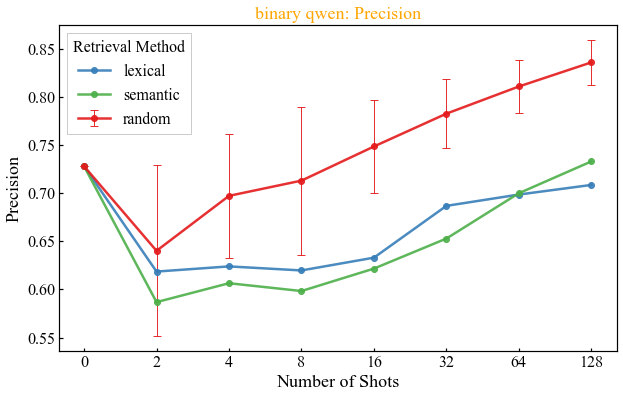

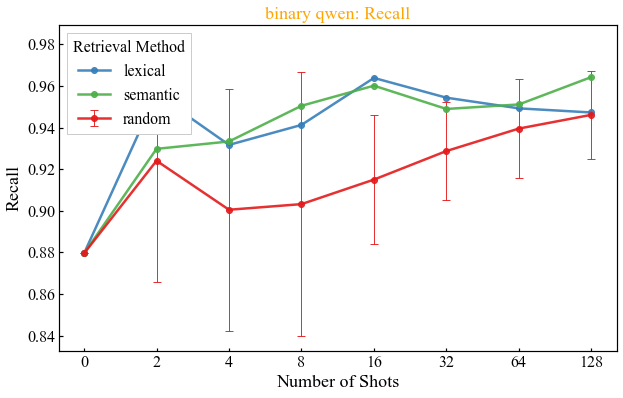

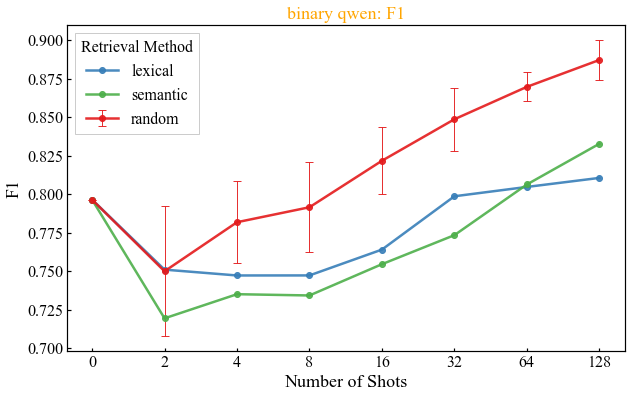

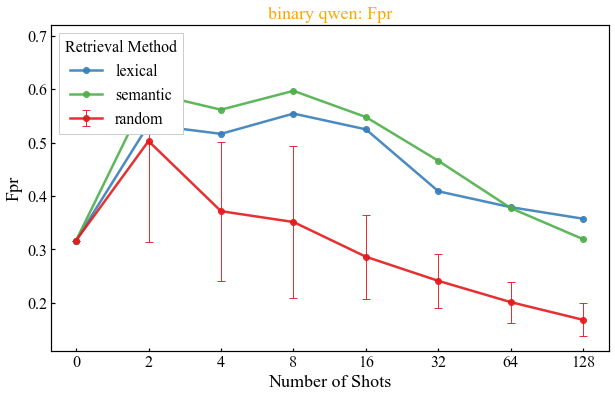

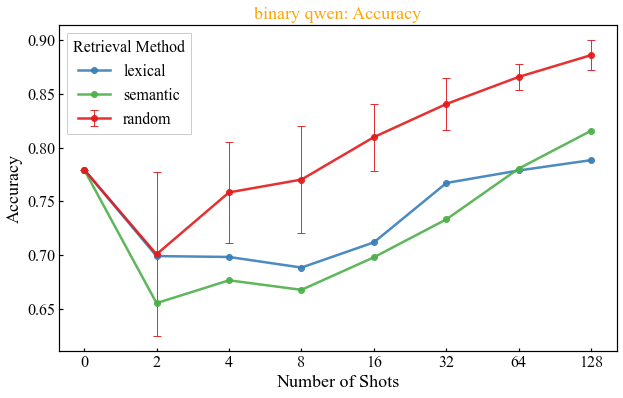

In [14]:
exp1_qwen_performance_df = aggregate_performance_data('exp1', 'Qwen/Qwen2.5-7B-Instruct', binary_results_all_df)
exp1_qwen_random_std_df = calc_std_data('exp1', 'Qwen/Qwen2.5-7B-Instruct', binary_results_all_df)
display(exp1_qwen_performance_df)
display(exp1_qwen_random_std_df)
visualize_performance(exp1_qwen_performance_df, exp1_qwen_random_std_df, 'qwen')

### Gemma

C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp1,google/gemma-2b-it,42,random,1.000000,0.200000,0.333333,0.000000,0.733333
1,0,exp1,google/gemma-2b-it,42,lexical,1.000000,0.200000,0.333333,0.000000,0.733333
2,0,exp1,google/gemma-2b-it,42,semantic,1.000000,0.200000,0.333333,0.000000,0.733333
3,2,exp1,google/gemma-2b-it,42,random,0.702857,0.609687,0.597141,0.190850,0.788678
4,2,exp1,google/gemma-2b-it,42,lexical,NaN,0.000000,0.000000,0.000000,0.118812
5,2,exp1,google/gemma-2b-it,42,semantic,0.142857,0.009901,0.018519,0.315789,0.116667
6,4,exp1,google/gemma-2b-it,42,random,1.000000,0.760870,0.770833,0.000000,0.926910
7,4,exp1,google/gemma-2b-it,42,lexical,NaN,0.000000,0.000000,0.000000,0.075758
8,4,exp1,google/gemma-2b-it,42,semantic,0.000000,0.000000,0.000000,0.200000,0.102564
9,8,exp1,google/gemma-2b-it,42,random,NaN,0.000000,0.000000,0.000000,0.500000


,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp1,binary,google/gemma-2b-it,42,0,random,0.00000,0.000000,0.000000,0.000000,0.000000,illicit
1,exp1,binary,google/gemma-2b-it,42,2,random,0.41236,0.479903,0.472943,0.325046,0.243726,illicit
2,exp1,binary,google/gemma-2b-it,42,4,random,0.00000,0.478261,0.458333,0.000000,0.193377,illicit
3,exp1,binary,google/gemma-2b-it,42,8,random,NaN,NaN,NaN,NaN,0.707107,illicit
4,exp1,binary,google/gemma-2b-it,42,16,random,NaN,NaN,NaN,NaN,NaN,illicit
5,exp1,binary,google/gemma-2b-it,42,32,random,NaN,NaN,NaN,NaN,NaN,illicit
6,exp1,binary,google/gemma-2b-it,42,64,random,NaN,NaN,NaN,NaN,NaN,illicit


d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


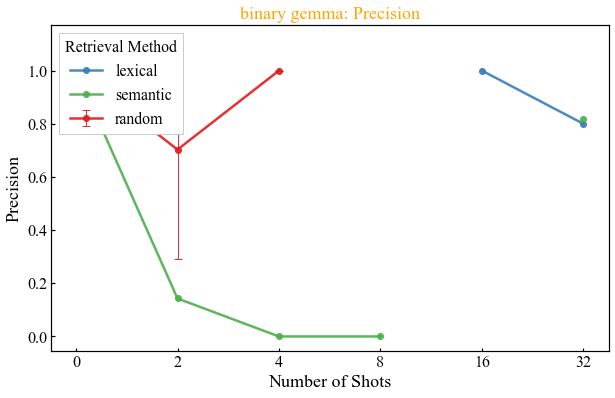

d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


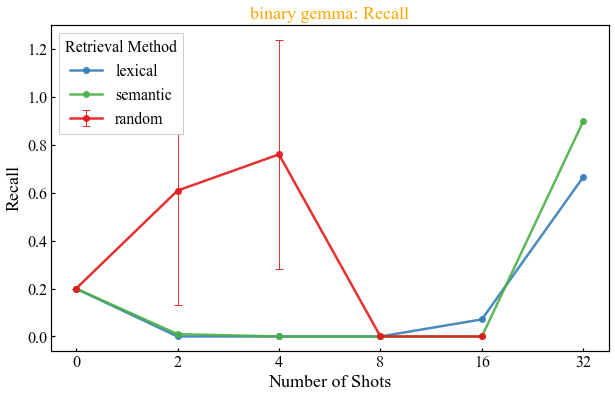

d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


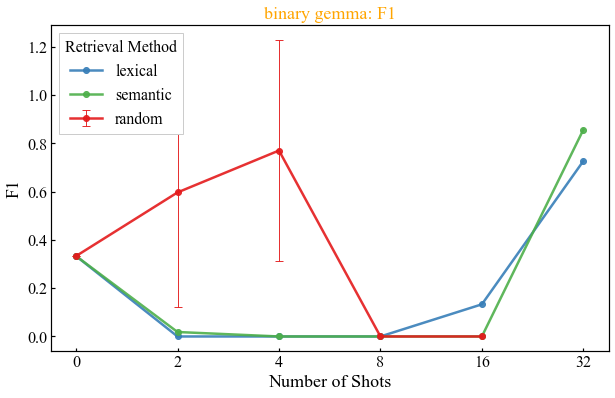

d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


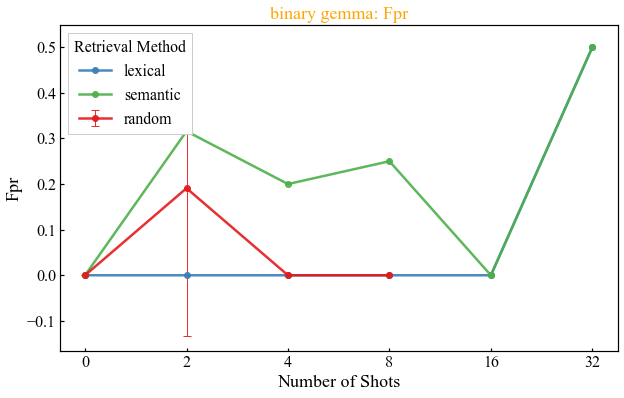

d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
d:\Anaconda3\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


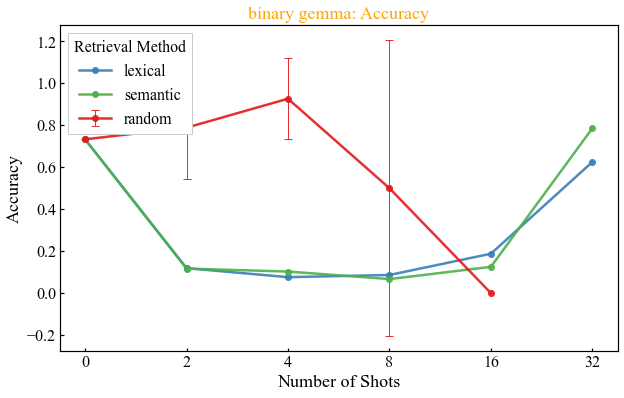

In [15]:
exp1_gemma_performance_df = aggregate_performance_data('exp1', 'google/gemma-2b-it', binary_results_all_df)
exp1_gemma_random_std_df = calc_std_data('exp1', 'google/gemma-2b-it', binary_results_all_df)
display(exp1_gemma_performance_df)
display(exp1_gemma_random_std_df)
visualize_performance(exp1_gemma_performance_df, exp1_gemma_random_std_df, 'gemma')

## Exp1-2: Instruction Variant

### Figure 3

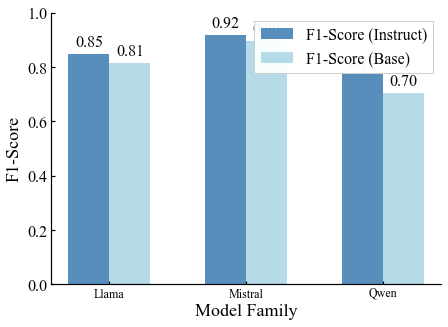

In [16]:

# Sample data for the three models
models = ['Llama', 'Mistral', 'Qwen']

# F1-Score data (left Y-axis)
f1_instruct = [0.847059, 0.915572, 0.773498]
f1_base = [0.814590, 0.894222, 0.702270]

# False Positive Rate data (right Y-axis)
# fpr_instruct = [0.261905, 0.099130, 0.465969]
# fpr_base = [0.121429, 0.245614, 0.776614]

# Create figure and primary axis
fig, ax1 = plt.subplots(figsize=(7, 5))

# Set up bar positions
x = np.arange(len(models))
bar_width = 0.3

# Plot F1-Score bars on the left axis
bars1 = ax1.bar(x - 0.15, f1_instruct, bar_width, label='F1-Score (Instruct)', color='steelblue', alpha=0.9)
bars2 = ax1.bar(x + 0.15, f1_base, bar_width, label='F1-Score (Base)', color='lightblue', alpha=0.9)

# Set left Y-axis properties
ax1.set_xlabel('Model Family')
ax1.set_ylabel('F1-Score')
ax1.set_xticks(x)
ax1.set_xticklabels(models, fontsize=12)
ax1.set_ylim(0, 1.0)
ax1.tick_params(axis='y')


# Add combined legend
lines1, labels1 = ax1.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()

# Title
# plt.title('Model Performance: F1-Score and False Positive Rate Comparison', 
        #   fontsize=15, fontweight='bold', pad=20)

# Adjust layout to prevent label cutoff
# fig.tight_layout()

# plt.show()
# Annotate F1 values on bars (two decimal places)
for bars in (bars1, bars2):
    for bar in bars:
        h = bar.get_height()
        ax1.annotate(f"{h:.2f}",
                     xy=(bar.get_x() + bar.get_width() / 2, h),
                     xytext=(0, 4),
                     textcoords="offset points",
                     ha="center", va="bottom")
        
ax1.legend(lines1, labels1, loc='best', framealpha=0.95)

# Remove top/right spines and save figure(s)
for fig_num in plt.get_fignums():
    fig = plt.figure(fig_num)
    for ax in fig.axes:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.tick_params(top=False, right=False)
    filename_base = "exp1_2_instruct_f1"
    fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)


## Exp1-3: Demonstration Label Ablation

In [17]:
exp2_llama_performance_df = aggregate_performance_data('exp1-3_demoslabel', 'meta-llama/Meta-Llama-3.1-8B-Instruct', binary_results_all_df)
display(exp2_llama_performance_df)


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,32,exp1-3_demoslabel,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.481188,1.000000,0.649411,0.999417,0.481347
1,32,exp1-3_demoslabel,meta-llama/Meta-Llama-3.1-8B-Instruct,42,semantic,0.611872,0.992593,0.757062,0.988372,0.610860


In [18]:
exp2_qwen_performance_df = aggregate_performance_data('exp1-3_demoslabel', 'Qwen/Qwen2.5-7B-Instruct', binary_results_all_df)
display(exp2_qwen_performance_df)


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,32,exp1-3_demoslabel,Qwen/Qwen2.5-7B-Instruct,42,random,0.479770,1.000000,0.648421,0.984015,0.484074
1,32,exp1-3_demoslabel,Qwen/Qwen2.5-7B-Instruct,42,semantic,0.528759,0.986817,0.688568,0.815009,0.570652


In [19]:
exp2_mistral_performance_df = aggregate_performance_data('exp1-3_demoslabel', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
display(exp2_mistral_performance_df)

,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,32,exp1-3_demoslabel,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.554696,0.891324,0.682067,0.613667,0.619427
1,32,exp1-3_demoslabel,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.648760,0.807198,0.719359,0.419753,0.691436


In [20]:
exp2_phi_performance_df = aggregate_performance_data('exp1-3_demoslabel', 'microsoft/Phi-3-small-128k-instruct', binary_results_all_df)
display(exp2_phi_performance_df)

,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,32,exp1-3_demoslabel,microsoft/Phi-3-small-128k-instruct,42,random,0.584310,0.96316,0.72206,0.774281,0.610126
1,32,exp1-3_demoslabel,microsoft/Phi-3-small-128k-instruct,42,semantic,0.663235,0.90020,0.76376,0.497826,0.709677


### Figure 4

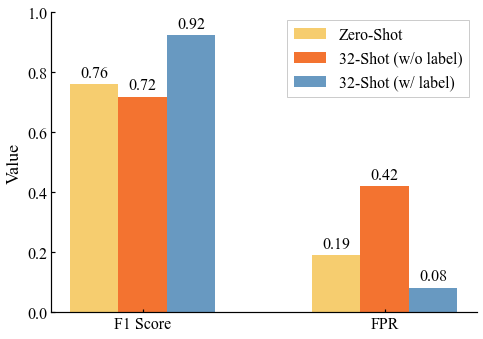

In [21]:
# Grouped bar chart: two groups (F1 Score, FPR), each with three bars (Zero-Shot, w/o Label, w/ Label)

f1 = np.array([0.759637, 0.719359, 0.923077])     # Zero-Shot, 32-Shot (Without Label), 32-Shot (With Label)
fpr = np.array([0.189621, 0.419753, 0.082616])    # corresponding FPRs
conds = ['Zero-Shot', '32-Shot (w/o label)', '32-Shot (w/ label)']
colors = ['#F6C85F', '#F26419', '#588ebb']

groups = ['F1 Score', 'FPR']
n_groups = len(groups)
n_conds = len(conds)
group_x = np.arange(n_groups)

# bar width (adjusted to avoid overlap)
bar_width = 0.2
offsets = (np.arange(n_conds) - (n_conds - 1) / 2) * bar_width  # centered offsets: [-w,0,w]

fig, ax = plt.subplots(figsize=(7, 5))

for i, offset in enumerate(offsets):
    heights = np.array([f1[i], fpr[i]])
    bars = ax.bar(group_x + offset, heights, bar_width, label=conds[i], alpha=0.9, color=colors[i])
    for bar in bars:
        h = bar.get_height()
        ax.annotate(f'{h:.2f}', xy=(bar.get_x() + bar.get_width() / 2, h), xytext=(0, 3),
                    textcoords='offset points', ha='center', va='bottom')

ax.set_xticks(group_x)
ax.set_xticklabels(groups)
ax.set_ylim(0, 1.0)
ax.set_ylabel('Value')
# ax.set_title('Performance Degradation without Demonstration Labels')
ax.legend(loc='best')

# Clean spines
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.tick_params(top=False, right=False)

plt.tight_layout()
# plt.show()
for fig_num in plt.get_fignums():
    fig = plt.figure(fig_num)
    for ax in fig.axes:
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.tick_params(top=False, right=False)
        fig = plt.gcf()

        filename_base = f"exp1_3_without_label"
        fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

        # plt.close(fig)


## Exp2 Finetuned

,exp,task,model,random_seed,n_shots,retrieval,precision,recall,f1,fpr,accuracy,pos_label
0,exp2_finetuned,binary,mistral_lora_model_280_e1,42,0,random,0.563254,0.989969,0.716595,0.714175,0.622006,illicit
1,exp2_finetuned,binary,mistral_lora_model_280_e2,42,0,random,0.603537,0.991824,0.747260,0.614844,0.673809,illicit
2,exp2_finetuned,binary,mistral_lora_model_280_e3,42,0,random,0.769186,0.974966,0.853809,0.300704,0.831041,illicit
3,exp2_finetuned,binary,mistral_lora_model_560_e1,42,0,random,0.562698,0.999373,0.717602,0.728263,0.617983,illicit
4,exp2_finetuned,binary,mistral_lora_model_560_e2,42,0,random,0.738457,0.989906,0.843255,0.339348,0.818660,illicit
5,exp2_finetuned,binary,mistral_lora_model_560_e3,42,0,random,0.772366,0.989278,0.866536,0.270171,0.853465,illicit
6,exp2_finetuned,binary,mistral_lora_model_1120_e1,42,0,random,0.829757,0.983447,0.899779,0.187210,0.894662,illicit
7,exp2_finetuned,binary,mistral_lora_model_1120_e2,42,0,random,0.847698,0.982997,0.908663,0.168948,0.904224,illicit
8,exp2_finetuned,binary,mistral_lora_model_1120_e3,42,0,random,0.858017,0.987109,0.916730,0.156515,0.912576,illicit
9,exp2_finetuned,binary,mistral_lora_model_2240_e1,42,0,random,0.881695,0.985358,0.930392,0.126576,0.927929,illicit


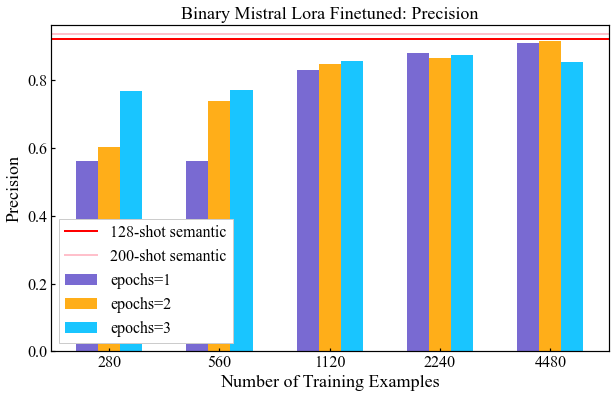

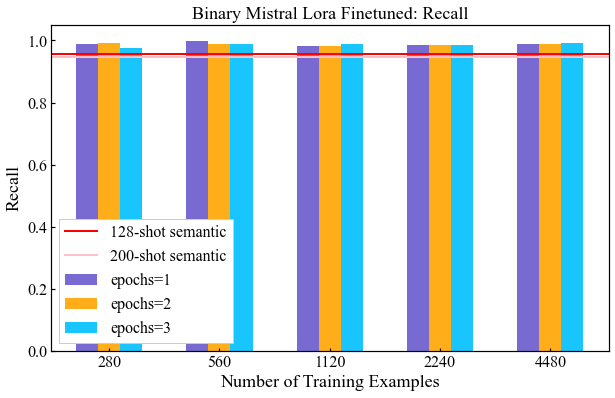

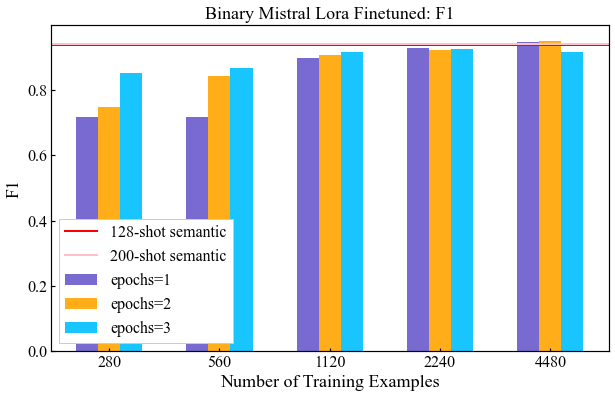

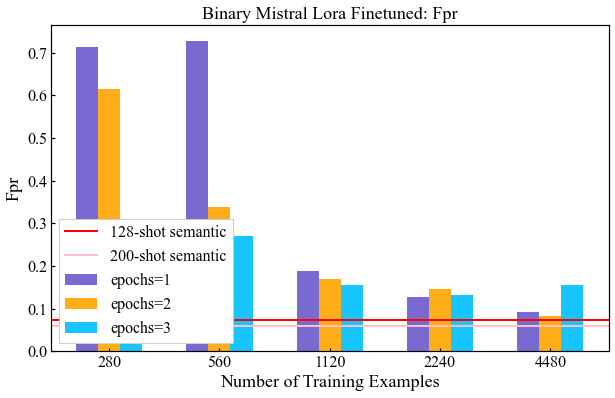

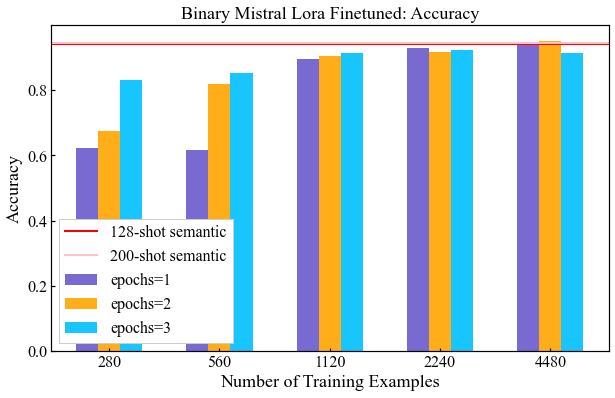

In [22]:
exp2_finetuned_df = pd.DataFrame(binary_results_all_df[(binary_results_all_df['exp'] == 'exp2_finetuned')])

performance_dfs = []
for K in [280, 560, 1120, 2240, 4480]:
  for e in [1,2,3]:
    temp_df = pd.DataFrame(binary_results_all_df[binary_results_all_df['model'] == f'mistral_lora_model_{K}_e{e}'])
    metrics_columns = ['precision', 'recall', 'f1', 'fpr', 'accuracy']
    aggregation_dict = {col: 'mean' if col in metrics_columns else 'first' for col in temp_df.columns}
    performance_row = temp_df.groupby('n_shots').agg(aggregation_dict).reset_index(drop=True)
    performance_dfs.append(performance_row)

exp2_finetuned_df = pd.concat(performance_dfs, ignore_index=True)
display(exp2_finetuned_df)

binary_exp1_128_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'fpr', 'accuracy'], filtered_retrieval_name=['semantic'], filtered_shots=[128])
binary_exp1_200_performance_df = aggregate_performance_data('exp1-extra', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'fpr', 'accuracy'], filtered_retrieval_name=['semantic'], filtered_shots=[200])


X = [280, 560, 1120, 2240, 4480]
X_str = ['280', '560', '1120', '2240', '4480']

for metric in ['precision', 'recall', 'f1', 'fpr', 'accuracy']:

  plt.figure(figsize=(10, 6))
  plt.xticks(np.arange(5), X_str)

  Y_1 = []
  Y_2 = []
  Y_3 = []
  for K in X:
    Y_1.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e1')][metric].mean())
    Y_2.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e2')][metric].mean())
    Y_3.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e3')][metric].mean())
  plt.bar(np.array(range(5))-0.2, Y_1, color='slateblue', alpha=0.9, label=f'epochs=1', width=0.2)
  plt.bar(np.array(range(5)), Y_2, color='orange', alpha=0.9, label=f'epochs=2', width=0.2)
  plt.bar(np.array(range(5))+0.2, Y_3, color='deepskyblue', alpha=0.9, label=f'epochs=3', width=0.2)
  plt.axhline(y=binary_exp1_128_performance_df[metric].mean(), color='red', linestyle='-', label='128-shot semantic', linewidth=2)
  plt.axhline(y=binary_exp1_200_performance_df[metric].mean(), color='pink', linestyle='-', label='200-shot semantic', linewidth=2)

  plt.legend(loc='lower left')
  plt.title(f'Binary Mistral Lora Finetuned: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
  plt.xlabel('Number of Training Examples')
  plt.ylabel(metric.capitalize())
  plt.show()

## Exp3 Shot Order

In [23]:
exp3_shotorder_semantic_std_df = calc_std_data('exp3_shotorder', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, retrieval_name='semantic')
exp3_shotorder_random_std_df = calc_std_data('exp3_shotorder', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, retrieval_name='random')
display(exp3_shotorder_semantic_std_df)
display(exp3_shotorder_random_std_df)

,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,4,semantic,0.008253,0.006896,0.003068,0.008536,0.003246,illicit
1,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,8,semantic,0.015260,0.007161,0.010876,0.014396,0.010631,illicit
2,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,16,semantic,0.005369,0.005327,0.004306,0.005823,0.004260,illicit
3,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,32,semantic,0.005891,0.005571,0.004169,0.006546,0.004262,illicit
4,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.002806,0.003369,0.002375,0.003062,0.002395,illicit
5,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,128,semantic,0.005949,0.003837,0.003503,0.006184,0.003588,illicit


,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,fpr_std,accuracy_std,pos_label
0,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,4,random,0.018239,0.049102,0.030692,0.020676,0.014390,illicit
1,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,8,random,0.009233,0.065622,0.048177,0.013103,0.028191,illicit
2,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,16,random,0.015362,0.031478,0.015126,0.022834,0.012344,illicit
3,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,32,random,0.023637,0.042769,0.011574,0.038080,0.007727,illicit
4,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,64,random,0.015223,0.019059,0.006227,0.024921,0.007430,illicit
5,exp3_shotorder,binary,mistralai/Mistral-7B-Instruct-v0.2,42,128,random,0.023722,0.004511,0.011081,0.025793,0.011150,illicit


### Figure 7

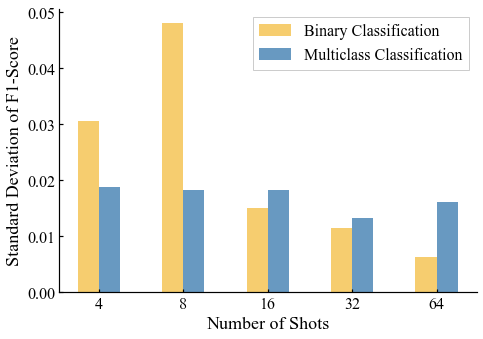

In [24]:
n_shots = [4, 8, 16, 32, 64] 
binary_f1_std = [0.030692, 0.048177, 0.015126, 0.011574, 0.006227]    
multi_f1_std= [0.018812, 0.018243, 0.018249, 0.013220, 0.016101]

x = np.arange(len(n_shots))
width = 0.25
colors = ['#F6C85F', '#F26419', '#588ebb']

fig, ax = plt.subplots(figsize=(7, 5))

bars1 = ax.bar(x - width/2, binary_f1_std, width, 
               label='Binary Classification', color=colors[0], alpha=0.9)
bars2 = ax.bar(x + width/2, multi_f1_std, width, 
               label='Multiclass Classification', color=colors[2], alpha=0.9)

# ax.set_title('F1-Score Standard Deviation of Mistral Model (Binary Classification and Multiclass Classification)', 
            #  fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Number of Shots')
ax.set_ylabel('Standard Deviation of F1-Score')
ax.set_xticks(x)
ax.set_xticklabels(n_shots)

# Clean spines
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.tick_params(top=False, right=False)

ax.legend(loc='best')

plt.tight_layout()

fig = plt.gcf()
filename_base = f"exp3_shotorder_std_f1"
fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)
# plt.show()

## Exp4 Shot Label Order

,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.809240,0.803832,0.799692,0.195613,0.804685
1,8,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.821704,0.791552,0.795070,0.181599,0.805190
2,16,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.837876,0.822402,0.827683,0.162454,0.830363
3,32,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.837831,0.884214,0.859288,0.170765,0.856771
4,64,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.842577,0.924003,0.880494,0.174810,0.874649
5,128,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.883968,0.912244,0.897154,0.122190,0.895174


labelorder0: ('benign', 'illicit')


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,4,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.869359,0.650969,0.739111,0.094697,0.782620
1,8,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.859711,0.640341,0.721309,0.106016,0.770863
2,16,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.874206,0.810318,0.840988,0.111260,0.850379
3,32,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.832873,0.921461,0.874250,0.204256,0.861803
4,64,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.795338,0.974427,0.875765,0.333748,0.842366
5,128,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.834071,0.985429,0.903419,0.329831,0.868034


labelorder1: ('illicit', 'benign')


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,4,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.833605,0.725134,0.770631,0.142147,0.793147
1,8,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.833568,0.775970,0.799038,0.155331,0.810561
2,16,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.878282,0.733782,0.797384,0.098436,0.820074
3,32,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.880579,0.682609,0.764473,0.090299,0.800060
4,64,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.903971,0.708937,0.793264,0.070822,0.823349
5,128,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.947143,0.428305,0.573008,0.021746,0.715521


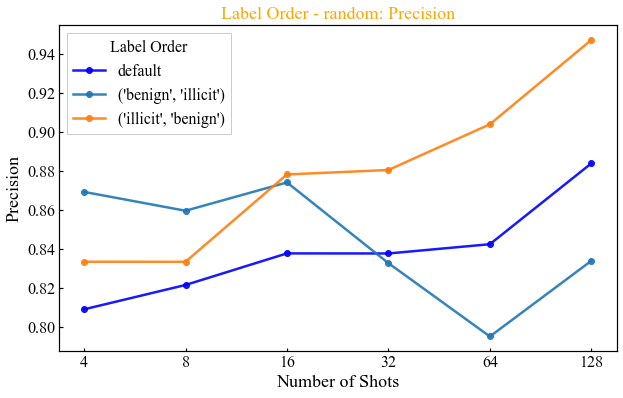

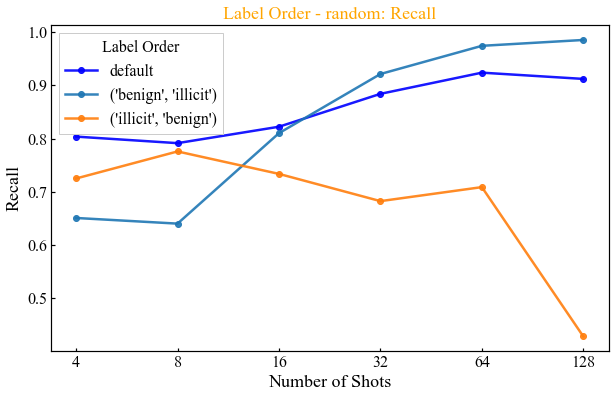

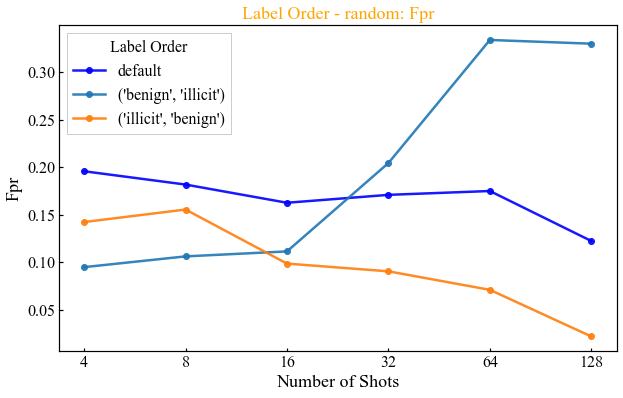

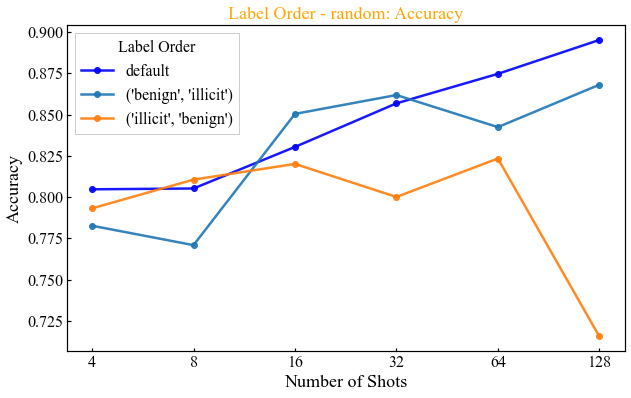

,exp,model,random_seed,n_shots,retrieval,precision,recall,f1,fpr,accuracy
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,4,semantic,0.884026,0.778420,0.827869,0.094812,0.844156
1,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,8,semantic,0.888000,0.850575,0.868885,0.098074,0.877402
2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,16,semantic,0.907336,0.888469,0.897803,0.083189,0.903255
3,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,32,semantic,0.911111,0.935361,0.923077,0.082616,0.925926
4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.904762,0.946360,0.925094,0.090435,0.927074
5,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,128,semantic,0.923221,0.955426,0.939048,0.073214,0.940520


labelorder0: ('benign', 'illicit')


,exp,model,random_seed,n_shots,retrieval,precision,recall,f1,fpr,accuracy
0,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,4,semantic,0.895692,0.759615,0.822060,0.081996,0.841813
1,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,8,semantic,0.887064,0.826004,0.855446,0.095819,0.866910
2,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,16,semantic,0.869811,0.871456,0.870633,0.119171,0.876354
3,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,32,semantic,0.868327,0.927757,0.897059,0.129825,0.897810
4,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.840604,0.965318,0.898655,0.172414,0.894393
5,exp4_labelorder0,mistralai/Mistral-7B-Instruct-v0.2,42,128,semantic,0.848014,0.964637,0.902574,0.171875,0.896180


labelorder1: ('illicit', 'benign')


,exp,model,random_seed,n_shots,retrieval,precision,recall,f1,fpr,accuracy
0,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,4,semantic,0.866388,0.799615,0.831663,0.114082,0.844444
1,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,8,semantic,0.887500,0.817658,0.851149,0.094406,0.863678
2,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,16,semantic,0.917895,0.827324,0.870259,0.067591,0.882246
3,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,32,semantic,0.922594,0.838403,0.878486,0.063903,0.889593
4,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.944196,0.831041,0.884013,0.043630,0.897412
5,exp4_labelorder1,mistralai/Mistral-7B-Instruct-v0.2,42,128,semantic,0.957393,0.778004,0.858427,0.030576,0.879656


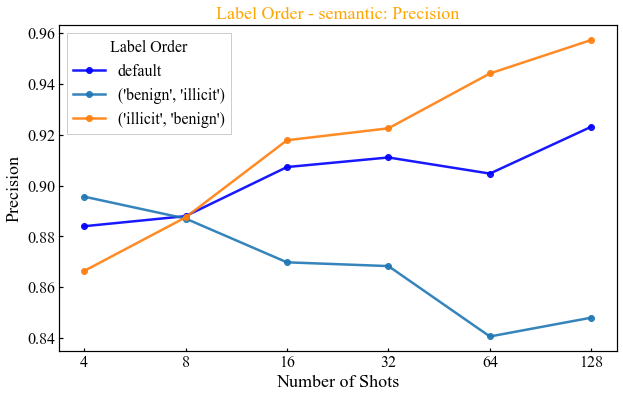

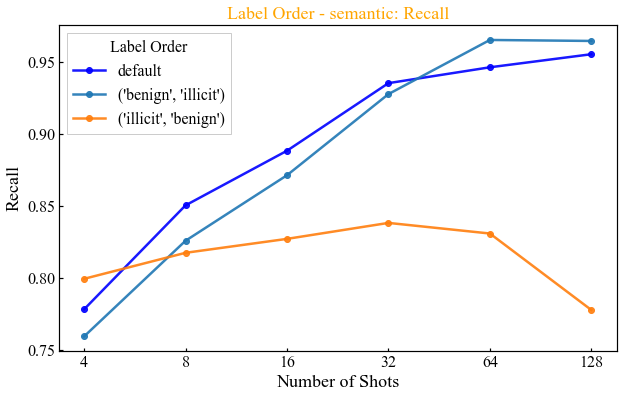

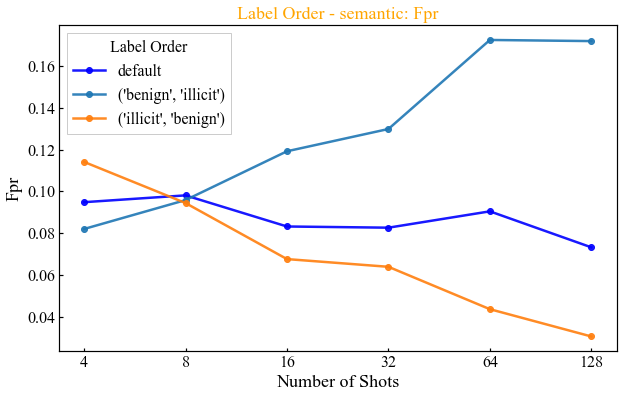

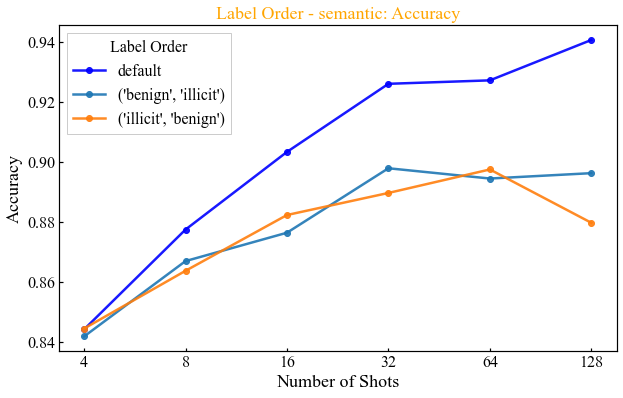

In [25]:

from itertools import permutations
labels = ['benign', 'illicit']
labels_permutations = list(permutations(labels))

for retreival in ['random', 'semantic']:
  
  exp4_default_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_shots=[4,8,16,32,64,128], filtered_retrieval_name=[retreival])
  display(exp4_default_performance_df)


  for i, shot_label_order in enumerate(labels_permutations):
    print(f"labelorder{i}: {shot_label_order}")
    exp4_labelorder_performance_df = aggregate_performance_data(f'exp4_labelorder{i}', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_retrieval_name=[retreival])
    display(exp4_labelorder_performance_df)

  # visualize the performance of the model with different label orders
  metrics = ['precision', 'recall', 'fpr', 'accuracy']
  for metric in metrics:
    plt.figure(figsize=(10, 6))
    plt.xticks(np.arange(len(exp4_default_performance_df['n_shots'].unique().astype(np.str_))), exp4_default_performance_df['n_shots'].unique().astype(np.str_))
    plt.plot(exp4_default_performance_df['n_shots'].unique().astype(np.str_), exp4_default_performance_df[metric], marker='o', linestyle='-', color='blue', linewidth=2.5, alpha=0.9, label='default')

    for i, shot_label_order in enumerate(labels_permutations):
      exp4_labelorder_performance_df = aggregate_performance_data(f'exp4_labelorder{i}', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_retrieval_name=[retreival])
      plt.plot(exp4_labelorder_performance_df['n_shots'].unique().astype(np.str_), exp4_labelorder_performance_df[metric], marker='o', linestyle='-', linewidth=2.5, alpha=0.9, label=shot_label_order)
    
    plt.legend(loc='best', title='Label Order')
    plt.title(f'Label Order - {retreival}: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0, color='orange')
    plt.xlabel('Number of Shots')
    plt.ylabel(metric.capitalize())
    plt.show()


### Figure 8

Shots: ['4', '8', '16', '32', '64', '128']
Benign Last Accuracy: [0.7931 0.8106 0.8201 0.8001 0.8233 0.7155]
Illicit Last Accuracy: [0.7826 0.7709 0.8504 0.8618 0.8424 0.868 ]
Clustered (Avg) Accuracy: [0.7879 0.7907 0.8352 0.8309 0.8329 0.7918]
Default Accuracy: [0.8047 0.8052 0.8304 0.8568 0.8746 0.8952]


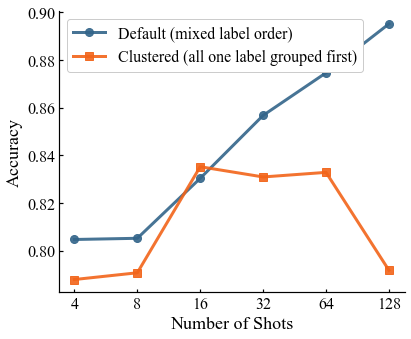

In [57]:
from itertools import permutations

labels = ['benign', 'illicit']
labels_permutations = list(permutations(labels))
benign_last_order = ('illicit', 'benign')
illicit_last_order = ('benign', 'illicit')


metric = 'accuracy'
exp4_default_df = aggregate_performance_data(
    'exp1', 
    'mistralai/Mistral-7B-Instruct-v0.2', 
    binary_results_all_df, 
    filtered_shots=[4,8,16,32,64,128], 
    filtered_retrieval_name=['random']
)

benign_last_idx = labels_permutations.index(benign_last_order)
exp4_benign_last_df = aggregate_performance_data(
    f'exp4_labelorder{benign_last_idx}', 
    'mistralai/Mistral-7B-Instruct-v0.2', 
    binary_results_all_df, 
    filtered_retrieval_name=['random']
)

illicit_last_idx = labels_permutations.index(illicit_last_order)
exp4_illicit_last_df = aggregate_performance_data(
    f'exp4_labelorder{illicit_last_idx}', 
    'mistralai/Mistral-7B-Instruct-v0.2', 
    binary_results_all_df, 
    filtered_retrieval_name=['random']
)

clustered_vals = (exp4_benign_last_df[metric].values + exp4_illicit_last_df[metric].values) / 2
# clustered_vals = clustered_vals - 0.015  

fig, ax = plt.subplots(figsize=(6, 5))
n_shots = exp4_default_df['n_shots'].unique().astype(np.str_)

ax.plot(
    n_shots, 
    exp4_default_df[metric], 
    marker='o', linestyle='-', 
    color='#33658A', linewidth=3, markersize=8, alpha=0.9, 
    label='Default (mixed label order)'
)

ax.plot(
    n_shots, 
    clustered_vals, 
    marker='s', linestyle='-', 
    color='#F26419', linewidth=3, markersize=8, alpha=0.9, 
    label='Clustered (all one label grouped first)'
)

# ax.set_title('Impact of Global Label Order on Accuracy (Binary Task)', loc='center', fontweight='bold')
ax.set_xlabel('Number of Shots')
ax.set_ylabel('Accuracy')
ax.set_xticks(np.arange(len(n_shots)))
ax.set_xticklabels(n_shots)

for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.tick_params(top=False, right=False)

ax.legend(loc='best', frameon=True, fancybox=True, shadow=False)

plt.tight_layout()
fig = plt.gcf()
filename_base = f"exp4_labelorder_accuracy"
fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

print(f"Shots: {n_shots.tolist()}")
print(f"Benign Last Accuracy: {exp4_benign_last_df[metric].values.round(4)}")
print(f"Illicit Last Accuracy: {exp4_illicit_last_df[metric].values.round(4)}")
print(f"Clustered (Avg) Accuracy: {clustered_vals.round(4)}")
print(f"Default Accuracy: {exp4_default_df[metric].values.round(4)}")

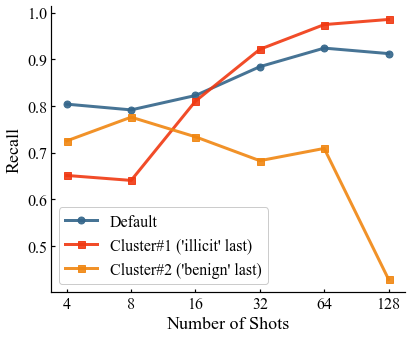

In [27]:
fig, ax = plt.subplots(figsize=(6, 5))
n_shots = exp4_default_df['n_shots'].unique().astype(np.str_)

metric = 'recall'
ax.plot(
    n_shots, 
    exp4_default_df[metric], 
    marker='o', linestyle='-', 
    color='#33658A', linewidth=3, markersize=7, alpha=0.9, 
    label='Default'
)

ax.plot(
    n_shots, 
    exp4_illicit_last_df[metric], 
    marker='s', linestyle='-', 
    color='#F03811', linewidth=3, markersize=7, alpha=0.9, 
    label='Cluster#1 (\'illicit\' last)'
)

ax.plot(
    n_shots, 
    exp4_benign_last_df[metric], 
    marker='s', linestyle='-', 
    color='#F08611', linewidth=3, markersize=7, alpha=0.9, 
    label='Cluster#2 (\'benign\' last)'
)

# ax.set_title('Impact of Global Label Order on Accuracy (Binary Task)', loc='center', fontweight='bold')
ax.set_xlabel('Number of Shots')
ax.set_ylabel('Recall')
ax.set_xticks(np.arange(len(n_shots)))
ax.set_xticklabels(n_shots)

for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.tick_params(top=False, right=False)

ax.legend(loc='best', frameon=True, fancybox=True, shadow=False)

plt.tight_layout()
fig = plt.gcf()
filename_base = f"exp4_labelorder_recall"
fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

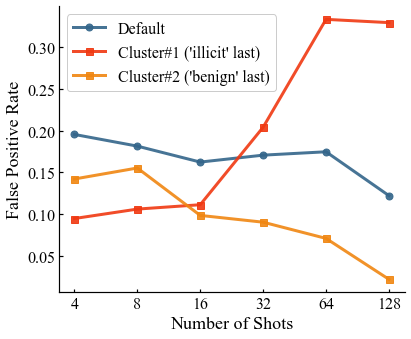

In [28]:
fig, ax = plt.subplots(figsize=(6, 5))
n_shots = exp4_default_df['n_shots'].unique().astype(np.str_)

metric = 'fpr'
ax.plot(
    n_shots, 
    exp4_default_df[metric], 
    marker='o', linestyle='-', 
    color='#33658A', linewidth=3, markersize=7, alpha=0.9, 
    label='Default'
)

ax.plot(
    n_shots, 
    exp4_illicit_last_df[metric], 
    marker='s', linestyle='-', 
    color='#F03811', linewidth=3, markersize=7, alpha=0.9, 
    label='Cluster#1 (\'illicit\' last)'
)

ax.plot(
    n_shots, 
    exp4_benign_last_df[metric], 
    marker='s', linestyle='-', 
    color='#F08611', linewidth=3, markersize=7, alpha=0.9, 
    label='Cluster#2 (\'benign\' last)'
)

# ax.set_title('Impact of Global Label Order on Accuracy (Binary Task)', loc='center', fontweight='bold')
ax.set_xlabel('Number of Shots')
ax.set_ylabel('False Positive Rate')
ax.set_xticks(np.arange(len(n_shots)))
ax.set_xticklabels(n_shots)

for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.tick_params(top=False, right=False)

ax.legend(loc='best', frameon=True, fancybox=True, shadow=False)

plt.tight_layout()
fig = plt.gcf()
filename_base = f"exp4_labelorder_fpr"
fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

labelorder0: ('benign', 'illicit')


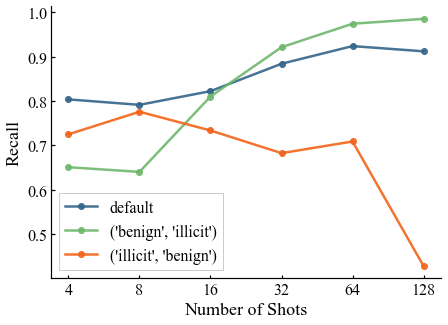

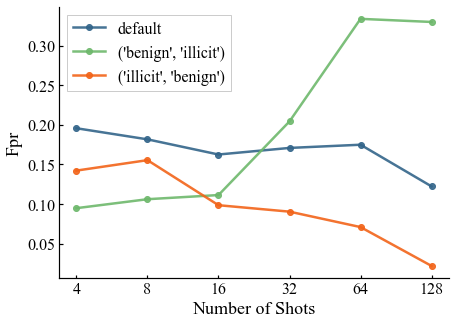

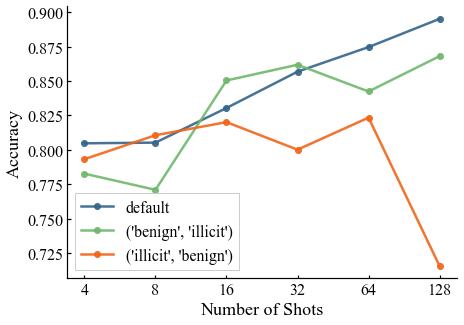

labelorder1: ('illicit', 'benign')


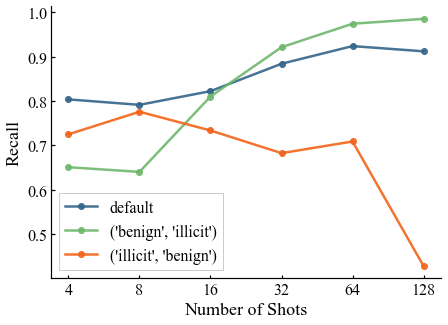

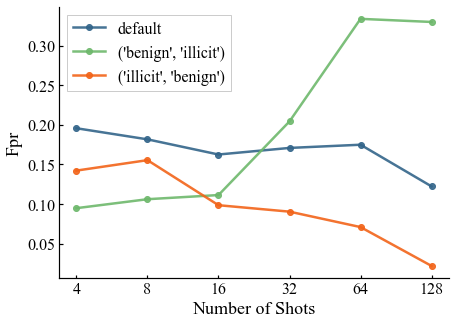

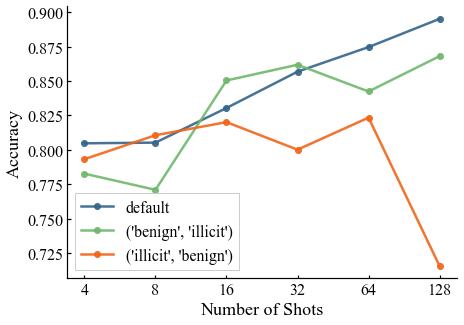

In [29]:

from itertools import permutations
labels = ['benign', 'illicit']
labels_permutations = list(permutations(labels))

exp4_default_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_shots=[4,8,16,32,64,128], filtered_retrieval_name=['random'])
#   display(exp4_default_performance_df)

for i, shot_label_order in enumerate(labels_permutations):
    print(f"labelorder{i}: {shot_label_order}")
    exp4_labelorder_performance_df = aggregate_performance_data(f'exp4_labelorder{i}', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_retrieval_name=['random'])
    # display(exp4_labelorder_performance_df)

    # visualize the performance of the model with different label orders
    colors = ['#33658A','#6EB86C','#F26419', '#F6C85F']
    metrics = ['recall', 'fpr', 'accuracy']
    for metric in metrics:
        fig, ax = plt.subplots(figsize=(7, 5))
        ax.set_xticks(np.arange(len(exp4_default_performance_df['n_shots'].unique().astype(np.str_))))
        ax.set_xticklabels(exp4_default_performance_df['n_shots'].unique().astype(np.str_))
        ax.plot(exp4_default_performance_df['n_shots'].unique().astype(np.str_), exp4_default_performance_df[metric], marker='o', linestyle='-', color=colors[0], linewidth=2.5, alpha=0.9, label='default')

        for i, shot_label_order in enumerate(labels_permutations):
            exp4_labelorder_performance_df = aggregate_performance_data(f'exp4_labelorder{i}', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_retrieval_name=['random'])
            ax.plot(exp4_labelorder_performance_df['n_shots'].unique().astype(np.str_), exp4_labelorder_performance_df[metric], marker='o', linestyle='-', linewidth=2.5, alpha=0.9, label=shot_label_order, color=colors[i+1])
        
        ax.legend(loc='best')
        # ax.set_title(f'Label Order - {retreival}: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0, color='orange')
        ax.set_xlabel('Number of Shots')
        ax.set_ylabel(metric.capitalize())
        # Clean spines
        for spine in ['top', 'right']:
            ax.spines[spine].set_visible(False)
        ax.tick_params(top=False, right=False)
        plt.show()


## Exp7 Needle-in-Haystack

,n_shots,model,random_seed,retrieval,accuracy_in-demo,accuracy_not-in-demo
0,2,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.992629,0.767709
1,4,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.957182,0.804685
2,8,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.982370,0.805190
3,16,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.992416,0.830363
4,32,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.995624,0.856771
5,64,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.994819,0.874649
6,128,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.998643,0.895174


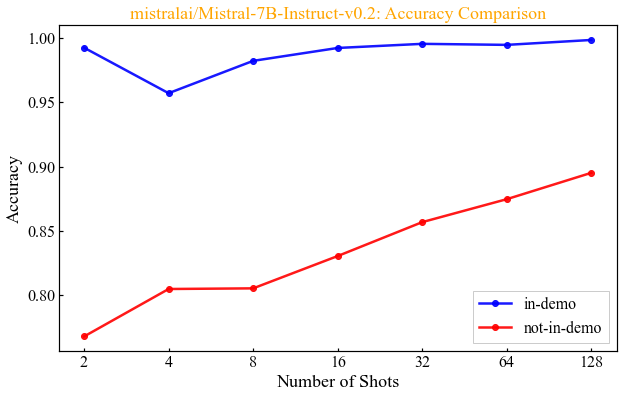

,n_shots,model,random_seed,retrieval,accuracy_in-demo,accuracy_not-in-demo
0,2,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.926786,0.698930
1,4,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.972247,0.795926
2,8,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.977599,0.831818
3,16,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.965179,0.871812
4,32,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.966816,0.882891
5,64,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.968666,0.890714
6,128,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.991055,0.909632


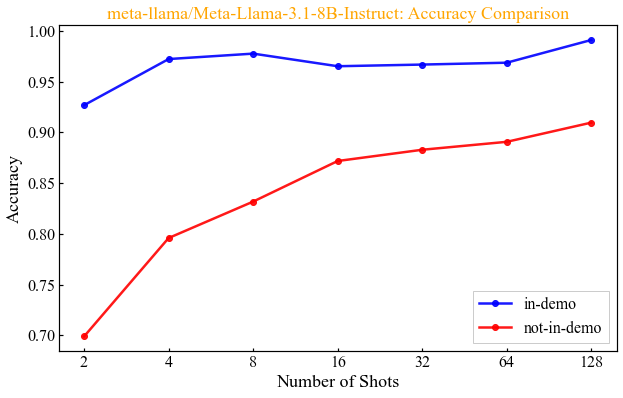

,n_shots,model,random_seed,retrieval,accuracy_in-demo,accuracy_not-in-demo
0,2,microsoft/Phi-3-small-128k-instruct,42,random,0.931923,0.691297
1,4,microsoft/Phi-3-small-128k-instruct,42,random,0.954756,0.694063
2,8,microsoft/Phi-3-small-128k-instruct,42,random,0.967880,0.715767
3,16,microsoft/Phi-3-small-128k-instruct,42,random,0.968687,0.726123
4,32,microsoft/Phi-3-small-128k-instruct,42,random,0.988439,0.780887
5,64,microsoft/Phi-3-small-128k-instruct,42,random,0.971311,0.818388
6,128,microsoft/Phi-3-small-128k-instruct,42,random,0.971698,0.814037


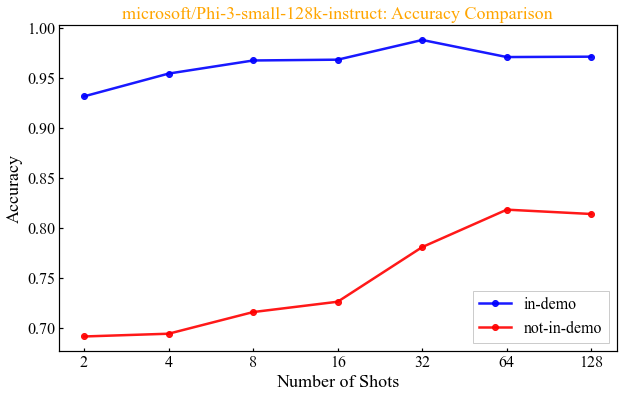

,n_shots,model,random_seed,retrieval,accuracy_in-demo,accuracy_not-in-demo
0,2,Qwen/Qwen2.5-7B-Instruct,42,random,0.578616,0.700664
1,4,Qwen/Qwen2.5-7B-Instruct,42,random,0.686820,0.758256
2,8,Qwen/Qwen2.5-7B-Instruct,42,random,0.898451,0.770189
3,16,Qwen/Qwen2.5-7B-Instruct,42,random,0.767123,0.809729
4,32,Qwen/Qwen2.5-7B-Instruct,42,random,0.871220,0.840538
5,64,Qwen/Qwen2.5-7B-Instruct,42,random,0.927290,0.865760
6,128,Qwen/Qwen2.5-7B-Instruct,42,random,0.861266,0.886045


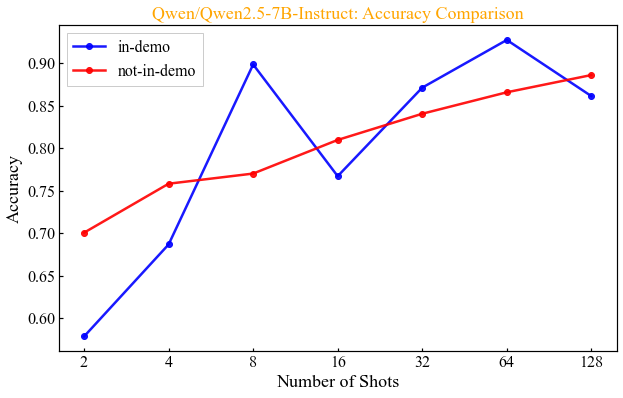

In [30]:

models = ['mistralai/Mistral-7B-Instruct-v0.2', 'meta-llama/Meta-Llama-3.1-8B-Instruct', 'microsoft/Phi-3-small-128k-instruct', 'Qwen/Qwen2.5-7B-Instruct']

for model in models:
  exp7_haystack_performance_df = aggregate_performance_data('exp7_haystack', model, binary_results_all_df, filtered_metrics=['accuracy'])
  exp1_df = aggregate_performance_data('exp1', model, binary_results_all_df, filtered_metrics=['accuracy'], filtered_retrieval_name=['random'], filtered_shots=[2,4,8,16,32,64,128])
  comparison_df = pd.merge(exp7_haystack_performance_df, exp1_df, on=['model', 'random_seed', 'n_shots', 'retrieval'], suffixes=('_in-demo', '_not-in-demo')).drop('exp_in-demo', axis=1).drop('exp_not-in-demo', axis=1)
  display(comparison_df)

  # plot
  plt.figure(figsize=(10, 6))
  plt.xticks(np.arange(len(comparison_df['n_shots'].unique().astype(np.str_))), comparison_df['n_shots'].unique().astype(np.str_))
  plt.plot(comparison_df['n_shots'].unique().astype(np.str_), comparison_df['accuracy_in-demo'], marker='o', linestyle='-', color='blue', linewidth=2.5, alpha=0.9, label='in-demo')
  plt.plot(comparison_df['n_shots'].unique().astype(np.str_), comparison_df['accuracy_not-in-demo'], marker='o', linestyle='-', color='red', linewidth=2.5, alpha=0.9, label='not-in-demo')
  plt.legend(loc='best')
  plt.title(f'{model}: Accuracy Comparison', loc='center', fontsize=18, fontweight=0, color='orange')
  plt.xlabel('Number of Shots')
  plt.ylabel('Accuracy')
  plt.show()

### Figure 9

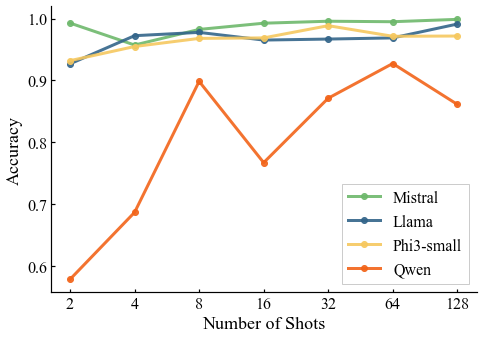

In [31]:

models = ['mistralai/Mistral-7B-Instruct-v0.2', 'meta-llama/Meta-Llama-3.1-8B-Instruct', 'microsoft/Phi-3-small-128k-instruct', 'Qwen/Qwen2.5-7B-Instruct']
exp7_haystack_performance_dfs = []
for model in models:
  exp7_haystack_performance_dfs.append(aggregate_performance_data('exp7_haystack', model, binary_results_all_df, filtered_metrics=['accuracy']))
#   exp1_df = aggregate_performance_data('exp1', model, binary_results_all_df, filtered_metrics=['accuracy'], filtered_retrieval_name=['random'], filtered_shots=[2,4,8,16,32,64,128])
#   comparison_df = pd.merge(exp7_haystack_performance_df, exp1_df, on=['model', 'random_seed', 'n_shots', 'retrieval'], suffixes=('_in-demo', '_not-in-demo')).drop('exp_in-demo', axis=1).drop('exp_not-in-demo', axis=1)
#   display(comparison_df)

colors = ['#6EB86C','#33658A', '#F6C85F', '#F26419']
fig, ax = plt.subplots(figsize=(7, 5))

# Clean spines
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.tick_params(top=False, right=False)

ax.set_xticks(np.arange(len(exp7_haystack_performance_dfs[0]['n_shots'].unique().astype(np.str_))))
ax.set_xticklabels(exp7_haystack_performance_dfs[0]['n_shots'].unique().astype(np.str_))
metric = 'accuracy'
ax.plot(exp7_haystack_performance_dfs[0]['n_shots'].unique().astype(np.str_), exp7_haystack_performance_dfs[0][metric], marker='o', linestyle='-', color=colors[0], linewidth=3, alpha=0.9, label='Mistral')
ax.plot(exp7_haystack_performance_dfs[1]['n_shots'].unique().astype(np.str_), exp7_haystack_performance_dfs[1][metric], marker='o', linestyle='-', color=colors[1], linewidth=3, alpha=0.9, label='Llama')
ax.plot(exp7_haystack_performance_dfs[2]['n_shots'].unique().astype(np.str_), exp7_haystack_performance_dfs[2][metric], marker='o', linestyle='-', color=colors[2], linewidth=3, alpha=0.9, label='Phi3-small')
ax.plot(exp7_haystack_performance_dfs[3]['n_shots'].unique().astype(np.str_), exp7_haystack_performance_dfs[3][metric], marker='o', linestyle='-', color=colors[3], linewidth=3, alpha=0.9, label='Qwen')
ax.legend(loc='best')
# plt.title(f'Binary Exp10 Label Name: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
ax.set_xlabel('Number of Shots')
ax.set_ylabel(metric.capitalize())
plt.tight_layout()
fig = plt.gcf()
filename_base = f"exp7_haystack_accuracy"
fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

## Exp5 Context Length

In [32]:

exp5_performance_df = binary_results_all_df[binary_results_all_df['exp'] == 'exp5_contextlength']
display(exp5_performance_df)

,exp,task,model,random_seed,n_shots,retrieval,precision,recall,f1,fpr,accuracy,pos_label
755,exp5_contextlength,binary,mistral_8192,42,32,semantic,0.909761,0.935606,0.922502,0.084337,0.925158,illicit
756,exp5_contextlength,binary,mistral_16384,42,32,semantic,0.909761,0.935606,0.922502,0.084337,0.925158,illicit
757,exp5_contextlength,binary,mistral_32768,42,32,semantic,0.909761,0.935606,0.922502,0.084337,0.925158,illicit
758,exp5_contextlength,binary,llama_8192,42,32,semantic,0.765957,0.947368,0.847059,0.261905,0.837500,illicit
759,exp5_contextlength,binary,llama_16384,42,32,semantic,0.765957,0.947368,0.847059,0.261905,0.837500,illicit
760,exp5_contextlength,binary,llama_32768,42,32,semantic,0.765957,0.947368,0.847059,0.261905,0.837500,illicit
761,exp5_contextlength,binary,llama_65536,42,32,semantic,0.765957,0.947368,0.847059,0.261905,0.837500,illicit
762,exp5_contextlength,binary,llama_131072,42,32,semantic,0.765957,0.947368,0.847059,0.261905,0.837500,illicit


## Exp6 Generalization

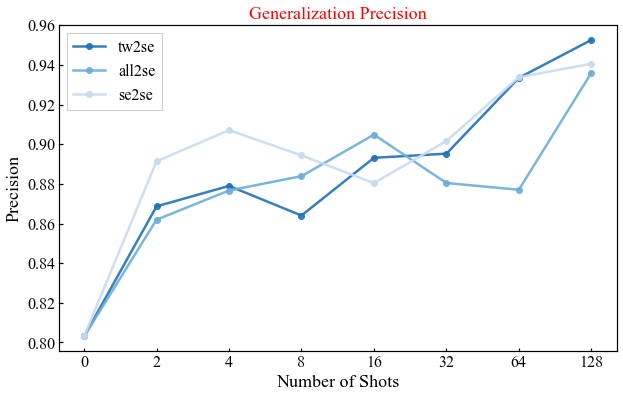

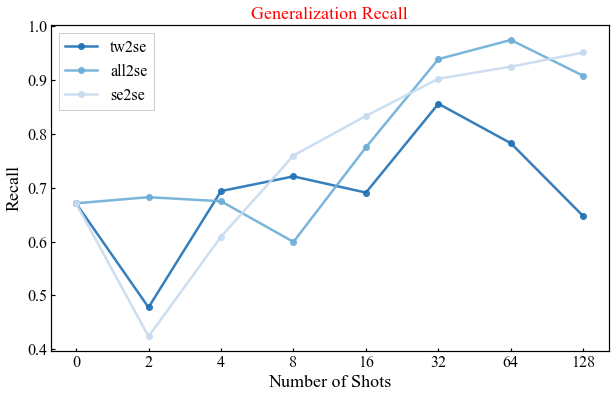

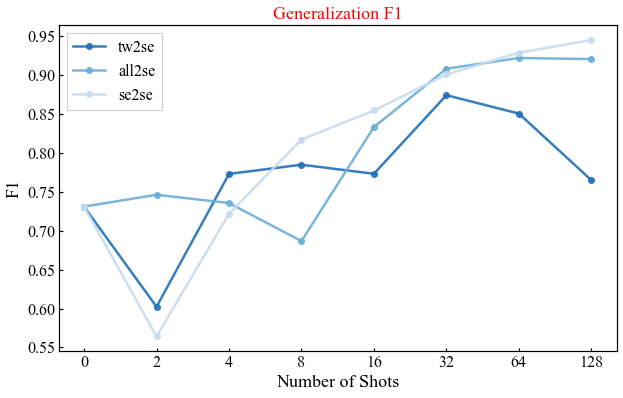

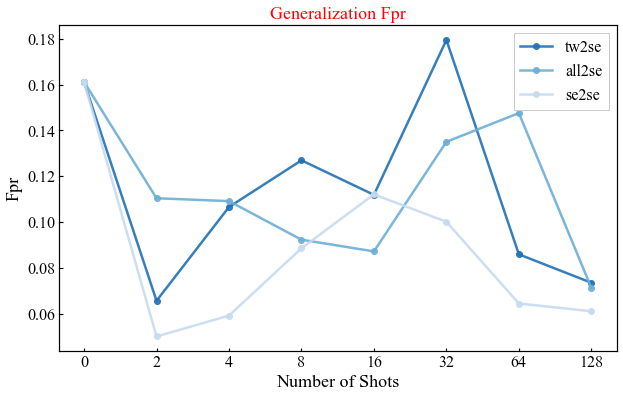

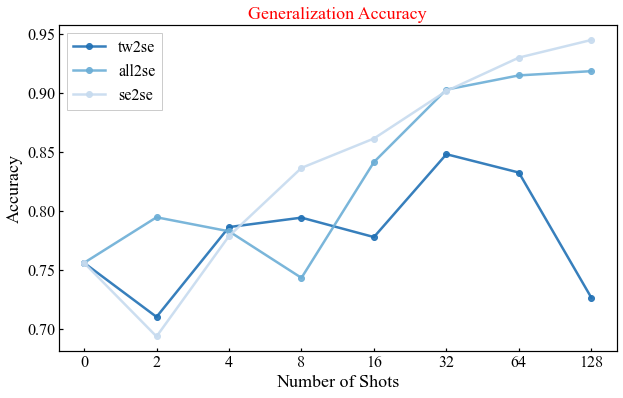

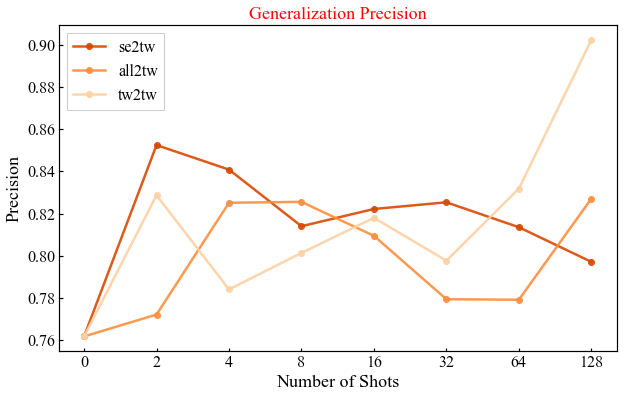

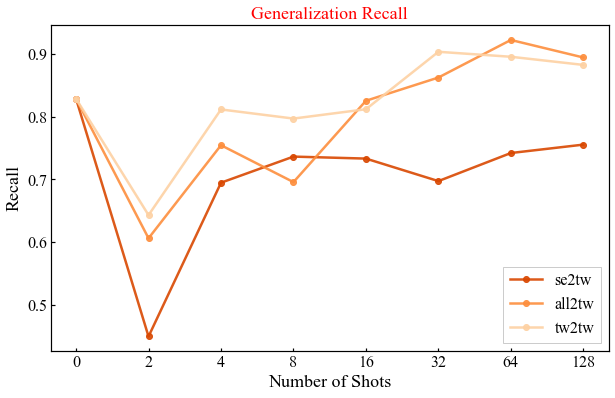

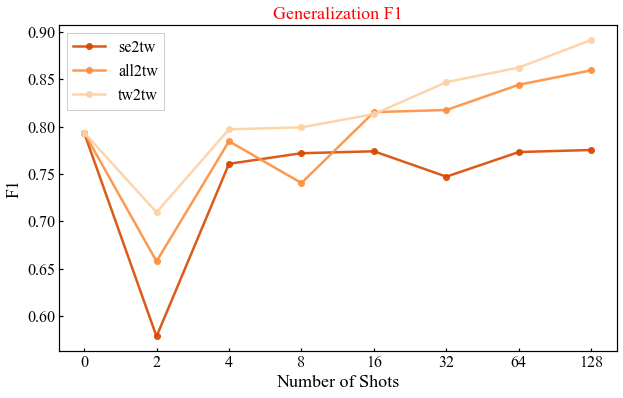

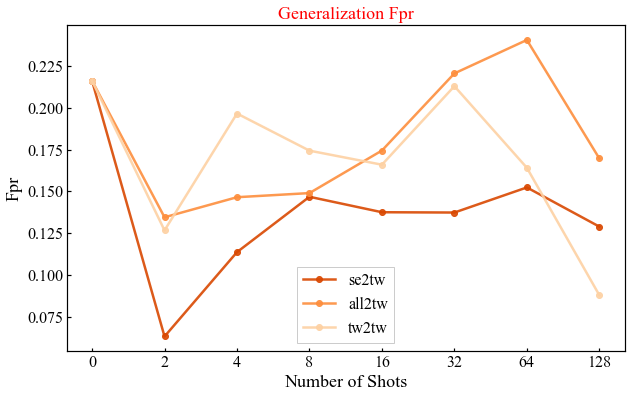

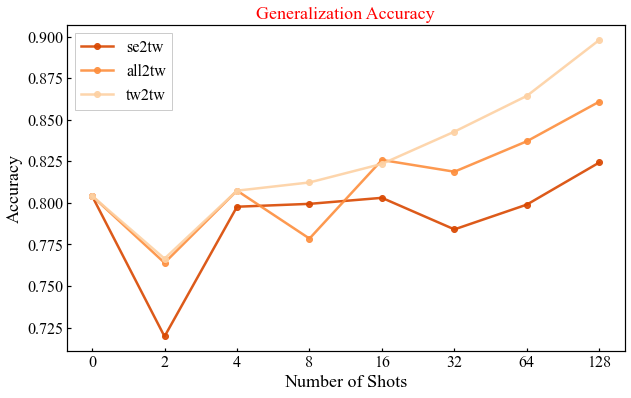

In [33]:
import seaborn as sns

exp6_tw2se_performance_df = aggregate_performance_data('exp6_generalization_tw2se', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp6_se2tw_performance_df = aggregate_performance_data('exp6_generalization_se2tw', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp6_all2tw_performance_df = aggregate_performance_data('exp6_generalization_all2tw', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp6_all2se_performance_df = aggregate_performance_data('exp6_generalization_all2se', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp6_tw2tw_performance_df = aggregate_performance_data('exp6_generalization_tw2tw', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp6_se2se_performance_df = aggregate_performance_data('exp6_generalization_se2se', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)

palette_group1 = sns.color_palette("Blues_r", 3)  # Blue shades for group 1
palette_group2 = sns.color_palette("Oranges_r", 3)   # Red shades for group 2


for metric in ['precision', 'recall', 'f1', 'fpr', 'accuracy']:
  plt.figure(figsize=(10, 6))
  plt.xticks(np.arange(len(exp6_tw2se_performance_df['n_shots'].unique().astype(np.str_))), exp6_tw2se_performance_df['n_shots'].unique().astype(np.str_))

  plt.plot(exp6_tw2se_performance_df['n_shots'].unique().astype(np.str_), exp6_tw2se_performance_df[metric], marker='o', linestyle='-', color=palette_group1[0], linewidth=2.5, alpha=0.9, label='tw2se')
  plt.plot(exp6_all2se_performance_df['n_shots'].unique().astype(np.str_), exp6_all2se_performance_df[metric], marker='o', linestyle='-', color=palette_group1[1], linewidth=2.5, alpha=0.9, label='all2se')
  plt.plot(exp6_se2se_performance_df['n_shots'].unique().astype(np.str_), exp6_se2se_performance_df[metric], marker='o', linestyle='-', color=palette_group1[2], linewidth=2.5, alpha=0.9, label='se2se')

  plt.legend(loc='best')
  plt.title(f'Generalization {metric.capitalize()}', loc='center', fontsize=18, fontweight=0, color='red')
  plt.xlabel('Number of Shots')
  plt.ylabel(metric.capitalize())
  plt.show()

for metric in ['precision', 'recall', 'f1', 'fpr', 'accuracy']:
  plt.figure(figsize=(10, 6))
  plt.xticks(np.arange(len(exp6_tw2se_performance_df['n_shots'].unique().astype(np.str_))), exp6_tw2se_performance_df['n_shots'].unique().astype(np.str_))

  plt.plot(exp6_se2tw_performance_df['n_shots'].unique().astype(np.str_), exp6_se2tw_performance_df[metric], marker='o', linestyle='-', color=palette_group2[0], linewidth=2.5, alpha=0.9, label='se2tw')
  plt.plot(exp6_all2tw_performance_df['n_shots'].unique().astype(np.str_), exp6_all2tw_performance_df[metric], marker='o', linestyle='-', color=palette_group2[1], linewidth=2.5, alpha=0.9, label='all2tw')
  plt.plot(exp6_tw2tw_performance_df['n_shots'].unique().astype(np.str_), exp6_tw2tw_performance_df[metric], marker='o', linestyle='-', color=palette_group2[2], linewidth=2.5, alpha=0.9, label='tw2tw')

  plt.legend(loc='best')
  plt.title(f'Generalization {metric.capitalize()}', loc='center', fontsize=18, fontweight=0, color='red')
  plt.xlabel('Number of Shots')
  plt.ylabel(metric.capitalize())
  plt.show()

## Exp10 Label Name

,exp,model,random_seed,n_shots,retrieval,precision,recall,f1,fpr,accuracy
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,0,semantic,0.779070,0.741150,0.759637,0.189621,0.777545
1,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,2,semantic,0.876168,0.726744,0.794492,0.094139,0.820204
2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,4,semantic,0.884026,0.778420,0.827869,0.094812,0.844156
3,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,8,semantic,0.888000,0.850575,0.868885,0.098074,0.877402
4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,16,semantic,0.907336,0.888469,0.897803,0.083189,0.903255
5,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,32,semantic,0.911111,0.935361,0.923077,0.082616,0.925926
6,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.904762,0.946360,0.925094,0.090435,0.927074
7,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,128,semantic,0.923221,0.955426,0.939048,0.073214,0.940520


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp10_labelname_flip,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.302987,0.527228,0.384824,0.890909,0.286164
1,2,exp10_labelname_flip,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.583569,0.812623,0.679308,0.516696,0.638476
2,4,exp10_labelname_flip,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.600000,0.838835,0.699595,0.502618,0.659007
3,8,exp10_labelname_flip,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.659574,0.828244,0.734349,0.385542,0.715837
4,16,exp10_labelname_flip,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.748744,0.849810,0.796082,0.259516,0.792572
5,32,exp10_labelname_flip,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.835185,0.862333,0.848542,0.153184,0.854167
6,64,exp10_labelname_flip,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.892000,0.859345,0.875368,0.093103,0.884440
7,128,exp10_labelname_flip,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.927593,0.916828,0.922179,0.064348,0.926740


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.534759,0.641026,0.583090,0.513274,0.560676
1,2,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.630137,0.778195,0.696384,0.413969,0.677391
2,4,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.728732,0.853383,0.786147,0.287415,0.779464
3,8,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.794165,0.921053,0.852916,0.215986,0.849107
4,16,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.865646,0.956767,0.908929,0.134354,0.908929
5,32,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.901408,0.962406,0.930909,0.095238,0.932143
6,64,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.912966,0.966165,0.938813,0.083333,0.940179
7,128,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.931532,0.971805,0.951242,0.064626,0.952679


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.609756,0.357143,0.450450,0.222222,0.570423
1,2,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.515850,0.445274,0.477971,0.382688,0.535077
2,4,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.643454,0.617647,0.630286,0.298368,0.662516
3,8,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.761364,0.792899,0.776812,0.213198,0.789617
4,16,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.863128,0.858333,0.860724,0.130319,0.864130
5,32,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.922857,0.880109,0.900976,0.075209,0.902204
6,64,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.954178,0.898477,0.925490,0.046961,0.924603
7,128,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.973494,0.911964,0.941725,0.026895,0.941315


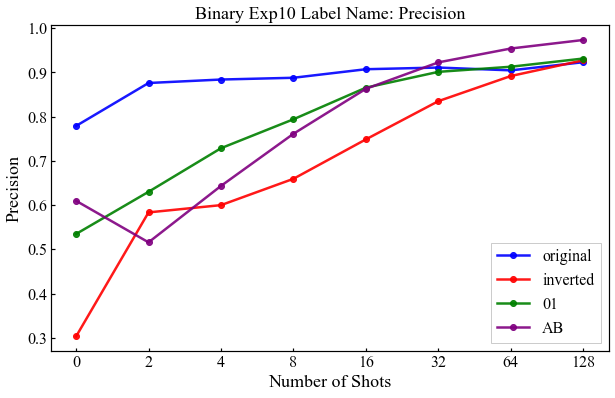

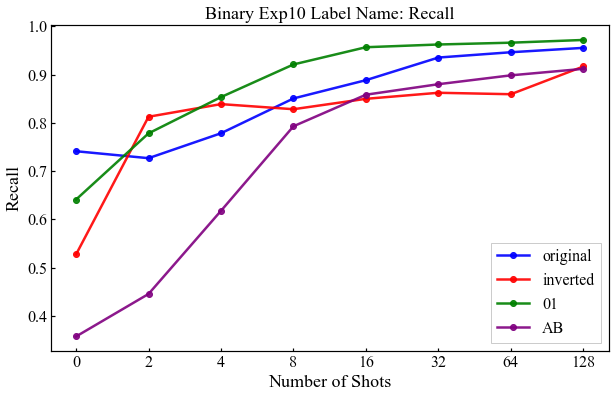

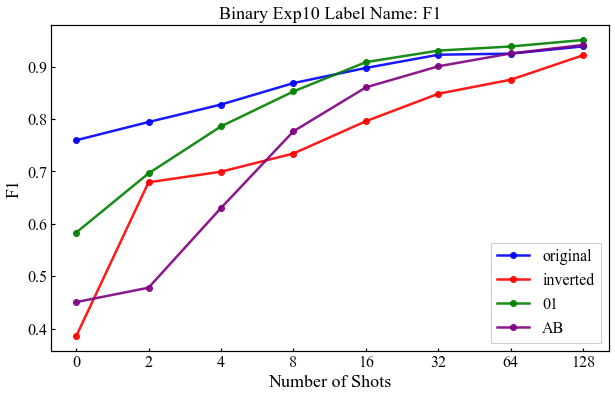

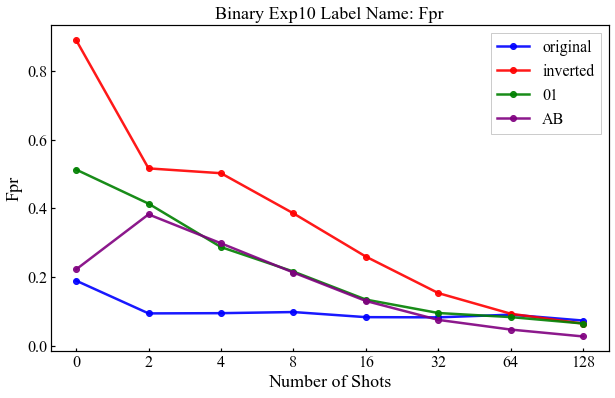

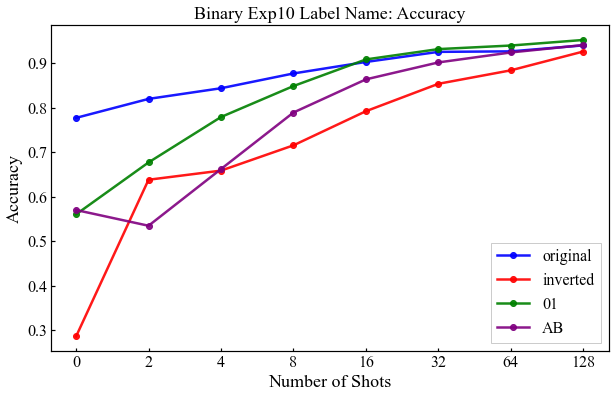

In [34]:

exp10_default_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_retrieval_name=['semantic'])
exp10_flip_performance_df = aggregate_performance_data('exp10_labelname_flip', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp10_01_performance_df = aggregate_performance_data('exp10_labelname_01', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp10_AB_performance_df = aggregate_performance_data('exp10_labelname_AB', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)

display(exp10_default_performance_df)
display(exp10_flip_performance_df)
display(exp10_01_performance_df)
display(exp10_AB_performance_df)

for metric in ['precision', 'recall', 'f1', 'fpr', 'accuracy']:
    plt.figure(figsize=(10, 6))
    plt.xticks(np.arange(len(exp10_default_performance_df['n_shots'].unique().astype(np.str_))), exp10_default_performance_df['n_shots'].unique().astype(np.str_))
    plt.plot(exp10_default_performance_df['n_shots'].unique().astype(np.str_), exp10_default_performance_df[metric], marker='o', linestyle='-', color='blue', linewidth=2.5, alpha=0.9, label='original')
    plt.plot(exp10_flip_performance_df['n_shots'].unique().astype(np.str_), exp10_flip_performance_df[metric], marker='o', linestyle='-', color='red', linewidth=2.5, alpha=0.9, label='inverted')
    plt.plot(exp10_01_performance_df['n_shots'].unique().astype(np.str_), exp10_01_performance_df[metric], marker='o', linestyle='-', color='green', linewidth=2.5, alpha=0.9, label='01')
    plt.plot(exp10_AB_performance_df['n_shots'].unique().astype(np.str_), exp10_AB_performance_df[metric], marker='o', linestyle='-', color='purple', linewidth=2.5, alpha=0.9, label='AB')
    plt.legend(loc='best')
    plt.title(f'Binary Exp10 Label Name: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    plt.xlabel('Number of Shots')
    plt.ylabel(metric.capitalize())
    plt.show()

### Figure 5a

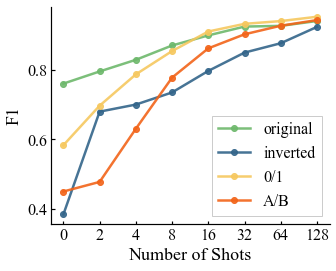

In [35]:
exp10_default_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_retrieval_name=['semantic'])
exp10_flip_performance_df = aggregate_performance_data('exp10_labelname_flip', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp10_01_performance_df = aggregate_performance_data('exp10_labelname_01', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)
exp10_AB_performance_df = aggregate_performance_data('exp10_labelname_AB', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df)

colors = ['#6EB86C','#33658A', '#F6C85F', '#F26419']
for metric in ['f1']:
    fig, ax = plt.subplots(figsize=(5, 4))

    # Clean spines
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    ax.tick_params(top=False, right=False)

    ax.set_xticks(np.arange(len(exp10_default_performance_df['n_shots'].unique().astype(np.str_))))
    ax.set_xticklabels(exp10_default_performance_df['n_shots'].unique().astype(np.str_))
    ax.plot(exp10_default_performance_df['n_shots'].unique().astype(np.str_), exp10_default_performance_df[metric], marker='o', linestyle='-', color=colors[0], linewidth=2.5, alpha=0.9, label='original')
    ax.plot(exp10_flip_performance_df['n_shots'].unique().astype(np.str_), exp10_flip_performance_df[metric], marker='o', linestyle='-', color=colors[1], linewidth=2.5, alpha=0.9, label='inverted')
    ax.plot(exp10_01_performance_df['n_shots'].unique().astype(np.str_), exp10_01_performance_df[metric], marker='o', linestyle='-', color=colors[2], linewidth=2.5, alpha=0.9, label='0/1')
    ax.plot(exp10_AB_performance_df['n_shots'].unique().astype(np.str_), exp10_AB_performance_df[metric], marker='o', linestyle='-', color=colors[3], linewidth=2.5, alpha=0.9, label='A/B')
    ax.legend(loc='best')
    # plt.title(f'Binary Exp10 Label Name: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    ax.set_xlabel('Number of Shots')
    ax.set_ylabel(metric.capitalize())
    # plt.show()
    for fig_num in plt.get_fignums():
        fig = plt.figure(fig_num)
        for ax in fig.axes:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.tick_params(top=False, right=False)
            fig = plt.gcf()

            filename_base = f"exp10_binary_label_name"
            fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

            # plt.close(fig)

# 3. Multiclass Task Analysis

In [36]:
import json
pd.set_option('display.max_rows', None)

output_dir = "./Result/task_multiclass"
# output_dir = "/content/drive/MyDrive/LLM_ICL/Workspace/Result"

results_all = []
with open(f'{output_dir}/results_all.json', 'r') as f:
    for line in f.readlines():
        results_all.append(json.loads(line))

multiclass_results_all_df = pd.DataFrame(results_all)
# Split the 'metrics' column into separate columns
metrics_df = multiclass_results_all_df['metrics'].apply(pd.Series)['overall'].apply(pd.Series)
metrics_df = metrics_df.drop(0, axis=1)
# Merge the new columns back into the original dataframe
multiclass_results_all_df = pd.concat([multiclass_results_all_df.drop('metrics', axis=1), metrics_df], axis=1)
display(multiclass_results_all_df)

,exp,task,model,random_seed,n_shots,retrieval,precision,recall,f1,accuracy
0,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,42,0,random,0.584435,0.342044,0.357315,0.312308
1,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,42,0,lexical,0.584435,0.342044,0.357315,0.312308
2,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,42,0,semantic,0.584435,0.342044,0.357315,0.312308
3,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,42,2,lexical,0.787752,0.635771,0.655689,0.580000
4,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,42,2,semantic,0.794151,0.652318,0.668971,0.596154
5,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,42,2,random,0.593241,0.464034,0.469985,0.426154
6,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,43,2,random,0.638759,0.415626,0.423407,0.384615
7,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,44,2,random,0.586091,0.435105,0.433457,0.407692
8,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,45,2,random,0.600246,0.453329,0.472041,0.423846
9,exp1,category,mistralai/Mistral-7B-Instruct-v0.2,46,2,random,0.600156,0.449153,0.443206,0.410000


### Figure 1b: Performance Plateau in Multiclass Classification with Increasing Number of Shots

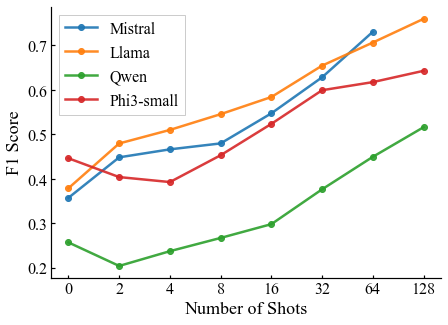

In [37]:
exp1_llms_multiclass_random_performance_df = aggregate_performance_data('exp1', '', multiclass_results_all_df, filtered_metrics=['f1'], filtered_retrieval_name=['random'])
# display(exp1_llms_multiclass_random_performance_df)


for metric in ['f1']:
    plt.figure(figsize=(7, 5))
    plt.xticks(np.arange(len(exp1_llms_multiclass_random_performance_df['n_shots'].unique().astype(np.str_))), exp1_llms_multiclass_random_performance_df['n_shots'].unique().astype(np.str_))
    # models = exp1_llms_multiclass_random_performance_df['model'].unique()
    models = ['mistralai/Mistral-7B-Instruct-v0.2', 'meta-llama/Meta-Llama-3.1-8B-Instruct', 'Qwen/Qwen2.5-7B-Instruct','microsoft/Phi-3-small-128k-instruct']
    for model in models:
        model_data = exp1_llms_multiclass_random_performance_df[exp1_llms_multiclass_random_performance_df['model'] == model]
        plt.plot(model_data['n_shots'].unique().astype(np.str_), model_data[metric], marker='o', linestyle='-', linewidth=2.5, alpha=0.9, label=model)


    # map full model names to short labels for legend
    label_map = {
        'mistralai/Mistral-7B-Instruct-v0.2': 'Mistral',
        'meta-llama/Meta-Llama-3.1-8B-Instruct': 'Llama',
        'Qwen/Qwen2.5-7B-Instruct': 'Qwen',
        'microsoft/Phi-3-small-128k-instruct': 'Phi3-small',
        'microsoft/Phi-3-mini-128k-instruct': 'Phi3-mini'
    }

    ax = plt.gca()
    for line in ax.get_lines():
        lbl = line.get_label()
        if lbl in label_map:
            line.set_label(label_map[lbl])

    # plt.title(f'Performance Plateau in Multiclass Classification with Increasing Number of Shots', loc='center', fontsize=18, fontweight=0)
    plt.xlabel('Number of Shots')
    plt.ylabel('F1 Score')

    plt.legend(loc='best')
    # hide top and right spines for all open figures/axes
    for fig_num in plt.get_fignums():
        fig = plt.figure(fig_num)
        for ax in fig.axes:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.tick_params(top=False, right=False)
            fig = plt.gcf()

            filename_base = f"exp1_multiclass_random_f1"
            fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

            # plt.close(fig)



### Figure 2b: Comparison of Demonstration Selection Strategies for Multiclass Classification (Mistral)

C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


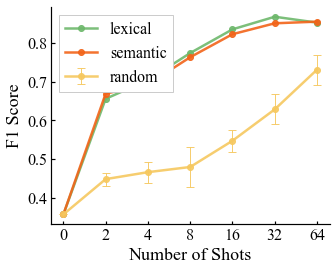

In [39]:

exp1_mistral_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df)
exp1_mistral_random_std_df = calc_std_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df)

# visualize_performance(exp1_mistral_performance_df, exp1_mistral_random_std_df, 'mistral', task_name='binary', metrics=['f1', 'fpr'])
colors = ['#F6C85F', '#6EB86C', '#F26419']

for metric in ['f1']:
        plt.figure(figsize=(5, 4))
        palette = plt.get_cmap('Set1')
        plt.xticks(np.arange(len(exp1_mistral_performance_df['n_shots'].unique().astype(np.str_))), exp1_mistral_performance_df['n_shots'].unique().astype(np.str_))


        for retrieval in ['random', 'lexical', 'semantic']:
            if retrieval == 'random':
                subset = exp1_mistral_performance_df[exp1_mistral_performance_df['retrieval'] == 'random']
                std_subset = exp1_mistral_random_std_df
                plt.errorbar(subset['n_shots'].unique().astype(np.str_), subset[metric], yerr=std_subset[f'{metric}_std'], marker='o', linestyle='-', color=colors[['random', 'lexical', 'semantic'].index(retrieval)], linewidth=2.5, alpha=0.9, elinewidth=1, capsize=4, capthick=1, label=retrieval)
            else:
                subset = exp1_mistral_performance_df[exp1_mistral_performance_df['retrieval'] == retrieval]
                # Plot as line with markers for all points
                plt.plot(subset['n_shots'].unique().astype(np.str_), subset[metric], marker='o', linestyle='-', color=colors[['random', 'lexical', 'semantic'].index(retrieval)], linewidth=2.5, alpha=0.9, label=retrieval)
        # Add legend
        plt.legend(loc='best')

        # Add titles and labels
        plt.xlabel('Number of Shots')
        plt.ylabel('F1 Score')

        # Show the plot
        # plt.show()

        for fig_num in plt.get_fignums():
            fig = plt.figure(fig_num)
            for ax in fig.axes:
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.tick_params(top=False, right=False)
                fig = plt.gcf()

                filename_base = f"exp1_multiclass_mistral_f1"
                fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

                # plt.close(fig)


,exp,model,random_seed,n_shots,retrieval,f1,accuracy
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,0,semantic,0.357315,0.312308
1,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,0,semantic,0.378878,0.336923
2,exp1,Qwen/Qwen2.5-7B-Instruct,42,0,semantic,0.256937,0.196923
3,exp1,microsoft/Phi-3-small-128k-instruct,42,0,semantic,0.446217,0.425385
4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,2,semantic,0.668971,0.596154
5,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,2,semantic,0.781613,0.710000
6,exp1,Qwen/Qwen2.5-7B-Instruct,42,2,semantic,0.352057,0.278462
7,exp1,microsoft/Phi-3-small-128k-instruct,42,2,semantic,0.678372,0.570769
8,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,4,semantic,0.692814,0.617692
9,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,4,semantic,0.788097,0.715385


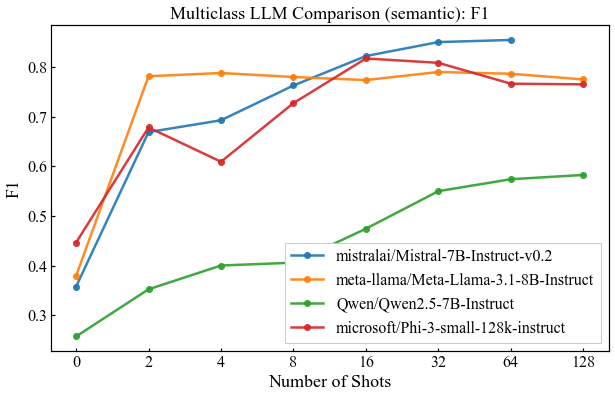

In [40]:
# @ exp1_multiclass_comparison

exp1_llms_multiclass_performance_df = aggregate_performance_data('exp1', '', multiclass_results_all_df, filtered_metrics=['f1', 'accuracy'], filtered_retrieval_name=['semantic'])
display(exp1_llms_multiclass_performance_df)


for metric in ['f1']:
    plt.figure(figsize=(10, 6))
    plt.xticks(np.arange(len(exp1_llms_multiclass_performance_df['n_shots'].unique().astype(np.str_))), exp1_llms_multiclass_performance_df['n_shots'].unique().astype(np.str_))
    models = exp1_llms_multiclass_performance_df['model'].unique()
    for model in models:
        model_data = exp1_llms_multiclass_performance_df[exp1_llms_multiclass_performance_df['model'] == model]
        plt.plot(model_data['n_shots'].unique().astype(np.str_), model_data[metric], marker='o', linestyle='-', linewidth=2.5, alpha=0.9, label=model)


    plt.title(f'Multiclass LLM Comparison (semantic): {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    plt.xlabel('Number of Shots')
    plt.ylabel(metric.capitalize())

    plt.legend(loc='best')

    plt.show()


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,accuracy
0,0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.584435,0.342044,0.357315,0.312308
1,0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,lexical,0.584435,0.342044,0.357315,0.312308
2,0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.584435,0.342044,0.357315,0.312308
3,2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.595822,0.450354,0.448389,0.416462
4,2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,lexical,0.787752,0.635771,0.655689,0.580000
5,2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.794151,0.652318,0.668971,0.596154
6,4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.602627,0.465998,0.466332,0.431538
7,4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,lexical,0.812053,0.682222,0.703731,0.623077
8,4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.797662,0.678078,0.692814,0.617692
9,8,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.623720,0.463037,0.479699,0.428385


C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


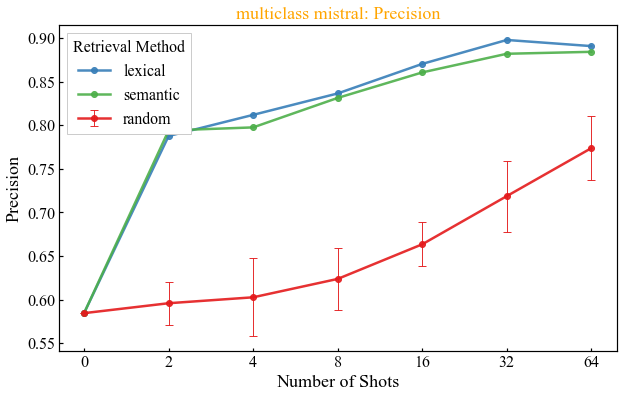

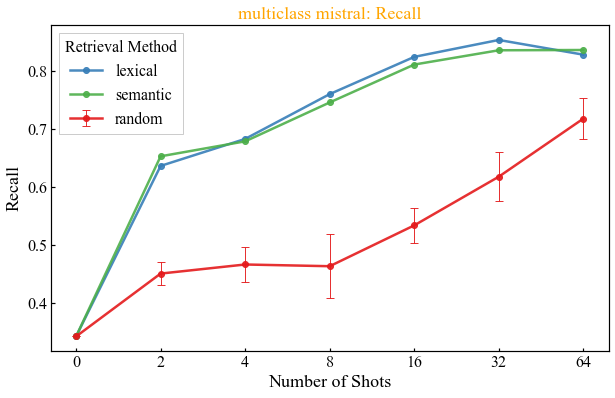

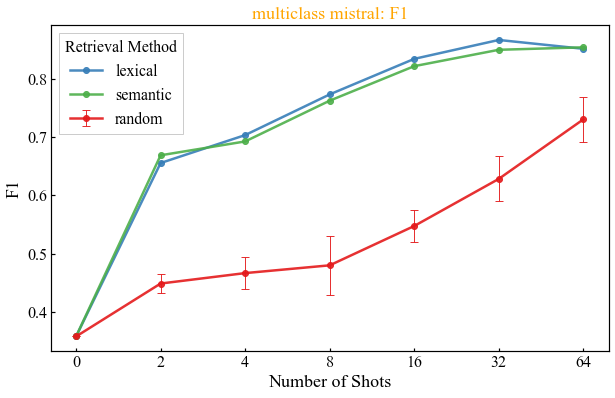

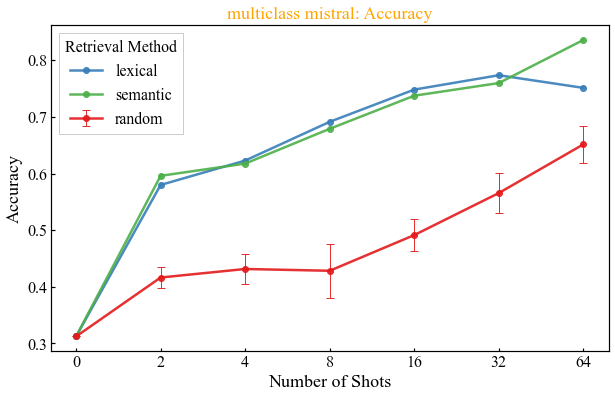

In [41]:

exp1_mistral_multiclass_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'accuracy'])
display(exp1_mistral_multiclass_performance_df)
exp1_mistral_multiclass_std_df = calc_std_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df)
visualize_performance(exp1_mistral_multiclass_performance_df, exp1_mistral_multiclass_std_df, 'mistral', task_name='multiclass', metrics=['precision', 'recall', 'f1', 'accuracy'])

,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,accuracy
0,0,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.540635,0.364896,0.378878,0.336923
1,0,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,lexical,0.540635,0.364896,0.378878,0.336923
2,0,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,semantic,0.540635,0.364896,0.378878,0.336923
3,2,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.581924,0.471562,0.479593,0.438462
4,2,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,lexical,0.834289,0.806034,0.798688,0.733846
5,2,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,semantic,0.823454,0.779858,0.781613,0.710000
6,4,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.612355,0.495189,0.510060,0.458615
7,4,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,lexical,0.844372,0.813957,0.809404,0.740769
8,4,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,semantic,0.829660,0.785683,0.788097,0.715385
9,8,exp1,meta-llama/Meta-Llama-3.1-8B-Instruct,42,random,0.638807,0.538121,0.545500,0.496000


C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


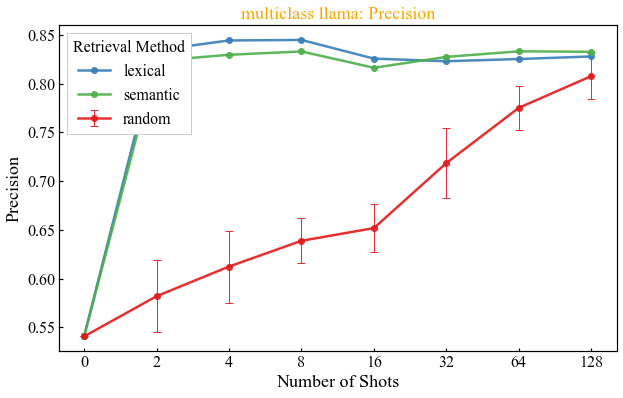

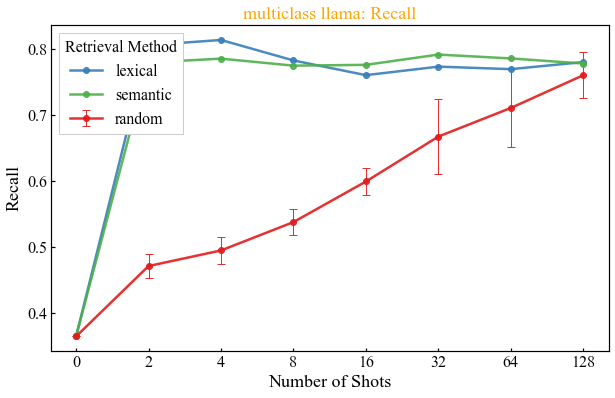

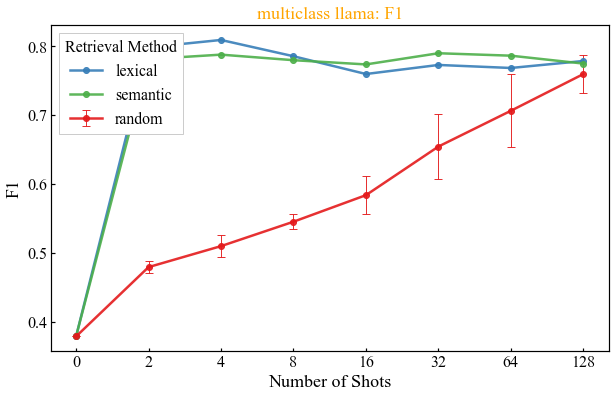

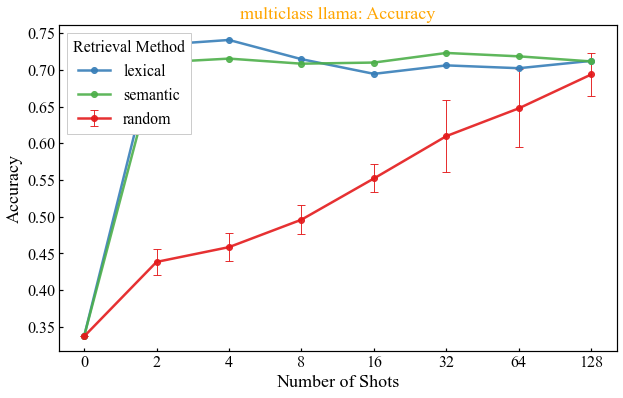

In [42]:

exp1_llama_multiclass_performance_df = aggregate_performance_data('exp1', 'meta-llama/Meta-Llama-3.1-8B-Instruct', multiclass_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'accuracy'])
display(exp1_llama_multiclass_performance_df)
exp1_llama_multiclass_std_df = calc_std_data('exp1', 'meta-llama/Meta-Llama-3.1-8B-Instruct', multiclass_results_all_df)
visualize_performance(exp1_llama_multiclass_performance_df, exp1_llama_multiclass_std_df, 'llama', task_name='multiclass', metrics=['precision', 'recall', 'f1', 'accuracy'])

,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,accuracy
0,0,exp1,microsoft/Phi-3-small-128k-instruct,42,random,0.491569,0.468523,0.446217,0.425385
1,0,exp1,microsoft/Phi-3-small-128k-instruct,42,lexical,0.491569,0.468523,0.446217,0.425385
2,0,exp1,microsoft/Phi-3-small-128k-instruct,42,semantic,0.491569,0.468523,0.446217,0.425385
3,2,exp1,microsoft/Phi-3-small-128k-instruct,42,random,0.514889,0.402760,0.403960,0.363846
4,2,exp1,microsoft/Phi-3-small-128k-instruct,42,lexical,0.826900,0.668257,0.715036,0.603846
5,2,exp1,microsoft/Phi-3-small-128k-instruct,42,semantic,0.801552,0.633237,0.678372,0.570769
6,4,exp1,microsoft/Phi-3-small-128k-instruct,42,random,0.550990,0.388920,0.392760,0.351538
7,4,exp1,microsoft/Phi-3-small-128k-instruct,42,lexical,0.843985,0.549475,0.620850,0.497692
8,4,exp1,microsoft/Phi-3-small-128k-instruct,42,semantic,0.818313,0.540485,0.609188,0.489231
9,8,exp1,microsoft/Phi-3-small-128k-instruct,42,random,0.552510,0.451466,0.453080,0.410462


C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


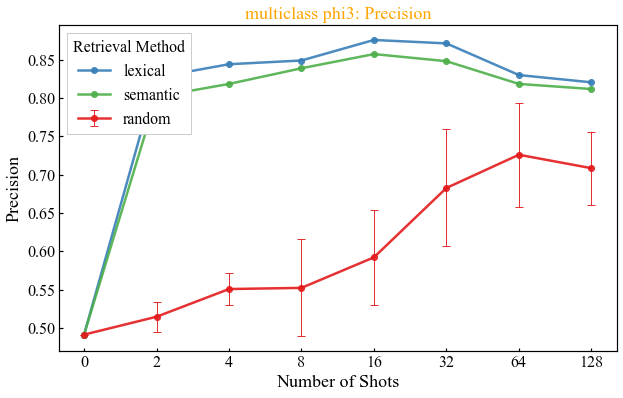

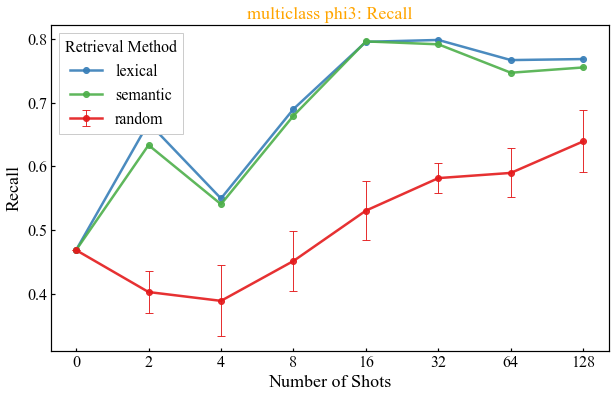

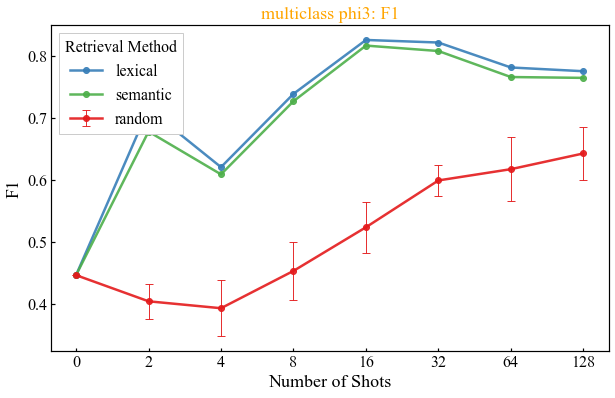

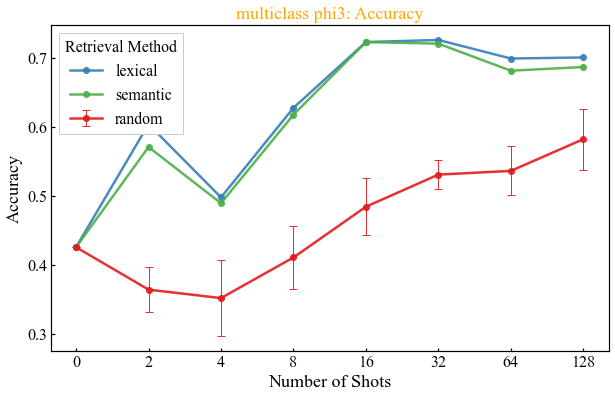

In [43]:

exp1_phi3_multiclass_performance_df = aggregate_performance_data('exp1', 'microsoft/Phi-3-small-128k-instruct', multiclass_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'accuracy'])
display(exp1_phi3_multiclass_performance_df)
exp1_phi3_multiclass_std_df = calc_std_data('exp1', 'microsoft/Phi-3-small-128k-instruct', multiclass_results_all_df)
visualize_performance(exp1_phi3_multiclass_performance_df, exp1_phi3_multiclass_std_df, 'phi3', task_name='multiclass', metrics=['precision', 'recall', 'f1', 'accuracy'])

,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,accuracy
0,0,exp1,Qwen/Qwen2.5-7B-Instruct,42,random,0.508058,0.214364,0.256937,0.196923
1,0,exp1,Qwen/Qwen2.5-7B-Instruct,42,lexical,0.508058,0.214364,0.256937,0.196923
2,0,exp1,Qwen/Qwen2.5-7B-Instruct,42,semantic,0.508058,0.214364,0.256937,0.196923
3,2,exp1,Qwen/Qwen2.5-7B-Instruct,42,random,0.531598,0.194212,0.204057,0.181462
4,2,exp1,Qwen/Qwen2.5-7B-Instruct,42,lexical,0.870521,0.320743,0.384176,0.294615
5,2,exp1,Qwen/Qwen2.5-7B-Instruct,42,semantic,0.824353,0.301567,0.352057,0.278462
6,4,exp1,Qwen/Qwen2.5-7B-Instruct,42,random,0.594919,0.237578,0.237285,0.222385
7,4,exp1,Qwen/Qwen2.5-7B-Instruct,42,lexical,0.829185,0.342850,0.406844,0.316154
8,4,exp1,Qwen/Qwen2.5-7B-Instruct,42,semantic,0.863678,0.341315,0.399997,0.313846
9,8,exp1,Qwen/Qwen2.5-7B-Instruct,42,random,0.597091,0.256453,0.267079,0.238615


C:\Users\31\AppData\Local\Temp\ipykernel_21588\1781715549.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  random_df.loc[:, METRICS] = 0


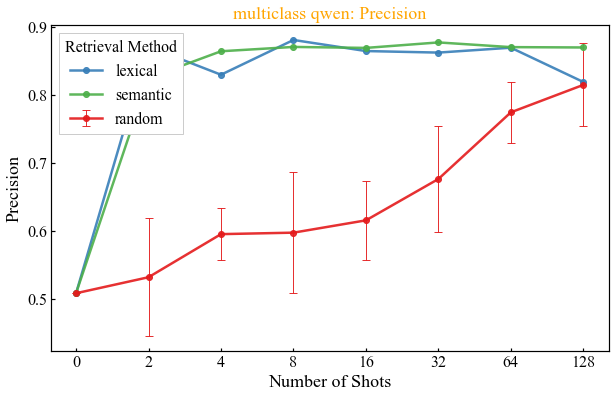

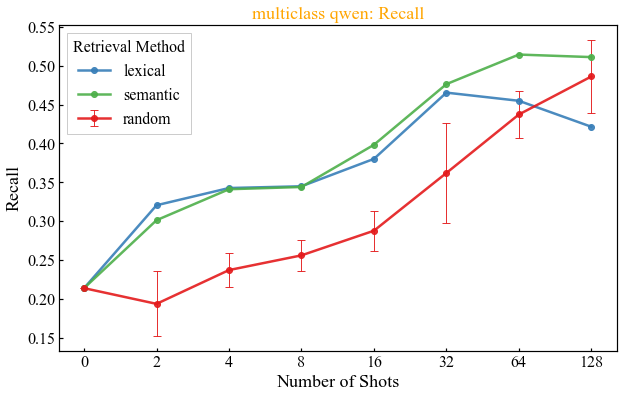

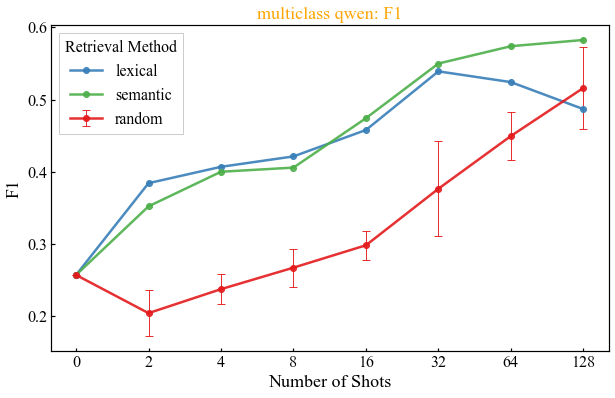

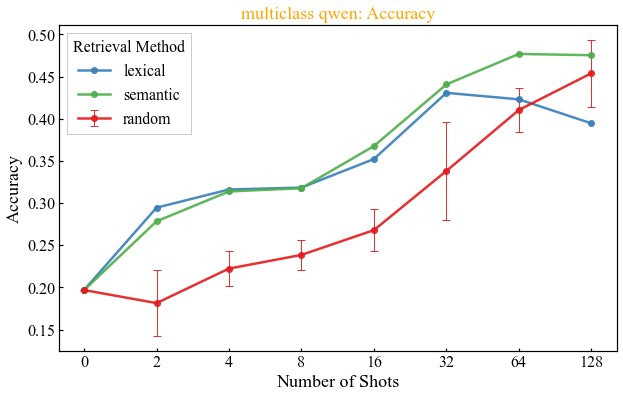

In [44]:

exp1_qwen_multiclass_performance_df = aggregate_performance_data('exp1', 'Qwen/Qwen2.5-7B-Instruct', multiclass_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'accuracy'])
display(exp1_qwen_multiclass_performance_df)
exp1_qwen_multiclass_std_df = calc_std_data('exp1', 'Qwen/Qwen2.5-7B-Instruct', multiclass_results_all_df)
visualize_performance(exp1_qwen_multiclass_performance_df, exp1_qwen_multiclass_std_df, 'qwen', task_name='multiclass', metrics=['precision', 'recall', 'f1', 'accuracy'])

## Exp1: Binary vs. Multiclass

,exp,model,random_seed,n_shots,retreival,label,precision,recall,f1
1,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,porn,0.848837,0.829545,0.839080
2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,gambling,0.927711,0.754902,0.832432
3,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,drug,0.931507,0.764045,0.839506
4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,data-theft,0.979592,0.880734,0.927536
5,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,money-laundry,0.883495,0.892157,0.887805
6,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,counterfeit,0.907895,0.784091,0.841463
7,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,advertisement,0.824176,0.833333,0.828729
8,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,weapon,1.000000,0.951923,0.975369
9,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,others,0.591463,0.898148,0.713235
10,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,surrogacy,0.990654,0.954955,0.972477


,exp,model,random_seed,n_shots,retreival,label,precision,recall,f1
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,overall,0.884411,0.835376,0.854703


,exp,model,random_seed,n_shots,retrieval,precision,recall,f1,accuracy
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.904762,0.94636,0.925094,0.927074


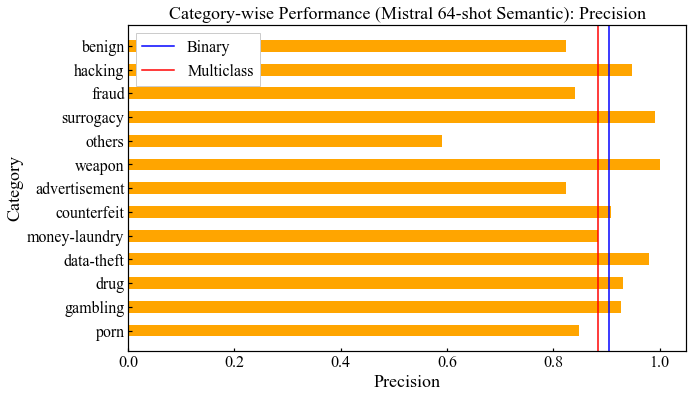

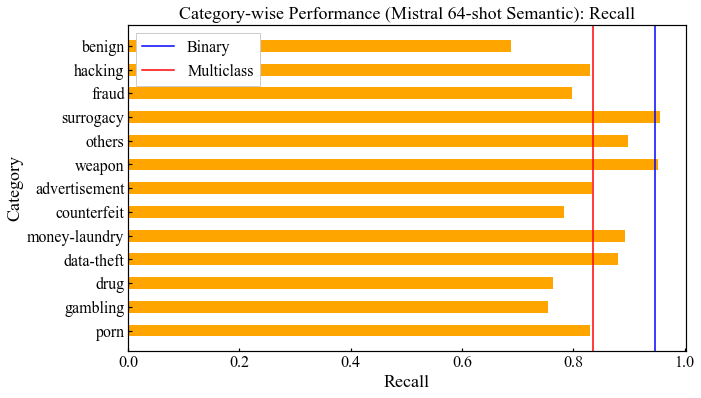

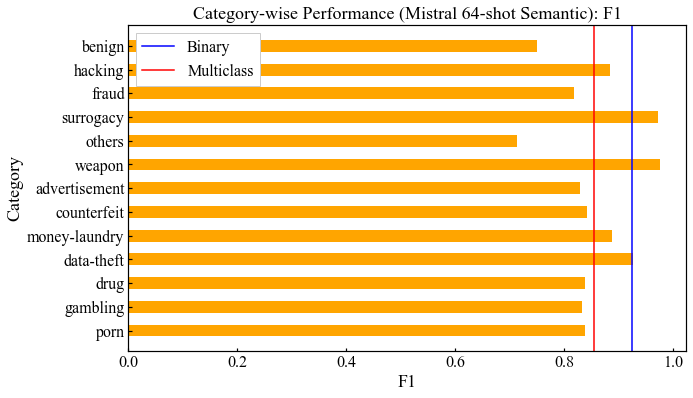

In [45]:

# multiclass mistral semantic 64-shot v.s. binary mistral semantic 64-shot

multiclass_exp1_performance_df = pd.DataFrame(results_all)
multiclass_exp1_performance_df = multiclass_exp1_performance_df[(multiclass_exp1_performance_df['exp'] == 'exp1') & (multiclass_exp1_performance_df['task'] == 'category') & (multiclass_exp1_performance_df['model'] == 'mistralai/Mistral-7B-Instruct-v0.2') & (multiclass_exp1_performance_df['retrieval'] == 'semantic') & (multiclass_exp1_performance_df['n_shots'] == 64)]
metrics_df = []
for label, metrics in multiclass_exp1_performance_df['metrics'].values[0].items():
    metrics_df.append({'exp': 'exp1', 'model': 'mistralai/Mistral-7B-Instruct-v0.2', 'random_seed': 42, 'n_shots': 64, 'retreival': 'semantic',  'label': label, 'precision': metrics['precision'], 'recall': metrics['recall'], 'f1': metrics['f1']})
multiclass_exp1_performance_df = pd.DataFrame(metrics_df)
overall_df = multiclass_exp1_performance_df[multiclass_exp1_performance_df['label'] == 'overall']
multiclass_exp1_performance_df.drop(multiclass_exp1_performance_df[multiclass_exp1_performance_df['label'] == 'overall'].index, inplace=True)

binary_exp1_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'accuracy'], filtered_shots=[64], filtered_retrieval_name=['semantic'])

display(multiclass_exp1_performance_df)
display(overall_df)
display(binary_exp1_performance_df)

for metric in ['precision', 'recall', 'f1']:
    plt.figure(figsize=(10, 6))
    
    X = np.array(multiclass_exp1_performance_df['label'])
    Y = np.array(multiclass_exp1_performance_df[metric])
    plt.barh(X, Y, color='orange', height=0.5)
    plt.axvline(x=binary_exp1_performance_df[metric].mean(), color='blue', linestyle='-', label='Binary')
    plt.axvline(x=overall_df[metric].mean(), color='red', linestyle='-', label='Multiclass')
    plt.legend(loc='best')
    plt.title(f'Category-wise Performance (Mistral 64-shot Semantic): {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    plt.ylabel('Category')
    plt.xlabel(metric.capitalize())
    plt.show()

,exp,model,random_seed,n_shots,retreival,label,precision,recall,f1
1,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,porn,0.848837,0.829545,0.839080
2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,gambling,0.927711,0.754902,0.832432
3,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,drug,0.931507,0.764045,0.839506
4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,data-theft,0.979592,0.880734,0.927536
5,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,money-laundry,0.883495,0.892157,0.887805
6,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,counterfeit,0.907895,0.784091,0.841463
7,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,advertisement,0.824176,0.833333,0.828729
8,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,weapon,1.000000,0.951923,0.975369
9,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,others,0.591463,0.898148,0.713235
10,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,surrogacy,0.990654,0.954955,0.972477


,exp,model,random_seed,n_shots,retreival,label,precision,recall,f1
1,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,porn,0.869048,0.829545,0.848837
2,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,gambling,0.928571,0.764706,0.838710
3,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,drug,0.929577,0.741573,0.825000
4,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,data-theft,0.979381,0.871560,0.922330
5,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,money-laundry,0.865385,0.882353,0.873786
6,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,counterfeit,0.883117,0.772727,0.824242
7,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,advertisement,0.824742,0.888889,0.855615
8,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,weapon,1.000000,0.951923,0.975369
9,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,others,0.573099,0.907407,0.702509
10,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,surrogacy,0.963964,0.963964,0.963964


,exp,model,random_seed,n_shots,retreival,label,precision,recall,f1
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,overall,0.884411,0.835376,0.854703


,exp,model,random_seed,n_shots,retreival,label,precision,recall,f1
0,exp1_detailed,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,overall,0.882278,0.831918,0.850729


,exp,model,random_seed,n_shots,retrieval,precision,recall,f1,accuracy
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.904762,0.94636,0.925094,0.927074


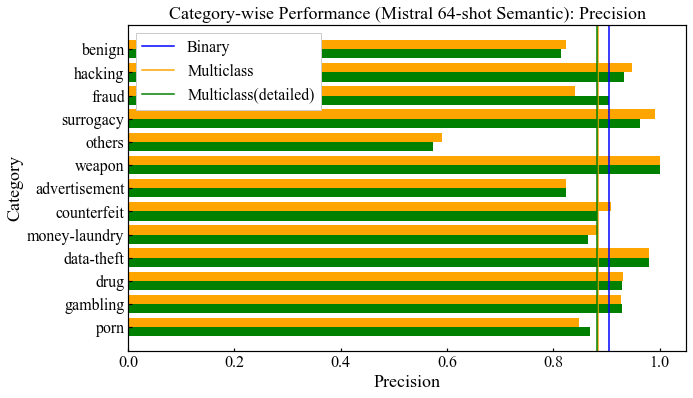

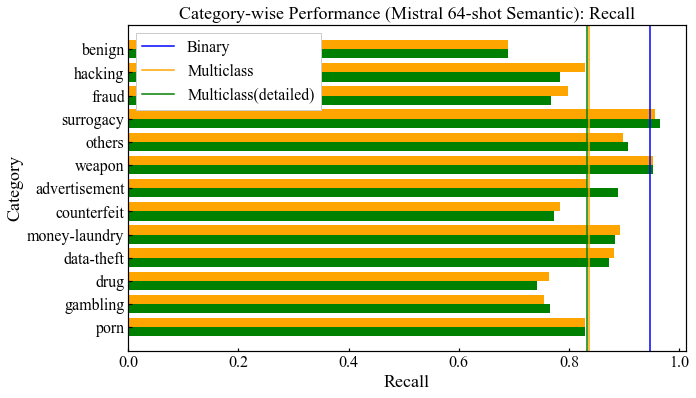

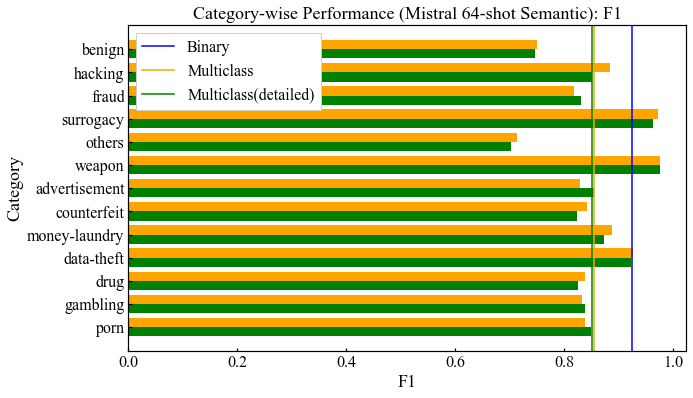

In [46]:

# multiclass mistral semantic 64-shot (detailed) v.s. binary mistral semantic 64-shot

multiclass_exp1_performance_df = pd.DataFrame(results_all)
multiclass_exp1_performance_df = multiclass_exp1_performance_df[(multiclass_exp1_performance_df['exp'] == 'exp1') & (multiclass_exp1_performance_df['task'] == 'category') & (multiclass_exp1_performance_df['model'] == 'mistralai/Mistral-7B-Instruct-v0.2') & (multiclass_exp1_performance_df['retrieval'] == 'semantic') & (multiclass_exp1_performance_df['n_shots'] == 64)]
metrics_df = []
for label, metrics in multiclass_exp1_performance_df['metrics'].values[0].items():
    metrics_df.append({'exp': 'exp1', 'model': 'mistralai/Mistral-7B-Instruct-v0.2', 'random_seed': 42, 'n_shots': 64, 'retreival': 'semantic',  'label': label, 'precision': metrics['precision'], 'recall': metrics['recall'], 'f1': metrics['f1']})
multiclass_exp1_performance_df = pd.DataFrame(metrics_df)
overall_df = multiclass_exp1_performance_df[multiclass_exp1_performance_df['label'] == 'overall']
multiclass_exp1_performance_df.drop(multiclass_exp1_performance_df[multiclass_exp1_performance_df['label'] == 'overall'].index, inplace=True)

multiclass_exp1_detailed_performance_df = pd.DataFrame(results_all)
multiclass_exp1_detailed_performance_df = multiclass_exp1_detailed_performance_df[(multiclass_exp1_detailed_performance_df['exp'] == 'exp1_detailed') & (multiclass_exp1_detailed_performance_df['task'] == 'category') & (multiclass_exp1_detailed_performance_df['model'] == 'mistralai/Mistral-7B-Instruct-v0.2') & (multiclass_exp1_detailed_performance_df['retrieval'] == 'semantic') & (multiclass_exp1_detailed_performance_df['n_shots'] == 64)]
metrics_df = []
for label, metrics in multiclass_exp1_detailed_performance_df['metrics'].values[0].items():
    metrics_df.append({'exp': 'exp1_detailed', 'model': 'mistralai/Mistral-7B-Instruct-v0.2', 'random_seed': 42, 'n_shots': 64, 'retreival': 'semantic',  'label': label, 'precision': metrics['precision'], 'recall': metrics['recall'], 'f1': metrics['f1']})
multiclass_exp1_detailed_performance_df = pd.DataFrame(metrics_df)
overall_detailed_df = multiclass_exp1_detailed_performance_df[multiclass_exp1_detailed_performance_df['label'] == 'overall']
multiclass_exp1_detailed_performance_df.drop(multiclass_exp1_detailed_performance_df[multiclass_exp1_detailed_performance_df['label'] == 'overall'].index, inplace=True)

binary_exp1_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', binary_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'accuracy'], filtered_shots=[64], filtered_retrieval_name=['semantic'])

display(multiclass_exp1_performance_df)
display(multiclass_exp1_detailed_performance_df)
display(overall_df)
display(overall_detailed_df)
display(binary_exp1_performance_df)

for metric in ['precision', 'recall', 'f1']:
    plt.figure(figsize=(10, 6))
    
    X = np.array(multiclass_exp1_detailed_performance_df['label'])
    Y = np.array(multiclass_exp1_performance_df[metric])
    Y_detailed = np.array(multiclass_exp1_detailed_performance_df[metric])
    plt.yticks(np.arange(len(X)), X)
    plt.barh(np.arange(len(X))+0.2, Y, color='orange', height=0.4)
    plt.barh(np.arange(len(X))-0.2, Y_detailed, color='green', height=0.4)
    plt.axvline(x=binary_exp1_performance_df[metric].mean(), color='blue', linestyle='-', label='Binary', linewidth=1.5)
    plt.axvline(x=overall_df[metric].mean(), color='orange', linestyle='-', label='Multiclass', linewidth=1.5)
    plt.axvline(x=overall_detailed_df[metric].mean(), color='green', linestyle='-', label='Multiclass(detailed)', linewidth=1.5)
    plt.legend(loc='best')
    plt.title(f'Category-wise Performance (Mistral 64-shot Semantic): {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    plt.ylabel('Category')
    plt.xlabel(metric.capitalize())
    plt.show()

## Exp2 Finetuned

,exp,task,model,random_seed,n_shots,retrieval,precision,recall,f1,accuracy
0,exp2_finetuned,category,mistral_lora_model_325_e1,42,0,random,0.526012,0.205543,0.233330,0.191795
1,exp2_finetuned,category,mistral_lora_model_325_e2,42,0,random,0.579752,0.249456,0.264070,0.228205
2,exp2_finetuned,category,mistral_lora_model_325_e3,44,0,random,0.679916,0.294891,0.310978,0.268462
3,exp2_finetuned,category,mistral_lora_model_650_e1,42,0,random,0.646126,0.286442,0.288833,0.264615
4,exp2_finetuned,category,mistral_lora_model_650_e2,42,0,random,0.691888,0.350513,0.361653,0.323590
5,exp2_finetuned,category,mistral_lora_model_650_e3,42,0,random,0.822819,0.427994,0.464432,0.394103
6,exp2_finetuned,category,mistral_lora_model_1300_e1,42,0,random,0.706833,0.309124,0.318413,0.282564
7,exp2_finetuned,category,mistral_lora_model_1300_e2,42,0,random,0.841247,0.441821,0.488858,0.398974
8,exp2_finetuned,category,mistral_lora_model_1300_e3,42,0,random,0.886670,0.573658,0.638838,0.521538
9,exp2_finetuned,category,mistral_lora_model_2600_e1,42,0,random,0.862802,0.340633,0.371705,0.314872


,exp,model,random_seed,n_shots,retrieval,precision,recall,f1,accuracy
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.884411,0.835376,0.854703,0.836154


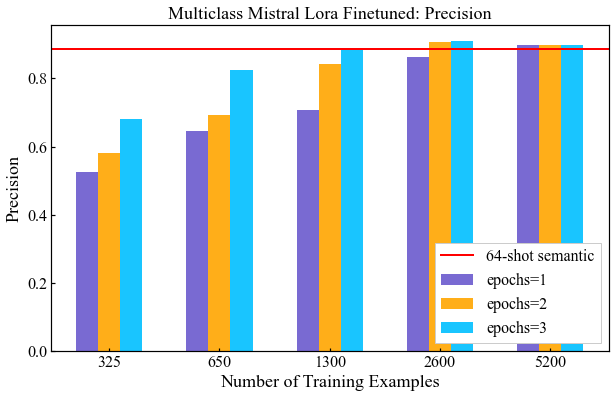

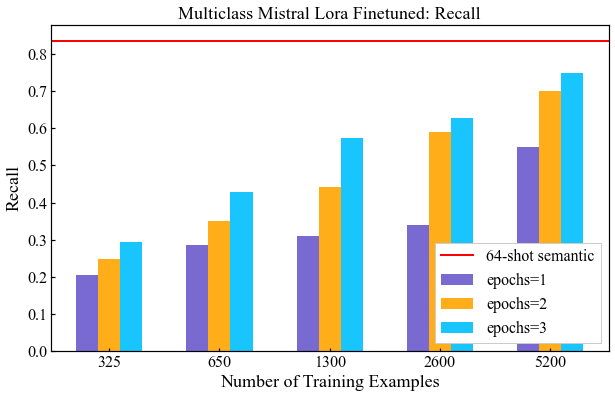

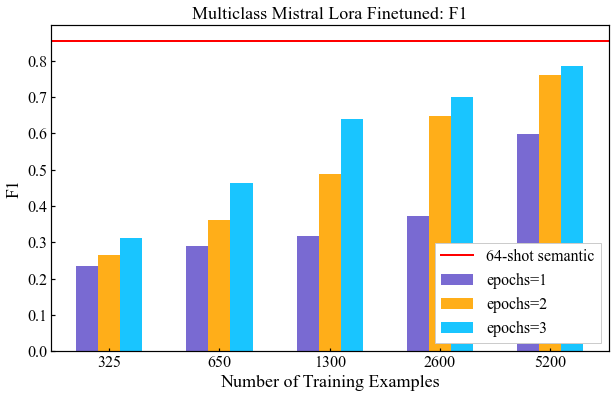

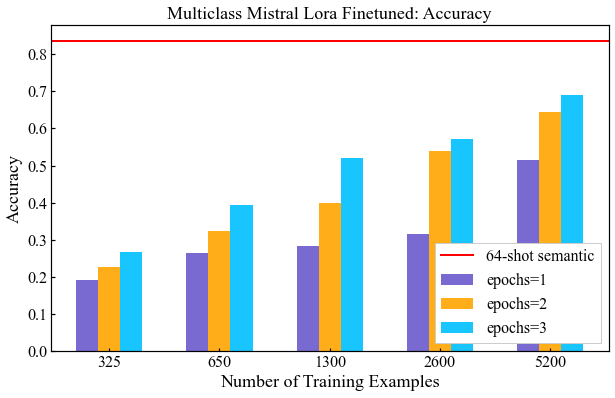

In [47]:
exp2_finetuned_df = pd.DataFrame(multiclass_results_all_df[(multiclass_results_all_df['exp'] == 'exp2_finetuned')])

performance_dfs = []
for K in [325, 650, 1300, 2600, 5200]:
  for e in [1,2,3]:
    temp_df = pd.DataFrame(multiclass_results_all_df[multiclass_results_all_df['model'] == f'mistral_lora_model_{K}_e{e}'])
    metrics_columns = ['precision', 'recall', 'f1', 'accuracy']
    aggregation_dict = {col: 'mean' if col in metrics_columns else 'first' for col in temp_df.columns}
    performance_row = temp_df.groupby('n_shots').agg(aggregation_dict).reset_index(drop=True)
    performance_dfs.append(performance_row)

exp2_finetuned_df = pd.concat(performance_dfs, ignore_index=True)
display(exp2_finetuned_df)

multiclass_exp1_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'accuracy'], filtered_retrieval_name=['semantic'], filtered_shots=[64])
display(multiclass_exp1_performance_df)

X = [325, 650, 1300, 2600, 5200]
X_str = ['325', '650', '1300', '2600', '5200']

for metric in ['precision', 'recall', 'f1', 'accuracy']:

  plt.figure(figsize=(10, 6))
  plt.xticks(np.arange(5), X_str)

  Y_1 = []
  Y_2 = []
  Y_3 = []
  for K in X:
    Y_1.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e1')][metric].mean())
    Y_2.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e2')][metric].mean())
    Y_3.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e3')][metric].mean())
  plt.bar(np.array(range(5))-0.2, Y_1, color='slateblue', alpha=0.9, label=f'epochs=1', width=0.2)
  plt.bar(np.array(range(5)), Y_2, color='orange', alpha=0.9, label=f'epochs=2', width=0.2)
  plt.bar(np.array(range(5))+0.2, Y_3, color='deepskyblue', alpha=0.9, label=f'epochs=3', width=0.2)
  plt.axhline(y=multiclass_exp1_performance_df[metric].mean(), color='red', linestyle='-', label='64-shot semantic', linewidth=2)

  plt.legend(loc='lower right')
  plt.title(f'Multiclass Mistral Lora Finetuned: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
  plt.xlabel('Number of Training Examples')
  plt.ylabel(metric.capitalize())
  plt.show()

### Figure 6

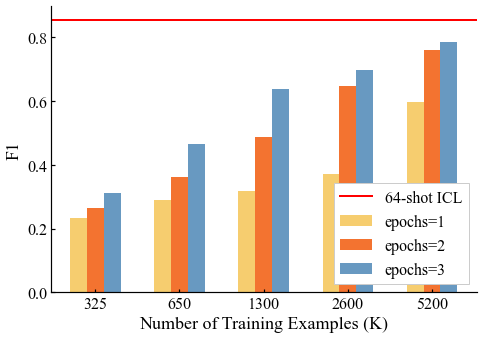

In [48]:
exp2_finetuned_df = pd.DataFrame(multiclass_results_all_df[(multiclass_results_all_df['exp'] == 'exp2_finetuned')])

performance_dfs = []
for K in [325, 650, 1300, 2600, 5200]:
  for e in [1,2,3]:
    temp_df = pd.DataFrame(multiclass_results_all_df[multiclass_results_all_df['model'] == f'mistral_lora_model_{K}_e{e}'])
    metrics_columns = ['precision', 'recall', 'f1', 'accuracy']
    aggregation_dict = {col: 'mean' if col in metrics_columns else 'first' for col in temp_df.columns}
    performance_row = temp_df.groupby('n_shots').agg(aggregation_dict).reset_index(drop=True)
    performance_dfs.append(performance_row)

exp2_finetuned_df = pd.concat(performance_dfs, ignore_index=True)
# display(exp2_finetuned_df)

multiclass_exp1_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df, filtered_metrics=['precision', 'recall', 'f1' , 'accuracy'], filtered_retrieval_name=['semantic'], filtered_shots=[64])
# display(multiclass_exp1_performance_df)

X = [325, 650, 1300, 2600, 5200]
X_str = ['325', '650', '1300', '2600', '5200']
colors = ['#F6C85F', '#F26419', '#588ebb']

for metric in ['f1']:
    fig, ax = plt.subplots(figsize=(7, 5))
    ax.set_xticks(np.arange(5))
    ax.set_xticklabels(X_str)

    Y_1 = []
    Y_2 = []
    Y_3 = []
    for K in X:
        Y_1.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e1')][metric].mean())
        Y_2.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e2')][metric].mean())
        Y_3.append(exp2_finetuned_df[(exp2_finetuned_df['model'] == f'mistral_lora_model_{K}_e3')][metric].mean())
    ax.bar(np.array(range(5))-0.2, Y_1, color=colors[0], alpha=0.9, label=f'epochs=1', width=0.2)
    ax.bar(np.array(range(5)), Y_2, color=colors[1], alpha=0.9, label=f'epochs=2', width=0.2)
    ax.bar(np.array(range(5))+0.2, Y_3, color=colors[2], alpha=0.9, label=f'epochs=3', width=0.2)
    ax.axhline(y=multiclass_exp1_performance_df[metric].mean(), color='red', linestyle='-', label='64-shot ICL', linewidth=2)
    ax.legend(loc='lower right')
    # ax.set_title(f'Multiclass Mistral Lora Finetuned: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    ax.set_xlabel('Number of Training Examples (K)')
    ax.set_ylabel(metric.capitalize())

    # Clean spines
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    ax.tick_params(top=False, right=False)

    plt.tight_layout()
    # plt.show()
    for fig_num in plt.get_fignums():
        fig = plt.figure(fig_num)
        for ax in fig.axes:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.tick_params(top=False, right=False)
            fig = plt.gcf()

            filename_base = f"exp2_finetuned_multiclass_mistral_f1"
            fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

            # plt.close(fig)

## Exp3 Shot Order

In [49]:
exp3_shotorder_random_std_df = calc_std_data('exp3_shotorder', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df, retrieval_name='random')
display(exp3_shotorder_random_std_df)

,exp,task,model,random_seed,n_shots,retrieval,precision_std,recall_std,f1_std,accuracy_std
0,exp3_shotorder,category,mistralai/Mistral-7B-Instruct-v0.2,42,4,random,0.016599,0.010277,0.018812,0.009524
1,exp3_shotorder,category,mistralai/Mistral-7B-Instruct-v0.2,42,8,random,0.019056,0.019281,0.018243,0.016521
2,exp3_shotorder,category,mistralai/Mistral-7B-Instruct-v0.2,42,16,random,0.016378,0.018944,0.018249,0.016809
3,exp3_shotorder,category,mistralai/Mistral-7B-Instruct-v0.2,42,32,random,0.015914,0.015363,0.013220,0.013038
4,exp3_shotorder,category,mistralai/Mistral-7B-Instruct-v0.2,42,64,random,0.013222,0.016730,0.016101,0.014840


## Exp4 Shot Label Order

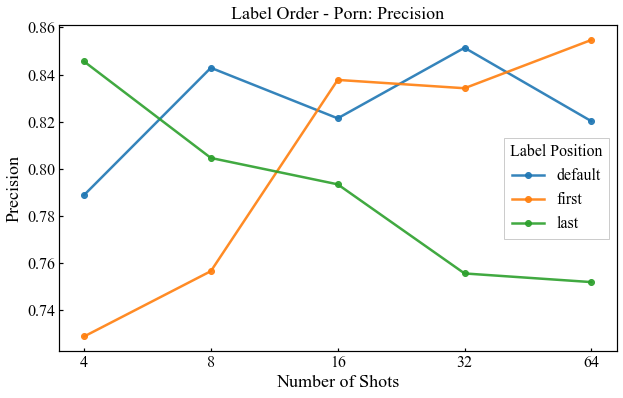

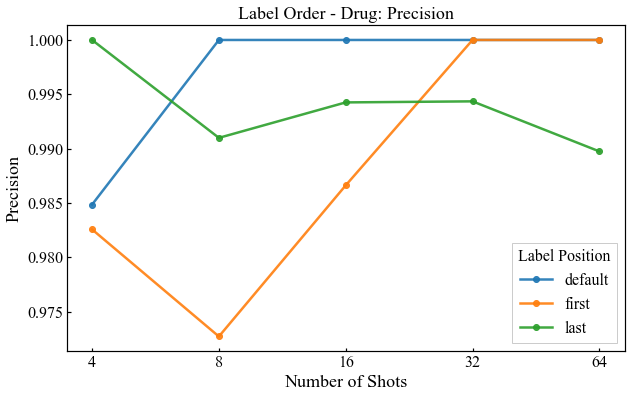

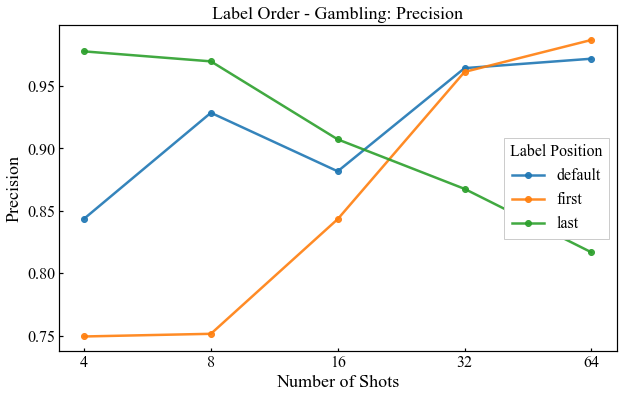

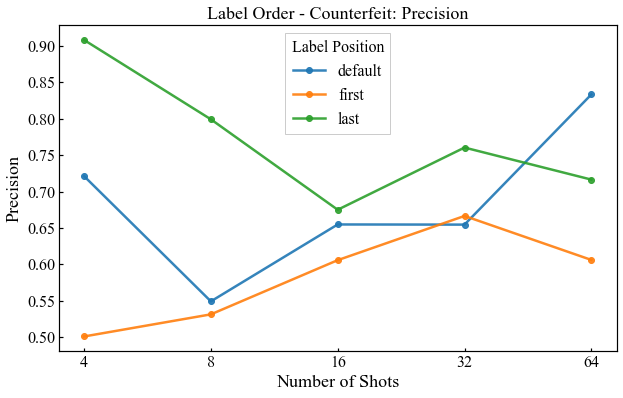

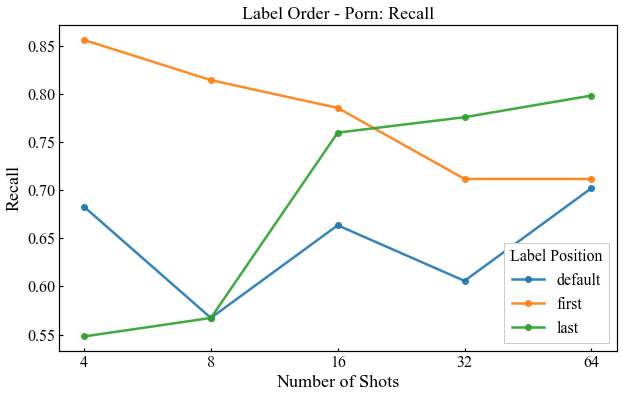

...

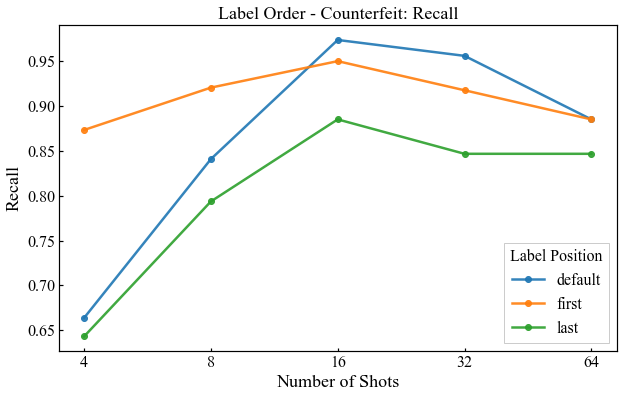

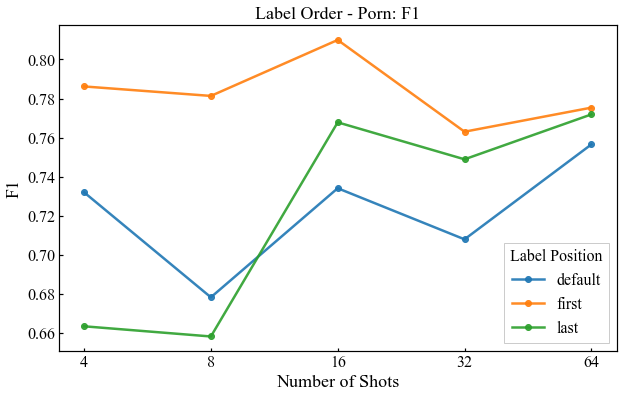

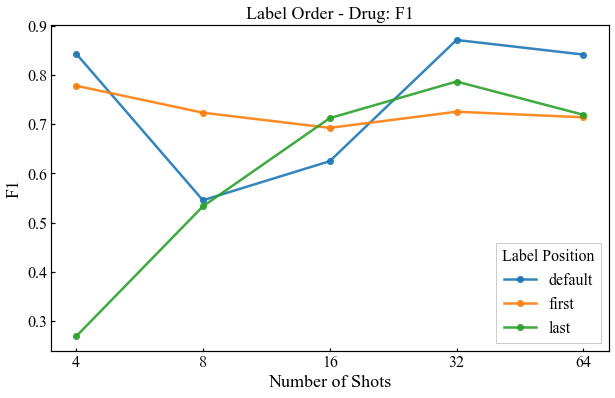

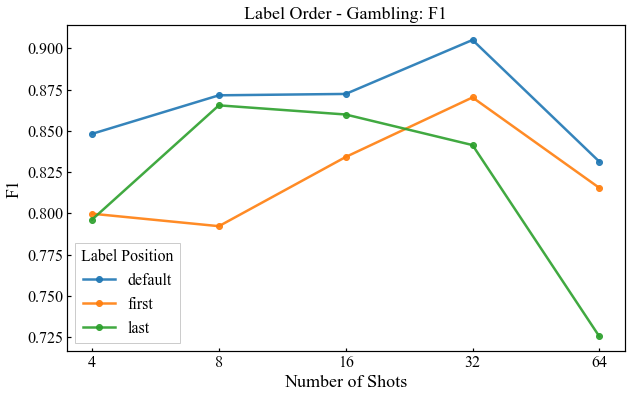

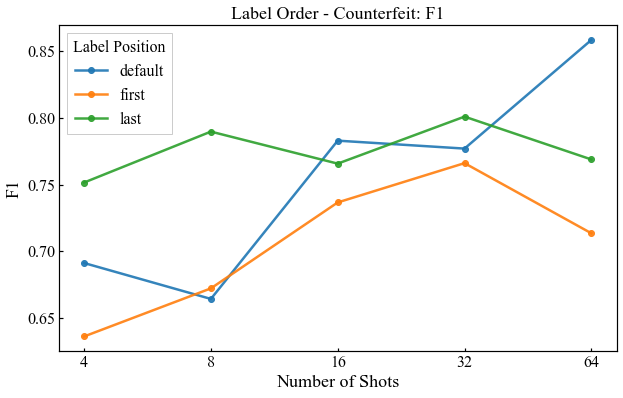

In [50]:

from itertools import permutations
labels = ['porn', 'drug', 'gambling', 'counterfeit']

exp4_porn_df = pd.DataFrame()
exp4_drug_df = pd.DataFrame()
exp4_gambling_df = pd.DataFrame()
exp4_counterfeit_df = pd.DataFrame()

temp_results_all_df = pd.DataFrame(results_all)
exp4_default_performance_df = temp_results_all_df[(temp_results_all_df['exp']=='exp4_labelorder_default')]


exp4_df = []
for label in labels:
    exp4_metrics_df = exp4_default_performance_df['metrics'].apply(pd.Series)[label].apply(pd.Series)
    exp4_labelorder_performance_df = pd.concat([exp4_default_performance_df.drop('metrics', axis=1), exp4_metrics_df], axis=1)
    exp4_labelorder_performance_df['exp'] = f'exp4_labelorder_{label}_default'
    exp4_df.append(exp4_labelorder_performance_df)
    for pos in ['first', 'last']:
        # for shot in [4, 8, 16, 32, 64]:
            exp4_labelorder_performance_df = temp_results_all_df[(temp_results_all_df['exp'] == f'exp4_labelorder_{label}_{pos}')]
            exp4_metrics_df = exp4_labelorder_performance_df['metrics'].apply(pd.Series)[label].apply(pd.Series)
            exp4_labelorder_performance_df = pd.concat([exp4_labelorder_performance_df.drop('metrics', axis=1), exp4_metrics_df], axis=1)
            # display(exp4_labelorder_performance_df)
            agg_dict = {col: 'mean' if col in ['precision', 'recall', 'f1'] else 'first' for col in exp4_labelorder_performance_df.columns}
            exp4_labelorder_performance_df = exp4_labelorder_performance_df.groupby('n_shots').agg(agg_dict).reset_index(drop=True)
            # display(exp4_labelorder_performance_df)
            exp4_df.append(exp4_labelorder_performance_df)
exp4_df = pd.concat(exp4_df, ignore_index=True)
# display(exp4_df)

metrics = ['precision', 'recall', 'f1']
for metric in metrics:
    for label in labels:
        plt.figure(figsize=(10, 6))
        plt.xticks(np.arange(len(exp4_df['n_shots'].unique().astype(np.str_))), exp4_df['n_shots'].unique().astype(np.str_))
        for pos in ['default', 'first', 'last']:
            plt.plot(exp4_df[exp4_df['exp'] == f'exp4_labelorder_{label}_{pos}']['n_shots'].unique().astype(np.str_), exp4_df[exp4_df['exp'] == f'exp4_labelorder_{label}_{pos}'][metric], marker='o', linestyle='-', linewidth=2.5, alpha=0.9, label=pos)
        plt.legend(loc='best', title='Label Position')
        plt.title(f'Label Order - {label.capitalize()}: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
        plt.xlabel('Number of Shots')
        plt.ylabel(f'{metric.capitalize()}')
        plt.show()


## Exp6 Generalization

,label,zero-shot,included,excluded,gap over zero,gap over included
11,hacking,0.901099,0.945701,0.954955,0.053856,0.009254
8,others,0.886139,0.907950,0.907950,0.021811,0.000000
2,drug,0.910314,0.973333,0.955752,0.045438,-0.017581
5,counterfeit,0.682796,0.881579,0.857143,0.174347,-0.024436
3,data-theft,0.691589,0.957364,0.922481,0.230892,-0.034884
0,porn,0.849741,0.864253,0.822115,-0.027626,-0.042138
10,fraud,0.512397,0.937759,0.878049,0.365652,-0.059711
12,benign,0.878906,0.842553,0.777778,-0.101128,-0.064775
1,gambling,0.598837,0.803493,0.671111,0.072274,-0.132382
7,weapon,0.660000,0.939271,0.793388,0.133388,-0.145883


| label         |   zero-shot |   included |   excluded |   gap over zero |   gap over included |
|:--------------|------------:|-----------:|-----------:|----------------:|--------------------:|
| hacking       |    0.901099 |   0.945701 |   0.954955 |       0.0538561 |           0.0092536 |
| others        |    0.886139 |   0.90795  |   0.90795  |       0.0218112 |           0         |
| drug          |    0.910314 |   0.973333 |   0.955752 |       0.0454383 |          -0.0175811 |
| counterfeit   |    0.682796 |   0.881579 |   0.857143 |       0.174347  |          -0.0244361 |
| data-theft    |    0.691589 |   0.957364 |   0.922481 |       0.230892  |          -0.0348837 |
| porn          |    0.849741 |   0.864253 |   0.822115 |      -0.0276255 |          -0.042138  |
| fraud         |    0.512397 |   0.937759 |   0.878049 |       0.365652  |          -0.0597106 |
| benign        |    0.878906 |   0.842553 |   0.777778 |      -0.101128  |          -0.0647754 |
| gambling      |   

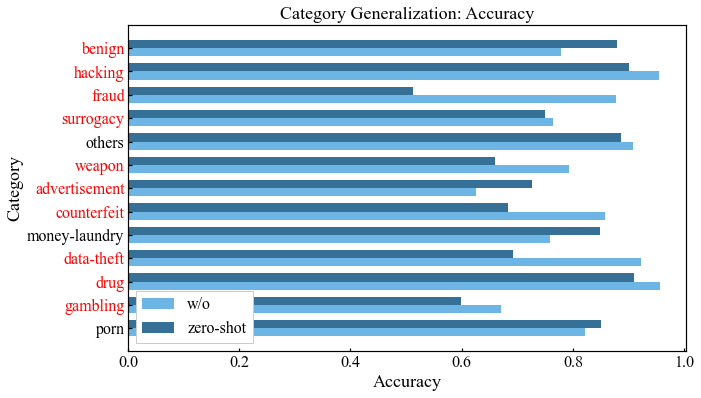

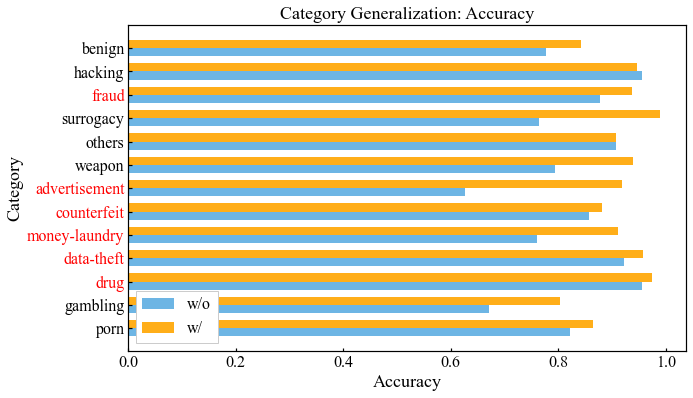

In [51]:

exp6_results_df = pd.DataFrame(results_all)
exp6_results_df = exp6_results_df[exp6_results_df['task'] == 'binary_generalization']
exp6_metrics_df = exp6_results_df['metrics'].apply(pd.Series)['accuracy']
exp6_results_df = pd.concat([exp6_results_df.drop('metrics', axis=1), exp6_metrics_df], axis=1)
# display(exp6_results_df)

labels = ['porn', 'gambling', 'drug', 'data-theft', 'money-laundry', 'counterfeit', 'advertisement', 'weapon', 'others', 'surrogacy', 'fraud', 'hacking', 'benign']


X = np.arange(len(labels))
Y_zero = []
Y_included = []
Y_excluded = []

for label in labels:
    Y_zero.append(exp6_results_df[exp6_results_df['exp'] == f'exp6_generalization_{label}_zero']['accuracy'].mean()) # zero-shot
    Y_included.append(exp6_results_df[exp6_results_df['exp'] == f'exp6_generalization_{label}_included']['accuracy'].mean()) # included
    Y_excluded.append(exp6_results_df[exp6_results_df['exp'] == f'exp6_generalization_{label}_excluded']['accuracy'].mean()) # excluded

temp_df = pd.DataFrame({'label': labels, 'zero-shot': Y_zero, 'included': Y_included, 'excluded': Y_excluded, 'gap over zero': np.array(Y_excluded) - np.array(Y_zero), 'gap over included': np.array(Y_excluded) - np.array(Y_included)})
temp_df = temp_df.sort_values(by='gap over included', ascending=False)
display(temp_df)
print(temp_df.to_markdown(index=False))

# zero-shot
fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.35
plt.barh(X-bar_width/2, Y_excluded, color='#5DADE2', height=bar_width, label='w/o', alpha=0.9)
plt.barh(X+bar_width/2, Y_zero, color='#21618C', height=bar_width, label='zero-shot', alpha=0.9)
ax.set_yticks(X)
ax.set_yticklabels(labels)
plt.legend(loc='lower left')
plt.title(f'Category Generalization: Accuracy', loc='center', fontsize=18, fontweight=0)
plt.ylabel('Category')
plt.xlabel('Accuracy')

for label in ax.get_yticklabels():
    if label.get_text() not in ['others', 'money-laundry', 'porn']:
        label.set_color('red')
plt.show()

# included
fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.35
plt.barh(X-bar_width/2, Y_excluded, color='#5DADE2', height=bar_width, label='w/o', alpha=0.9)
plt.barh(X+bar_width/2, Y_included, color='orange', height=bar_width, label='w/', alpha=0.9)
ax.set_yticks(X)
ax.set_yticklabels(labels)
plt.legend(loc='lower left')
plt.title(f'Category Generalization: Accuracy', loc='center', fontsize=18, fontweight=0)
plt.ylabel('Category')
plt.xlabel('Accuracy')

for label in ax.get_yticklabels():
    if label.get_text() in ['fraud', 'advertisement', 'counterfeit', 'data-theft', 'drug', 'money-laundry']:
        label.set_color('red')

plt.show()

## Exp7 Needle in Haystack

,n_shots,model,random_seed,retrieval,accuracy_in-demo,accuracy_not-in-demo
0,2,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.730000,0.416462
1,4,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.790769,0.431538
2,8,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.866923,0.428385
3,16,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.884615,0.491462
4,32,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.883077,0.565692
5,64,mistralai/Mistral-7B-Instruct-v0.2,42,random,0.857692,0.651692


,n_shots,model,random_seed,retrieval,accuracy_in-demo,accuracy_not-in-demo
0,2,microsoft/Phi-3-small-128k-instruct,42,random,0.931923,0.691297
1,4,microsoft/Phi-3-small-128k-instruct,42,random,0.954756,0.694063
2,8,microsoft/Phi-3-small-128k-instruct,42,random,0.967880,0.715767
3,16,microsoft/Phi-3-small-128k-instruct,42,random,0.968687,0.726123
4,32,microsoft/Phi-3-small-128k-instruct,42,random,0.988439,0.780887
5,64,microsoft/Phi-3-small-128k-instruct,42,random,0.971311,0.818388


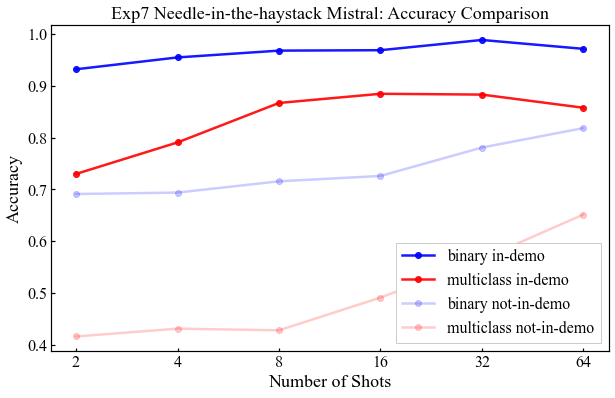

In [52]:

multiclass_exp7_haystack_performance_df = aggregate_performance_data('exp7_haystack', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df, filtered_metrics=['accuracy'])
multiclass_exp1_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df, filtered_metrics=['accuracy'], filtered_retrieval_name=['random'], filtered_shots=[2,4,8,16,32,64])
multiclass_comparison_df = pd.merge(multiclass_exp7_haystack_performance_df, multiclass_exp1_df, on=['model', 'random_seed', 'n_shots', 'retrieval'], suffixes=('_in-demo', '_not-in-demo')).drop('exp_in-demo', axis=1).drop('exp_not-in-demo', axis=1)


binary_exp7_haystack_performance_df = aggregate_performance_data('exp7_haystack', model, binary_results_all_df, filtered_metrics=['accuracy'], filtered_shots=[2,4,8,16,32,64])
binary_exp1_df = aggregate_performance_data('exp1', model, binary_results_all_df, filtered_metrics=['accuracy'], filtered_retrieval_name=['random'], filtered_shots=[2,4,8,16,32,64])
binary_comparison_df = pd.merge(binary_exp7_haystack_performance_df, binary_exp1_df, on=['model', 'random_seed', 'n_shots', 'retrieval'], suffixes=('_in-demo', '_not-in-demo')).drop('exp_in-demo', axis=1).drop('exp_not-in-demo', axis=1)
display(multiclass_comparison_df)
display(binary_comparison_df)

# plot
plt.figure(figsize=(10, 6))
plt.xticks(np.arange(len(binary_comparison_df['n_shots'].unique().astype(np.str_))), binary_comparison_df['n_shots'].unique().astype(np.str_))
plt.plot(binary_comparison_df['n_shots'].unique().astype(np.str_), binary_comparison_df['accuracy_in-demo'], marker='o', linestyle='-', color='blue', linewidth=2.5, alpha=0.9, label='binary in-demo')
plt.plot(multiclass_comparison_df['n_shots'].unique().astype(np.str_), multiclass_comparison_df['accuracy_in-demo'], marker='o', linestyle='-', color='red', linewidth=2.5, alpha=0.9, label='multiclass in-demo')
plt.plot(binary_comparison_df['n_shots'].unique().astype(np.str_), binary_comparison_df['accuracy_not-in-demo'], marker='o', linestyle='-', color='blue', linewidth=2.5, alpha=0.2, label='binary not-in-demo')
plt.plot(multiclass_comparison_df['n_shots'].unique().astype(np.str_), multiclass_comparison_df['accuracy_not-in-demo'], marker='o', linestyle='-', color='red', linewidth=2.5, alpha=0.2, label='multiclass not-in-demo')
plt.legend(loc='best')
plt.title(f'Exp7 Needle-in-the-haystack Mistral: Accuracy Comparison', loc='center', fontsize=18, fontweight=0)
plt.xlabel('Number of Shots')
plt.ylabel('Accuracy')
plt.show()

## Exp10 Label Name

### Figure 5b

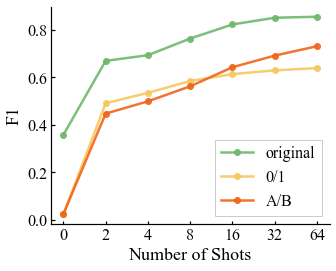

In [53]:
exp10_default_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df, filtered_retrieval_name=['semantic'])
exp10_01_performance_df = aggregate_performance_data('exp10_labelname_01', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df)
exp10_AB_performance_df = aggregate_performance_data('exp10_labelname_AB', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df)

colors = ['#6EB86C', '#F6C85F', '#F26419']
for metric in ['f1']:
    fig, ax = plt.subplots(figsize=(5, 4))

    # Clean spines
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    ax.tick_params(top=False, right=False)

    ax.set_xticks(np.arange(len(exp10_default_performance_df['n_shots'].unique().astype(np.str_))))
    ax.set_xticklabels(exp10_default_performance_df['n_shots'].unique().astype(np.str_))
    ax.plot(exp10_default_performance_df['n_shots'].unique().astype(np.str_), exp10_default_performance_df[metric], marker='o', linestyle='-', color=colors[0], linewidth=2.5, alpha=0.9, label='original')
    ax.plot(exp10_01_performance_df['n_shots'].unique().astype(np.str_), exp10_01_performance_df[metric], marker='o', linestyle='-', color=colors[1], linewidth=2.5, alpha=0.9, label='0/1')
    ax.plot(exp10_AB_performance_df['n_shots'].unique().astype(np.str_), exp10_AB_performance_df[metric], marker='o', linestyle='-', color=colors[2], linewidth=2.5, alpha=0.9, label='A/B')
    ax.legend(loc='best')
    # plt.title(f'Binary Exp10 Label Name: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    ax.set_xlabel('Number of Shots')
    ax.set_ylabel(metric.capitalize())
    # plt.show()
    for fig_num in plt.get_fignums():
        fig = plt.figure(fig_num)
        for ax in fig.axes:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)
            ax.tick_params(top=False, right=False)
            fig = plt.gcf()

            filename_base = f"exp10_multi_label_name"
            fig.savefig(f"./Figure/{filename_base}.pdf", format='pdf', bbox_inches='tight', pad_inches=0.02, dpi=300)

            # plt.close(fig)

,exp,model,random_seed,n_shots,retrieval,precision,recall,f1,fpr,accuracy
0,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,0,semantic,0.584435,0.342044,0.357315,NaN,0.312308
1,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,2,semantic,0.794151,0.652318,0.668971,NaN,0.596154
2,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,4,semantic,0.797662,0.678078,0.692814,NaN,0.617692
3,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,8,semantic,0.831505,0.745055,0.762937,NaN,0.679231
4,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,16,semantic,0.860778,0.810301,0.822298,NaN,0.737692
5,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,32,semantic,0.882172,0.834908,0.850444,NaN,0.760000
6,exp1,mistralai/Mistral-7B-Instruct-v0.2,42,64,semantic,0.884411,0.835376,0.854703,NaN,0.836154


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.029492,0.076607,0.022324,NaN,0.078462
1,2,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.519144,0.508294,0.490418,NaN,0.506923
2,4,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.541188,0.563646,0.534270,NaN,0.560769
3,8,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.579357,0.620160,0.584138,NaN,0.617692
4,16,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.602462,0.653080,0.613061,NaN,0.650000
5,32,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.613663,0.672148,0.628834,NaN,0.668462
6,64,exp10_labelname_01,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.627434,0.679408,0.638306,NaN,0.676923


,n_shots,exp,model,random_seed,retrieval,precision,recall,f1,fpr,accuracy
0,0,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.074706,0.017168,0.023585,NaN,0.017692
1,2,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.630501,0.402974,0.446994,NaN,0.400000
2,4,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.693896,0.423938,0.498422,NaN,0.424615
3,8,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.780992,0.463536,0.561729,NaN,0.469231
4,16,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.847621,0.532104,0.642209,NaN,0.537692
5,32,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.889909,0.590173,0.691007,NaN,0.593846
6,64,exp10_labelname_AB,mistralai/Mistral-7B-Instruct-v0.2,42,semantic,0.897382,0.642498,0.730629,NaN,0.645385


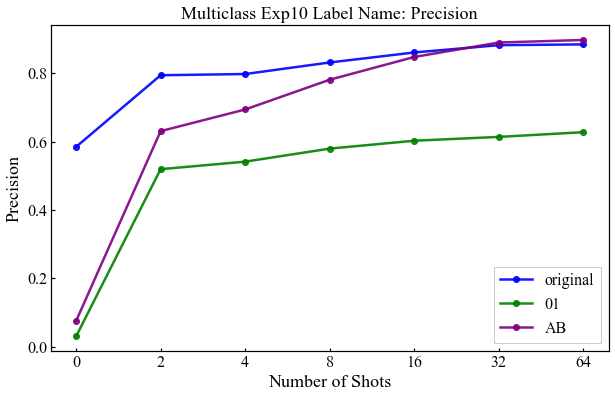

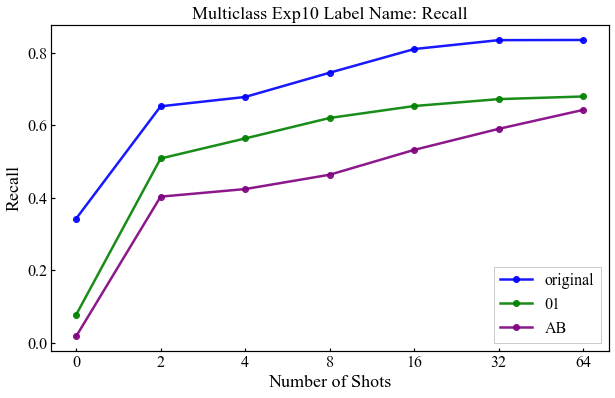

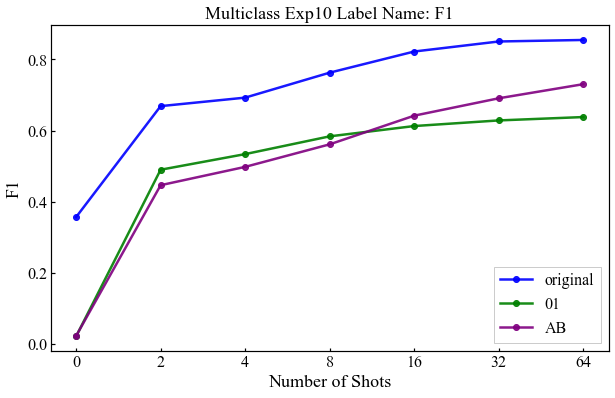

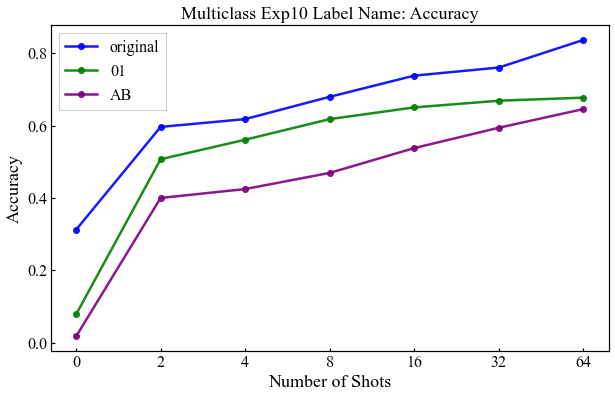

In [54]:

exp10_default_performance_df = aggregate_performance_data('exp1', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df, filtered_retrieval_name=['semantic'])
exp10_01_performance_df = aggregate_performance_data('exp10_labelname_01', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df)
exp10_AB_performance_df = aggregate_performance_data('exp10_labelname_AB', 'mistralai/Mistral-7B-Instruct-v0.2', multiclass_results_all_df)

display(exp10_default_performance_df)
display(exp10_01_performance_df)
display(exp10_AB_performance_df)

for metric in ['precision', 'recall', 'f1', 'accuracy']:
    plt.figure(figsize=(10, 6))
    plt.xticks(np.arange(len(exp10_default_performance_df['n_shots'].unique().astype(np.str_))), exp10_default_performance_df['n_shots'].unique().astype(np.str_))
    plt.plot(exp10_default_performance_df['n_shots'].unique().astype(np.str_), exp10_default_performance_df[metric], marker='o', linestyle='-', color='blue', linewidth=2.5, alpha=0.9, label='original')
    plt.plot(exp10_01_performance_df['n_shots'].unique().astype(np.str_), exp10_01_performance_df[metric], marker='o', linestyle='-', color='green', linewidth=2.5, alpha=0.9, label='01')
    plt.plot(exp10_AB_performance_df['n_shots'].unique().astype(np.str_), exp10_AB_performance_df[metric], marker='o', linestyle='-', color='purple', linewidth=2.5, alpha=0.9, label='AB')
    plt.legend(loc='best')
    plt.title(f'Multiclass Exp10 Label Name: {metric.capitalize()}', loc='center', fontsize=18, fontweight=0)
    plt.xlabel('Number of Shots')
    plt.ylabel(metric.capitalize())
    plt.show()